In [1]:
import os

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

# 解壓縮資料

In [2]:
def unzip_data(path):
    for folder, _, files in os.walk(path):
        for file in files:
            if file.endswith('zip'):
                file_path = os.path.join(folder, file)
                print(file_path)

                sotre_path = os.path.join(folder, file.rsplit('.')[0])
                # 開啟 ZIP 壓縮檔 
                with zipfile.ZipFile(file_path, 'r') as zf:
                    # 解壓縮所有檔案至 /my/folder 目錄
                    zf.extractall(path=sotre_path)

In [3]:
# unzip_data('./swing')

In [4]:
def convert_csv(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=',')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=',')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=',')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=',')
    device_df = pd.read_csv(os.path.join(path, 'meta', 'device.csv'), delimiter=',')
    time_df = pd.read_csv(os.path.join(path, 'meta', 'time.csv'), delimiter=',')
    
    acc_df.to_csv(os.path.join(path, 'Accelerometer.csv'), index=False, sep=';')
    gyo_df.to_csv(os.path.join(path, 'Gyroscope.csv'), index=False, sep=';')
    linacc_df.to_csv(os.path.join(path, 'Linear Accelerometer.csv'), index=False, sep=';')
    mag_df.to_csv(os.path.join(path, 'Magnetometer.csv'), index=False, sep=';')
    device_df.to_csv(os.path.join(path, 'meta', 'device.csv'), index=False, sep=';')
    time_df.to_csv(os.path.join(path, 'meta', 'time.csv'), index=False, sep=';')

In [5]:
# convert_csv('./pocket/202301101952/target')
# convert_csv('./pocket/202301101952/source')

# 讀檔

In [6]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = rename_data(total_df)
    
    return total_df

In [7]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
#     length = datapoint_per_second * duration
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments


def select_data(df):
    return df[['acc_x', 'acc_y', 'acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_x', 'mag_y', 'mag_z', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25):
    pre_df = select_data(df)
    segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [8]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

        print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num):
    pair_data = []

    for folder in os.listdir(root_folder):
        if folder.startswith('.'):
            continue

        folder_path = os.path.join(root_folder, folder)
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        #print(folder_path)
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len)
        target_segs = preprocess_data(target_df, chunk_size, seq_len)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [9]:
datapoint_per_second = 20
duration = 2
chunk_size = 10
seq_len = 25
classes = {'target': 0, 'front_pocket': 1, 'pocket': 2, 'swing': 3}

In [10]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [11]:
front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1)
pocket_pair_data = load_pair_data('./pocket', class_num=2)
swing_pair_data = load_pair_data('./swing', class_num=3)

./front_pocket/202302071628/source ./front_pocket/202302071628/target
./front_pocket/202302071652/source ./front_pocket/202302071652/target
./front_pocket/202302071523/source ./front_pocket/202302071523/target
./front_pocket/202302071531/source ./front_pocket/202302071531/target
./front_pocket/202302071715/source ./front_pocket/202302071715/target
./front_pocket/202302071641/source ./front_pocket/202302071641/target
./front_pocket/202302071541/source ./front_pocket/202302071541/target
./front_pocket/202302071619/source ./front_pocket/202302071619/target
./front_pocket/202302071704/source ./front_pocket/202302071704/target
./front_pocket/202302071724/source ./front_pocket/202302071724/target
./pocket/202302132108/source ./pocket/202302132108/target
./pocket/202302131750/source ./pocket/202302131750/target
./pocket/202302131601/source ./pocket/202302131601/target
./pocket/202302071606/source ./pocket/202302071606/target
./pocket/202302132053/source ./pocket/202302132053/target
./pocket/2

In [12]:
print(len(front_pocket_pair_data), len(pocket_pair_data), len(swing_pair_data))

226 215 210


In [13]:
front_pocket_pair_data[0][0][0, -1], front_pocket_pair_data[0][2][0, -1]

(array([-1.18164276e+00,  1.13118269e+01, -1.10844498e+00, -5.40463984e-01,
        -1.87591553e+00,  5.90145647e-01,  4.08018416e-01, -1.88228362e+00,
        -2.25128342e+00,  1.24117289e+01, -1.55095520e+01,  3.97043762e+01,
         1.67575812e+09]),
 array([ 1.08823700e-01,  9.23489594e+00,  6.51071091e+00,  2.38888234e-01,
        -1.13709919e-01,  3.30951400e-02,  3.23165961e-01,  9.69002332e-01,
         1.22304923e+00, -3.65958176e+01,  1.05057907e+00, -2.49110413e+01,
         1.67575811e+09]))

# 建立dataloader

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [15]:
# class ClassDataset(Dataset):
#     def __init__(self, data, label):
#         self.data = data
#         self.label = label

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         return self.data[idx], self.label[idx]

In [16]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [17]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [18]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(9, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        ################
        ### Imu Part ###
        ################
        self.classifier = Classifier(chunk_size, seq_len, num_of_classes)
        
        ################
        ### Mag Part ###
        ################
        self.imu_embedding = nn.Sequential(
            nn.Linear(9, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU()
        )
        
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        
        self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16 * self.seq_len),
            nn.LeakyReLU(),
            nn.Linear(16 * self.seq_len, 3 * self.seq_len),
        )
        
    def forward(self, source_imu, source_mag, target_mag=None):

        if target_mag != None:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            source_imu_h = self.imu_embedding(source_imu)
            source_imu_h = torch.reshape(source_imu_h, (len(source_imu), self.chunk_size, -1))
            source_mag_h += source_imu_h
            
            target_mag = torch.concat([torch.zeros(len(target_mag), 1, self.seq_len, 3).to(source_mag.device), target_mag], dim=1)
            tgt = self.mag_layer(target_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            tgt = self.pos_encoder(tgt)  # (batch, chunk_size, seq_len * 64)
            
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            mem_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz, tgt_mask, mem_mask)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)
            predict_mag = self.mag_last(predict_mag_latent)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)

            return predict_mag
        
        else:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            source_imu_h = self.imu_embedding(source_imu)
            source_imu_h = torch.reshape(source_imu_h, (len(source_imu), self.chunk_size, -1))
            source_mag_h += source_imu_h
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt = torch.zeros(len(source_mag), 1, self.seq_len, 3).to(source_mag.device)
            tgt = self.mag_layer(tgt)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), 1, -1))
        
            for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
                tgt_pos = self.pos_encoder(tgt.clone())
                tgt_mask = get_tgt_mask(tgt.size(1)).to(source_mag.device)
                decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], tgt_mask, tgt_mask, memory_key_padding_mask=None)
                tgt = torch.concat([tgt, decode_position[:, -1:]], dim=1)
            predict_mag = self.mag_last(tgt)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size + 1, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)
            
            return predict_mag[:, 1:]


In [19]:
# class NotSimpleRNN(nn.Module):
#     def __init__(self, seq_len=100, num_of_classes=2):
#         super(NotSimpleRNN, self).__init__()
        
#         self.seq_len = seq_len
        
#         ################
#         ### Imu Part ###
#         ################
#         self.imu_layer = nn.Sequential(
#             nn.Linear(8, 16),
#             nn.Tanh(),
#             nn.Linear(16, 32),
#             nn.LeakyReLU(),
#         )
        
#         self.imu_rnn = nn.LSTM(input_size=32, hidden_size=32, num_layers=2, batch_first=True)
# #         self.lstm = nn.LSTM(input_size=16, hidden_size=16, num_layers=2, batch_first=True, bidirectional=True)
        
#         self.imu_last = nn.Sequential(
#             nn.Linear(32, 32),
#             nn.LeakyReLU(),
#             nn.Linear(32, num_of_classes),
#             nn.Softmax(dim=1),
#         )
        
#         ################
#         ### Mag Part ###
#         ################
#         self.mag_layer = nn.Sequential(
#             nn.Linear(3, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 16),
#             nn.LeakyReLU(),
#         )
        
#         self.mag_rnn_encoder = nn.LSTM(input_size=16, hidden_size=16, num_layers=4, batch_first=True)
#         self.mag_rnn_decoder = nn.LSTM(input_size=48, hidden_size=16, num_layers=4, batch_first=True)
#         self.mag_last = nn.Sequential(
#             nn.Linear(16, 8),
#             nn.LeakyReLU(),
#             nn.Linear(8, 3),
#         )
        
#     def forward(self, source_imu, source_mag):
#         ### imu part ###
#         source_h = self.imu_layer(source_imu)
#         source_hz, _ = self.imu_rnn(source_h)
#         source_predict_probability = self.imu_last(source_hz[:, -1])
        
#         ### mag part ###
#         source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#         source_mag_hz, _ = self.mag_rnn_encoder(source_mag_h)  # (batch, seq_len, 16)
        
#         source_latent = torch.concat([source_hz, source_mag_hz], dim=-1)  # (batch, seq_len, 48)
        
#         predict_mag_latent, _ = self.mag_rnn_decoder(source_latent)
#         predict_mag = self.mag_last(predict_mag_latent)
        
#         return source_predict_probability, predict_mag

In [20]:
# class NotSimpleTransformer(nn.Module):
#     def __init__(self, seq_len=100, num_of_classes=2):
#         super(NotSimpleTransformer, self).__init__()
        
#         self.seq_len = seq_len
#         self.pos_encoder = PositionalEncoding(64, 0.1)
#         ################
#         ### Imu Part ###
#         ################
# #         self.imu_layer = nn.Sequential(
# #             nn.Linear(8, 16),
# #             nn.LeakyReLU(),
# #             nn.Linear(16, 16),
# #             nn.LeakyReLU(),
# #         )
        
# #         self.imu_rnn = nn.LSTM(input_size=16, hidden_size=16, num_layers=2, batch_first=True)
        
# #         self.imu_last = nn.Sequential(
# #             nn.Linear(16, 16),
# #             nn.LeakyReLU(),
# #             nn.Linear(16, num_of_classes),
# #             nn.Softmax(dim=1),
# #         )
        
#         ################
#         ### Mag Part ###
#         ################
#         self.mag_layer = nn.Sequential(
#             nn.Linear(3, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 64),
#             nn.LeakyReLU(),
#         )
        
#         self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
#         self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
#         self.mag_last = nn.Sequential(
#             nn.Linear(64, 16),
#             nn.LeakyReLU(),
#             nn.Linear(16, 3),
#         )
        
#     def forward(self, source_mag, target_mag=None):
#         ### imu part ###
#         if target_mag != None:
# #             source_h = self.imu_layer(source_imu)
# #             source_hz, _ = self.imu_rnn(source_h)
# #             source_predict_probability = self.imu_last(source_hz[:, -1])

#             ### mag part ###
#             source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#             source_mag_h = self.pos_encoder(source_mag_h)
#             tgt = self.mag_layer(target_mag)
#             tgt = self.pos_encoder(tgt)
#             source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, seq_len, 16)

# #             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, seq_len, 48)
#             predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz)
#             predict_mag = self.mag_last(predict_mag_latent)

#             return predict_mag
        
#         else:
            
# #             source_h = self.imu_layer(source_imu)
# #             source_hz, _ = self.imu_rnn(source_h)
# #             source_predict_probability = self.imu_last(source_hz[:, -1])

#             ### mag part ###
#             source_mag_h = self.mag_layer(source_mag)  # (batch, seq_len, 16)
#             source_mag_h = self.pos_encoder(source_mag_h)
#             source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, seq_len, 16)

# #             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, seq_len, 48)
#             tgt = torch.zeros_like(source_mag_hz)
#             for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
#                 decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], memory_key_padding_mask=None)
#                 tgt[:, i, :] = decode_position[:, -1, :]
#             predict_mag = self.mag_last(tgt)
#             return predict_mag
        
# class PositionalEncoding(nn.Module):
#     def __init__(self, d_model, dropout=0.1, max_len=5000):
#         super(PositionalEncoding, self).__init__()
#         self.dropout = nn.Dropout(p=dropout)

#         pe = torch.zeros(max_len, d_model)
#         position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
#         div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
#         pe[:, 0::2] = torch.sin(position * div_term)
#         pe[:, 1::2] = torch.cos(position * div_term)
#         pe = pe.unsqueeze(0).transpose(0, 1)
#         self.register_buffer('pe', pe)

#     def forward(self, x):
#         x = x + self.pe[:x.size(0), :].to(x.device)
#         return self.dropout(x)


In [21]:
front_pocket_half = int(len(front_pocket_pair_data) * 0.8)
pocket_half = int(len(pocket_pair_data) * 0.8)
swing_half = int(len(swing_pair_data) * 0.8)

train_data = front_pocket_pair_data[:front_pocket_half] #+ pocket_pair_data[:pocket_half] + swing_pair_data[:swing_half]
valid_data = front_pocket_pair_data[front_pocket_half:] #+ pocket_pair_data[pocket_half:] + swing_pair_data[swing_half:]

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=32)

In [22]:
batch = next(iter(train_loader))

In [23]:
len(batch), len(batch[0]), len(batch[0][0]), len(batch[0][0][0]), len(batch[0][0][0][0])

(4, 32, 10, 25, 13)

In [24]:
EPOCH = 2000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()

In [25]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)

In [26]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [27]:
def train(model, dataloader, optimizer, draw=False):
    model.train()

    losses = []
    pred_loss = []

    for source_data, source_label, target_data, target_label in tqdm(dataloader):
        optimizer.zero_grad()

        source_data = source_data.to(device)
        target_data = target_data.to(device)

        one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

        predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12], target_data[:, :-1, :, 9:12])
        torch.cuda.empty_cache()
        #_, predict_classes = torch.max(predict_probability, 1)

#         class_loss = ce_loss(predict_probability, one_hot)
        predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
        loss = predict_loss

        # backward
        loss.backward()
#         class_loss.backward()
#         predict_loss.backward()
        optimizer.step()
        
        losses.append(loss.item())
        pred_loss.append(predict_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(losses), np.mean(pred_loss)

In [28]:
def evalute(model, dataloader, draw=False):
    model.eval()

    losses = []
    pred_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)
            
            one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12])
            #_, predict_classes = torch.max(predict_probability, 1)

            #class_loss = ce_loss(predict_probability, one_hot)
            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            loss = predict_loss
            
            losses.append(loss.item())
            pred_loss.append(predict_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(losses), np.mean(pred_loss)

100%|██████████| 6/6 [00:00<00:00, 19.91it/s]


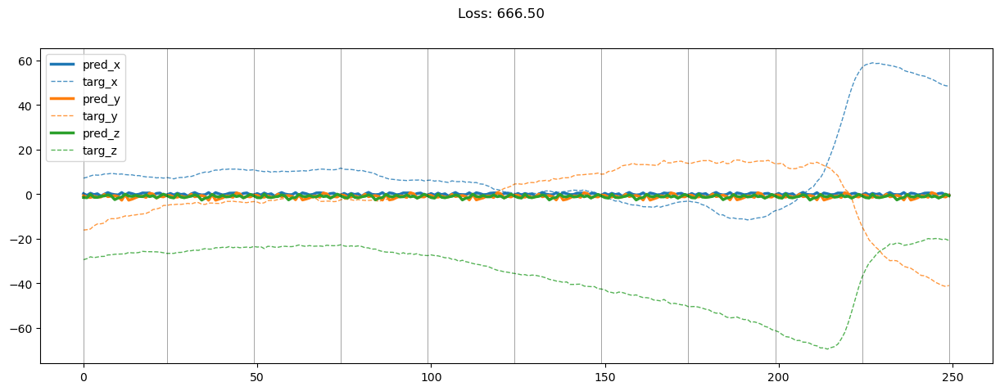

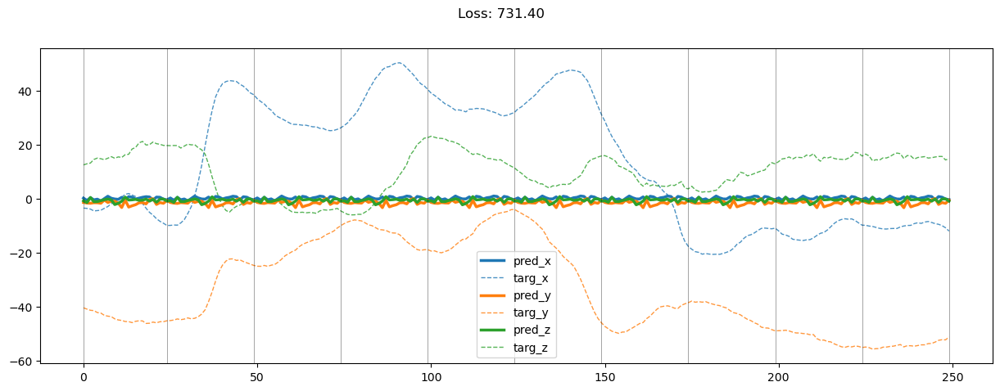

00000: train total loss:  648.508, pred loss:  648.508, valid total loss:  672.871, pred loss:  672.871


100%|██████████| 6/6 [00:00<00:00, 21.25it/s]


00001: train total loss:  630.462, pred loss:  630.462, valid total loss:  659.441, pred loss:  659.441


100%|██████████| 6/6 [00:00<00:00, 21.34it/s]


00002: train total loss:  614.469, pred loss:  614.469, valid total loss:  649.089, pred loss:  649.089


100%|██████████| 6/6 [00:00<00:00, 21.34it/s]


00003: train total loss:  602.981, pred loss:  602.981, valid total loss:  638.959, pred loss:  638.959


100%|██████████| 6/6 [00:00<00:00, 19.87it/s]


00004: train total loss:  595.863, pred loss:  595.863, valid total loss:  632.230, pred loss:  632.230


100%|██████████| 6/6 [00:00<00:00, 21.11it/s]


00005: train total loss:  578.856, pred loss:  578.856, valid total loss:  612.277, pred loss:  612.277


100%|██████████| 6/6 [00:00<00:00, 21.36it/s]


00006: train total loss:  563.446, pred loss:  563.446, valid total loss:  597.038, pred loss:  597.038


100%|██████████| 6/6 [00:00<00:00, 21.37it/s]


00007: train total loss:  551.379, pred loss:  551.379, valid total loss:  579.044, pred loss:  579.044


100%|██████████| 6/6 [00:00<00:00, 19.73it/s]


00008: train total loss:  532.523, pred loss:  532.523, valid total loss:  560.727, pred loss:  560.727


100%|██████████| 6/6 [00:00<00:00, 21.34it/s]


00009: train total loss:  516.650, pred loss:  516.650, valid total loss:  541.687, pred loss:  541.687


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00010: train total loss:  492.240, pred loss:  492.240, valid total loss:  538.197, pred loss:  538.197


100%|██████████| 6/6 [00:00<00:00, 20.92it/s]


00011: train total loss:  475.067, pred loss:  475.067, valid total loss:  496.444, pred loss:  496.444


100%|██████████| 6/6 [00:00<00:00, 21.34it/s]


00012: train total loss:  452.049, pred loss:  452.049, valid total loss:  476.635, pred loss:  476.635


100%|██████████| 6/6 [00:00<00:00, 21.32it/s]


00013: train total loss:  430.821, pred loss:  430.821, valid total loss:  455.747, pred loss:  455.747


100%|██████████| 6/6 [00:00<00:00, 21.32it/s]


00014: train total loss:  405.009, pred loss:  405.009, valid total loss:  433.730, pred loss:  433.730


100%|██████████| 6/6 [00:00<00:00, 21.32it/s]


00015: train total loss:  387.665, pred loss:  387.665, valid total loss:  425.181, pred loss:  425.181


100%|██████████| 6/6 [00:00<00:00, 21.21it/s]


00016: train total loss:  368.122, pred loss:  368.122, valid total loss:  400.802, pred loss:  400.802


100%|██████████| 6/6 [00:00<00:00, 21.28it/s]


00017: train total loss:  347.574, pred loss:  347.574, valid total loss:  375.794, pred loss:  375.794


100%|██████████| 6/6 [00:00<00:00, 21.30it/s]


00018: train total loss:  324.557, pred loss:  324.557, valid total loss:  360.406, pred loss:  360.406


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00019: train total loss:  305.800, pred loss:  305.800, valid total loss:  347.258, pred loss:  347.258


100%|██████████| 6/6 [00:00<00:00, 21.23it/s]


00020: train total loss:  288.082, pred loss:  288.082, valid total loss:  325.725, pred loss:  325.725


100%|██████████| 6/6 [00:00<00:00, 20.02it/s]


00021: train total loss:  270.761, pred loss:  270.761, valid total loss:  322.875, pred loss:  322.875


100%|██████████| 6/6 [00:00<00:00, 21.03it/s]


00022: train total loss:  255.966, pred loss:  255.966, valid total loss:  295.415, pred loss:  295.415


100%|██████████| 6/6 [00:00<00:00, 21.23it/s]


00023: train total loss:  239.747, pred loss:  239.747, valid total loss:  281.622, pred loss:  281.622


100%|██████████| 6/6 [00:00<00:00, 21.27it/s]


00024: train total loss:  228.160, pred loss:  228.160, valid total loss:  277.234, pred loss:  277.234


100%|██████████| 6/6 [00:00<00:00, 21.28it/s]


00025: train total loss:  216.346, pred loss:  216.346, valid total loss:  287.101, pred loss:  287.101


100%|██████████| 6/6 [00:00<00:00, 21.26it/s]


00026: train total loss:  208.383, pred loss:  208.383, valid total loss:  253.966, pred loss:  253.966


100%|██████████| 6/6 [00:00<00:00, 21.32it/s]


00027: train total loss:  191.564, pred loss:  191.564, valid total loss:  275.274, pred loss:  275.274


100%|██████████| 6/6 [00:00<00:00, 20.94it/s]


00028: train total loss:  178.910, pred loss:  178.910, valid total loss:  225.049, pred loss:  225.049


100%|██████████| 6/6 [00:00<00:00, 21.26it/s]


00029: train total loss:  166.066, pred loss:  166.066, valid total loss:  218.266, pred loss:  218.266


100%|██████████| 6/6 [00:00<00:00, 21.25it/s]


00030: train total loss:  154.552, pred loss:  154.552, valid total loss:  209.783, pred loss:  209.783


100%|██████████| 6/6 [00:00<00:00, 21.26it/s]


00031: train total loss:  144.709, pred loss:  144.709, valid total loss:  195.634, pred loss:  195.634


100%|██████████| 6/6 [00:00<00:00, 21.28it/s]


00032: train total loss:  136.690, pred loss:  136.690, valid total loss:  191.486, pred loss:  191.486


100%|██████████| 6/6 [00:00<00:00, 21.14it/s]


00033: train total loss:  125.890, pred loss:  125.890, valid total loss:  204.169, pred loss:  204.169


100%|██████████| 6/6 [00:00<00:00, 21.24it/s]


00034: train total loss:  118.204, pred loss:  118.204, valid total loss:  181.867, pred loss:  181.867


100%|██████████| 6/6 [00:00<00:00, 21.28it/s]


00035: train total loss:  110.113, pred loss:  110.113, valid total loss:  176.236, pred loss:  176.236


100%|██████████| 6/6 [00:00<00:00, 21.27it/s]


00036: train total loss:  104.711, pred loss:  104.711, valid total loss:  168.595, pred loss:  168.595


100%|██████████| 6/6 [00:00<00:00, 21.18it/s]


00037: train total loss:  98.599, pred loss:  98.599, valid total loss:  160.246, pred loss:  160.246


100%|██████████| 6/6 [00:00<00:00, 21.02it/s]


00038: train total loss:  95.856, pred loss:  95.856, valid total loss:  151.094, pred loss:  151.094


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00039: train total loss:  94.621, pred loss:  94.621, valid total loss:  166.374, pred loss:  166.374


100%|██████████| 6/6 [00:00<00:00, 21.17it/s]


00040: train total loss:  92.693, pred loss:  92.693, valid total loss:  165.713, pred loss:  165.713


100%|██████████| 6/6 [00:00<00:00, 21.17it/s]


00041: train total loss:  88.636, pred loss:  88.636, valid total loss:  158.614, pred loss:  158.614


100%|██████████| 6/6 [00:00<00:00, 21.16it/s]


00042: train total loss:  83.411, pred loss:  83.411, valid total loss:  149.318, pred loss:  149.318


100%|██████████| 6/6 [00:00<00:00, 21.15it/s]


00043: train total loss:  79.942, pred loss:  79.942, valid total loss:  151.453, pred loss:  151.453


100%|██████████| 6/6 [00:00<00:00, 21.18it/s]


00044: train total loss:  76.526, pred loss:  76.526, valid total loss:  151.876, pred loss:  151.876


100%|██████████| 6/6 [00:00<00:00, 21.01it/s]


00045: train total loss:  73.382, pred loss:  73.382, valid total loss:  151.805, pred loss:  151.805


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00046: train total loss:  71.233, pred loss:  71.233, valid total loss:  142.394, pred loss:  142.394


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00047: train total loss:  68.412, pred loss:  68.412, valid total loss:  135.873, pred loss:  135.873


100%|██████████| 6/6 [00:00<00:00, 17.82it/s]


00048: train total loss:  64.845, pred loss:  64.845, valid total loss:  135.139, pred loss:  135.139


100%|██████████| 6/6 [00:00<00:00, 21.06it/s]


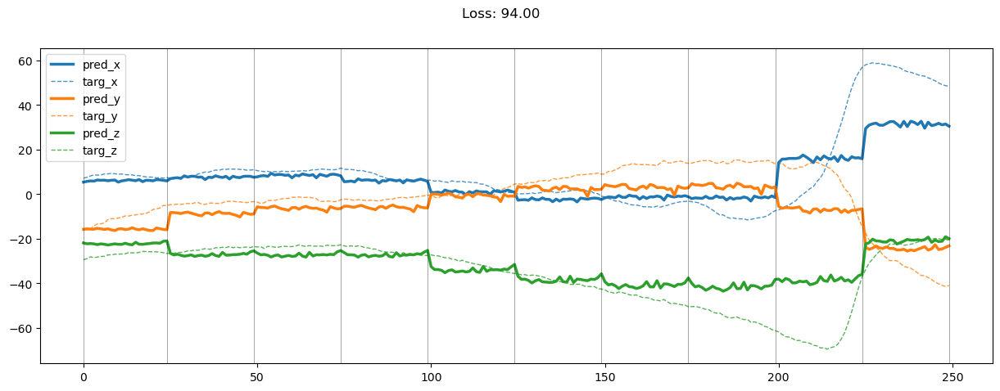

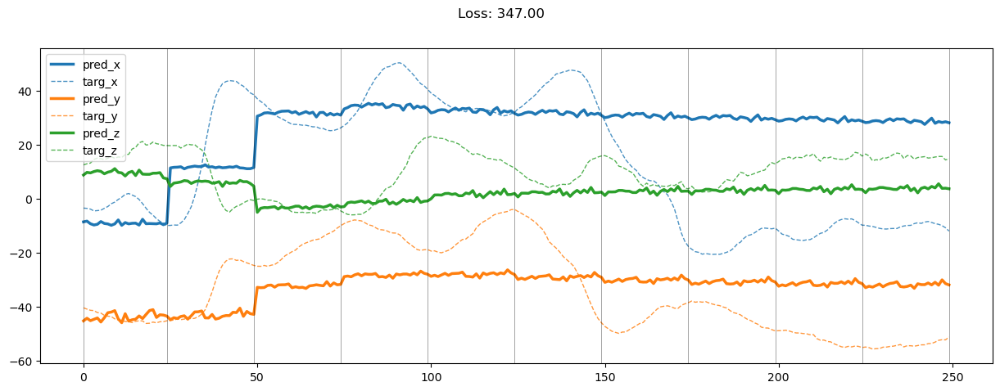

00049: train total loss:  62.439, pred loss:  62.439, valid total loss:  135.885, pred loss:  135.885


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00050: train total loss:  58.669, pred loss:  58.669, valid total loss:  131.924, pred loss:  131.924


100%|██████████| 6/6 [00:00<00:00, 19.75it/s]


00051: train total loss:  56.882, pred loss:  56.882, valid total loss:  120.332, pred loss:  120.332


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00052: train total loss:  55.691, pred loss:  55.691, valid total loss:  130.951, pred loss:  130.951


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00053: train total loss:  53.165, pred loss:  53.165, valid total loss:  125.842, pred loss:  125.842


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00054: train total loss:  52.822, pred loss:  52.822, valid total loss:  119.348, pred loss:  119.348


100%|██████████| 6/6 [00:00<00:00, 19.74it/s]


00055: train total loss:  51.070, pred loss:  51.070, valid total loss:  128.477, pred loss:  128.477


100%|██████████| 6/6 [00:00<00:00, 21.09it/s]


00056: train total loss:  48.718, pred loss:  48.718, valid total loss:  127.851, pred loss:  127.851


100%|██████████| 6/6 [00:00<00:00, 21.13it/s]


00057: train total loss:  48.229, pred loss:  48.229, valid total loss:  113.669, pred loss:  113.669


100%|██████████| 6/6 [00:00<00:00, 21.11it/s]


00058: train total loss:  47.469, pred loss:  47.469, valid total loss:  113.988, pred loss:  113.988


100%|██████████| 6/6 [00:00<00:00, 21.14it/s]


00059: train total loss:  44.942, pred loss:  44.942, valid total loss:  119.960, pred loss:  119.960


100%|██████████| 6/6 [00:00<00:00, 20.98it/s]


00060: train total loss:  43.022, pred loss:  43.022, valid total loss:  118.320, pred loss:  118.320


100%|██████████| 6/6 [00:00<00:00, 21.12it/s]


00061: train total loss:  42.127, pred loss:  42.127, valid total loss:  121.815, pred loss:  121.815


100%|██████████| 6/6 [00:00<00:00, 21.11it/s]


00062: train total loss:  42.546, pred loss:  42.546, valid total loss:  120.103, pred loss:  120.103


100%|██████████| 6/6 [00:00<00:00, 21.11it/s]


00063: train total loss:  41.720, pred loss:  41.720, valid total loss:  123.818, pred loss:  123.818


100%|██████████| 6/6 [00:00<00:00, 21.14it/s]


00064: train total loss:  41.799, pred loss:  41.799, valid total loss:  122.587, pred loss:  122.587


100%|██████████| 6/6 [00:00<00:00, 21.13it/s]


00065: train total loss:  41.858, pred loss:  41.858, valid total loss:  125.395, pred loss:  125.395


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00066: train total loss:  40.332, pred loss:  40.332, valid total loss:  120.790, pred loss:  120.790


100%|██████████| 6/6 [00:00<00:00, 21.07it/s]


00067: train total loss:  38.982, pred loss:  38.982, valid total loss:  136.292, pred loss:  136.292


100%|██████████| 6/6 [00:00<00:00, 20.95it/s]


00068: train total loss:  39.140, pred loss:  39.140, valid total loss:  115.953, pred loss:  115.953


100%|██████████| 6/6 [00:00<00:00, 21.02it/s]


00069: train total loss:  37.429, pred loss:  37.429, valid total loss:  119.347, pred loss:  119.347


100%|██████████| 6/6 [00:00<00:00, 21.05it/s]


00070: train total loss:  38.173, pred loss:  38.173, valid total loss:  135.151, pred loss:  135.151


100%|██████████| 6/6 [00:00<00:00, 21.02it/s]


00071: train total loss:  38.005, pred loss:  38.005, valid total loss:  124.471, pred loss:  124.471


100%|██████████| 6/6 [00:00<00:00, 21.07it/s]


00072: train total loss:  36.652, pred loss:  36.652, valid total loss:  128.983, pred loss:  128.983


100%|██████████| 6/6 [00:00<00:00, 21.10it/s]


00073: train total loss:  35.926, pred loss:  35.926, valid total loss:  134.856, pred loss:  134.856


100%|██████████| 6/6 [00:00<00:00, 21.00it/s]


00074: train total loss:  36.662, pred loss:  36.662, valid total loss:  101.629, pred loss:  101.629


100%|██████████| 6/6 [00:00<00:00, 21.00it/s]


00075: train total loss:  36.063, pred loss:  36.063, valid total loss:  97.237, pred loss:  97.237


100%|██████████| 6/6 [00:00<00:00, 21.08it/s]


00076: train total loss:  36.145, pred loss:  36.145, valid total loss:  113.850, pred loss:  113.850


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00077: train total loss:  35.339, pred loss:  35.339, valid total loss:  110.072, pred loss:  110.072


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00078: train total loss:  34.249, pred loss:  34.249, valid total loss:  107.352, pred loss:  107.352


100%|██████████| 6/6 [00:00<00:00, 21.01it/s]


00079: train total loss:  33.666, pred loss:  33.666, valid total loss:  118.394, pred loss:  118.394


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00080: train total loss:  33.439, pred loss:  33.439, valid total loss:  115.061, pred loss:  115.061


100%|██████████| 6/6 [00:00<00:00, 21.06it/s]


00081: train total loss:  33.105, pred loss:  33.105, valid total loss:  131.250, pred loss:  131.250


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00082: train total loss:  33.228, pred loss:  33.228, valid total loss:  111.172, pred loss:  111.172


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00083: train total loss:  31.405, pred loss:  31.405, valid total loss:  115.769, pred loss:  115.769


100%|██████████| 6/6 [00:00<00:00, 21.04it/s]


00084: train total loss:  32.356, pred loss:  32.356, valid total loss:  110.198, pred loss:  110.198


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00085: train total loss:  31.373, pred loss:  31.373, valid total loss:  107.565, pred loss:  107.565


100%|██████████| 6/6 [00:00<00:00, 18.77it/s]


00086: train total loss:  31.598, pred loss:  31.598, valid total loss:  114.236, pred loss:  114.236


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00087: train total loss:  30.324, pred loss:  30.324, valid total loss:  116.686, pred loss:  116.686


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00088: train total loss:  29.583, pred loss:  29.583, valid total loss:  119.410, pred loss:  119.410


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00089: train total loss:  29.287, pred loss:  29.287, valid total loss:  107.549, pred loss:  107.549


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00090: train total loss:  29.146, pred loss:  29.146, valid total loss:  106.204, pred loss:  106.204


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00091: train total loss:  29.386, pred loss:  29.386, valid total loss:  108.023, pred loss:  108.023


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00092: train total loss:  28.800, pred loss:  28.800, valid total loss:  111.659, pred loss:  111.659


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00093: train total loss:  28.842, pred loss:  28.842, valid total loss:  120.796, pred loss:  120.796


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00094: train total loss:  29.393, pred loss:  29.393, valid total loss:  103.055, pred loss:  103.055


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00095: train total loss:  29.003, pred loss:  29.003, valid total loss:  102.922, pred loss:  102.922


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00096: train total loss:  29.484, pred loss:  29.484, valid total loss:  119.270, pred loss:  119.270


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00097: train total loss:  29.525, pred loss:  29.525, valid total loss:  102.424, pred loss:  102.424


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


00098: train total loss:  28.633, pred loss:  28.633, valid total loss:  123.128, pred loss:  123.128


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


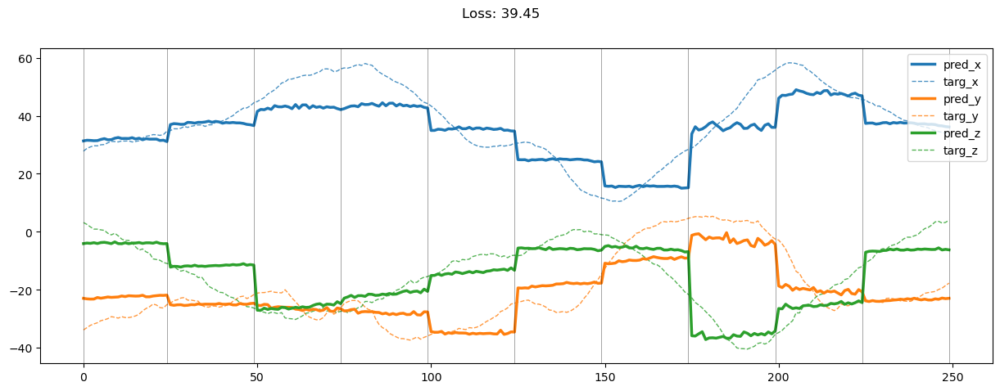

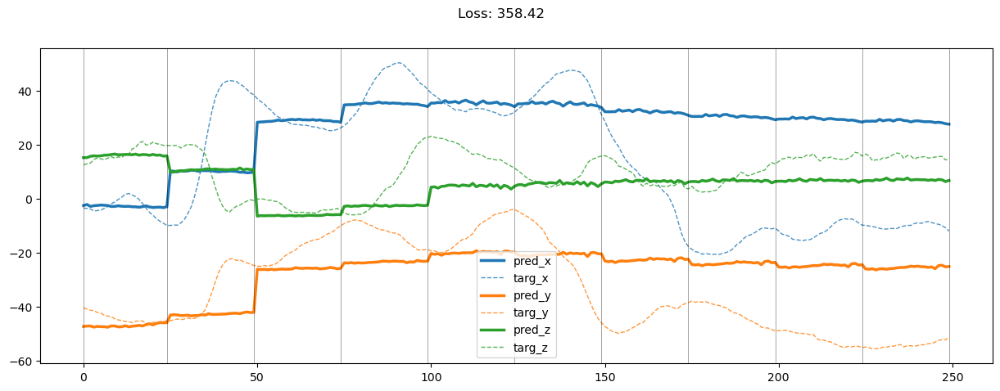

00099: train total loss:  28.614, pred loss:  28.614, valid total loss:  138.163, pred loss:  138.163


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00100: train total loss:  28.263, pred loss:  28.263, valid total loss:  121.451, pred loss:  121.451


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00101: train total loss:  27.741, pred loss:  27.741, valid total loss:  117.251, pred loss:  117.251


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


00102: train total loss:  27.866, pred loss:  27.866, valid total loss:  128.543, pred loss:  128.543


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00103: train total loss:  28.135, pred loss:  28.135, valid total loss:  128.533, pred loss:  128.533


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00104: train total loss:  26.980, pred loss:  26.980, valid total loss:  112.516, pred loss:  112.516


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00105: train total loss:  27.526, pred loss:  27.526, valid total loss:  122.337, pred loss:  122.337


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00106: train total loss:  27.298, pred loss:  27.298, valid total loss:  128.491, pred loss:  128.491


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00107: train total loss:  25.780, pred loss:  25.780, valid total loss:  115.246, pred loss:  115.246


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00108: train total loss:  25.592, pred loss:  25.592, valid total loss:  109.558, pred loss:  109.558


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00109: train total loss:  25.873, pred loss:  25.873, valid total loss:  117.222, pred loss:  117.222


100%|██████████| 6/6 [00:00<00:00, 18.43it/s]


00110: train total loss:  25.506, pred loss:  25.506, valid total loss:  130.233, pred loss:  130.233


100%|██████████| 6/6 [00:00<00:00, 20.95it/s]


00111: train total loss:  25.620, pred loss:  25.620, valid total loss:  118.256, pred loss:  118.256


100%|██████████| 6/6 [00:00<00:00, 20.99it/s]


00112: train total loss:  26.187, pred loss:  26.187, valid total loss:  102.032, pred loss:  102.032


100%|██████████| 6/6 [00:00<00:00, 20.97it/s]


00113: train total loss:  26.262, pred loss:  26.262, valid total loss:  113.228, pred loss:  113.228


100%|██████████| 6/6 [00:00<00:00, 20.97it/s]


00114: train total loss:  25.789, pred loss:  25.789, valid total loss:  105.956, pred loss:  105.956


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00115: train total loss:  25.983, pred loss:  25.983, valid total loss:  111.697, pred loss:  111.697


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00116: train total loss:  25.916, pred loss:  25.916, valid total loss:  120.742, pred loss:  120.742


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00117: train total loss:  26.108, pred loss:  26.108, valid total loss:  111.853, pred loss:  111.853


100%|██████████| 6/6 [00:00<00:00, 20.15it/s]


00118: train total loss:  26.252, pred loss:  26.252, valid total loss:  118.757, pred loss:  118.757


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00119: train total loss:  24.810, pred loss:  24.810, valid total loss:  103.191, pred loss:  103.191


100%|██████████| 6/6 [00:00<00:00, 18.66it/s]


00120: train total loss:  25.016, pred loss:  25.016, valid total loss:  104.472, pred loss:  104.472


100%|██████████| 6/6 [00:00<00:00, 19.66it/s]


00121: train total loss:  25.007, pred loss:  25.007, valid total loss:  106.824, pred loss:  106.824


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00122: train total loss:  24.559, pred loss:  24.559, valid total loss:  108.706, pred loss:  108.706


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00123: train total loss:  24.804, pred loss:  24.804, valid total loss:  100.719, pred loss:  100.719


100%|██████████| 6/6 [00:00<00:00, 19.81it/s]


00124: train total loss:  24.867, pred loss:  24.867, valid total loss:  111.472, pred loss:  111.472


100%|██████████| 6/6 [00:00<00:00, 18.41it/s]


00125: train total loss:  24.537, pred loss:  24.537, valid total loss:  110.646, pred loss:  110.646


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00126: train total loss:  24.324, pred loss:  24.324, valid total loss:  111.078, pred loss:  111.078


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00127: train total loss:  24.805, pred loss:  24.805, valid total loss:  115.984, pred loss:  115.984


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00128: train total loss:  24.667, pred loss:  24.667, valid total loss:  105.345, pred loss:  105.345


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00129: train total loss:  23.666, pred loss:  23.666, valid total loss:  107.406, pred loss:  107.406


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00130: train total loss:  23.389, pred loss:  23.389, valid total loss:  117.787, pred loss:  117.787


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


00131: train total loss:  23.264, pred loss:  23.264, valid total loss:  100.732, pred loss:  100.732


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00132: train total loss:  23.408, pred loss:  23.408, valid total loss:  108.145, pred loss:  108.145


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00133: train total loss:  22.702, pred loss:  22.702, valid total loss:  127.673, pred loss:  127.673


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00134: train total loss:  23.019, pred loss:  23.019, valid total loss:  113.238, pred loss:  113.238


100%|██████████| 6/6 [00:00<00:00, 18.17it/s]


00135: train total loss:  22.758, pred loss:  22.758, valid total loss:  120.839, pred loss:  120.839


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00136: train total loss:  23.431, pred loss:  23.431, valid total loss:  122.350, pred loss:  122.350


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00137: train total loss:  22.412, pred loss:  22.412, valid total loss:  112.465, pred loss:  112.465


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00138: train total loss:  22.679, pred loss:  22.679, valid total loss:  113.987, pred loss:  113.987


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00139: train total loss:  22.500, pred loss:  22.500, valid total loss:  111.696, pred loss:  111.696


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00140: train total loss:  23.119, pred loss:  23.119, valid total loss:  114.129, pred loss:  114.129


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00141: train total loss:  22.521, pred loss:  22.521, valid total loss:  105.327, pred loss:  105.327


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00142: train total loss:  22.291, pred loss:  22.291, valid total loss:  126.917, pred loss:  126.917


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00143: train total loss:  22.614, pred loss:  22.614, valid total loss:  121.407, pred loss:  121.407


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00144: train total loss:  22.736, pred loss:  22.736, valid total loss:  115.247, pred loss:  115.247


100%|██████████| 6/6 [00:00<00:00, 19.87it/s]


00145: train total loss:  22.428, pred loss:  22.428, valid total loss:  107.518, pred loss:  107.518


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00146: train total loss:  22.157, pred loss:  22.157, valid total loss:  113.038, pred loss:  113.038


100%|██████████| 6/6 [00:00<00:00, 20.18it/s]


00147: train total loss:  21.891, pred loss:  21.891, valid total loss:  119.174, pred loss:  119.174


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00148: train total loss:  22.051, pred loss:  22.051, valid total loss:  114.791, pred loss:  114.791


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


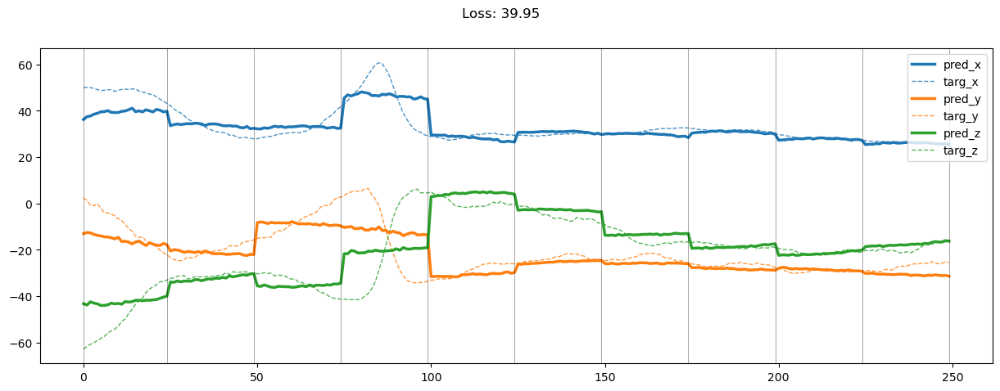

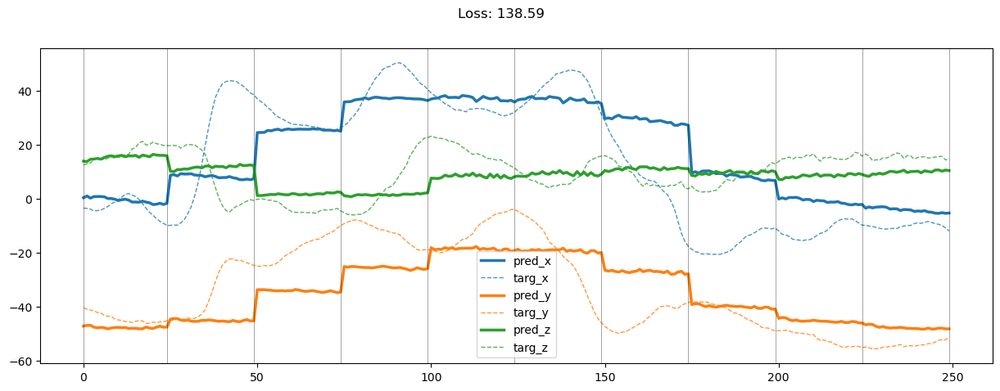

00149: train total loss:  22.022, pred loss:  22.022, valid total loss:  110.283, pred loss:  110.283


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00150: train total loss:  20.982, pred loss:  20.982, valid total loss:  118.411, pred loss:  118.411


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


00151: train total loss:  21.049, pred loss:  21.049, valid total loss:  110.068, pred loss:  110.068


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00152: train total loss:  21.391, pred loss:  21.391, valid total loss:  109.984, pred loss:  109.984


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


00153: train total loss:  21.321, pred loss:  21.321, valid total loss:  117.741, pred loss:  117.741


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


00154: train total loss:  21.510, pred loss:  21.510, valid total loss:  114.014, pred loss:  114.014


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00155: train total loss:  20.976, pred loss:  20.976, valid total loss:  113.488, pred loss:  113.488


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00156: train total loss:  21.579, pred loss:  21.579, valid total loss:  104.976, pred loss:  104.976


100%|██████████| 6/6 [00:00<00:00, 19.92it/s]


00157: train total loss:  21.212, pred loss:  21.212, valid total loss:  111.878, pred loss:  111.878


100%|██████████| 6/6 [00:00<00:00, 20.07it/s]


00158: train total loss:  20.975, pred loss:  20.975, valid total loss:  125.545, pred loss:  125.545


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00159: train total loss:  20.939, pred loss:  20.939, valid total loss:  110.194, pred loss:  110.194


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00160: train total loss:  20.435, pred loss:  20.435, valid total loss:  119.263, pred loss:  119.263


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


00161: train total loss:  20.648, pred loss:  20.648, valid total loss:  113.963, pred loss:  113.963


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


00162: train total loss:  19.911, pred loss:  19.911, valid total loss:  124.800, pred loss:  124.800


100%|██████████| 6/6 [00:00<00:00, 19.55it/s]


00163: train total loss:  19.867, pred loss:  19.867, valid total loss:  113.518, pred loss:  113.518


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


00164: train total loss:  20.001, pred loss:  20.001, valid total loss:  117.931, pred loss:  117.931


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


00165: train total loss:  19.463, pred loss:  19.463, valid total loss:  118.892, pred loss:  118.892


100%|██████████| 6/6 [00:00<00:00, 19.97it/s]


00166: train total loss:  19.349, pred loss:  19.349, valid total loss:  114.168, pred loss:  114.168


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


00167: train total loss:  18.992, pred loss:  18.992, valid total loss:  119.727, pred loss:  119.727


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00168: train total loss:  18.864, pred loss:  18.864, valid total loss:  119.270, pred loss:  119.270


100%|██████████| 6/6 [00:00<00:00, 20.30it/s]


00169: train total loss:  19.611, pred loss:  19.611, valid total loss:  115.620, pred loss:  115.620


100%|██████████| 6/6 [00:00<00:00, 19.89it/s]


00170: train total loss:  19.214, pred loss:  19.214, valid total loss:  98.376, pred loss:  98.376


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


00171: train total loss:  19.197, pred loss:  19.197, valid total loss:  103.925, pred loss:  103.925


100%|██████████| 6/6 [00:00<00:00, 19.88it/s]


00172: train total loss:  18.743, pred loss:  18.743, valid total loss:  105.509, pred loss:  105.509


100%|██████████| 6/6 [00:00<00:00, 19.61it/s]


00173: train total loss:  18.460, pred loss:  18.460, valid total loss:  106.831, pred loss:  106.831


100%|██████████| 6/6 [00:00<00:00, 19.84it/s]


00174: train total loss:  18.747, pred loss:  18.747, valid total loss:  102.812, pred loss:  102.812


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


00175: train total loss:  18.423, pred loss:  18.423, valid total loss:  106.582, pred loss:  106.582


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00176: train total loss:  18.286, pred loss:  18.286, valid total loss:  95.537, pred loss:  95.537


100%|██████████| 6/6 [00:00<00:00, 19.09it/s]


00177: train total loss:  18.045, pred loss:  18.045, valid total loss:  106.460, pred loss:  106.460


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


00178: train total loss:  17.883, pred loss:  17.883, valid total loss:  101.776, pred loss:  101.776


100%|██████████| 6/6 [00:00<00:00, 19.86it/s]


00179: train total loss:  18.101, pred loss:  18.101, valid total loss:  114.214, pred loss:  114.214


100%|██████████| 6/6 [00:00<00:00, 19.54it/s]


00180: train total loss:  18.343, pred loss:  18.343, valid total loss:  111.084, pred loss:  111.084


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


00181: train total loss:  18.200, pred loss:  18.200, valid total loss:  104.726, pred loss:  104.726


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00182: train total loss:  18.538, pred loss:  18.538, valid total loss:  103.024, pred loss:  103.024


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00183: train total loss:  18.433, pred loss:  18.433, valid total loss:  116.675, pred loss:  116.675


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00184: train total loss:  18.483, pred loss:  18.483, valid total loss:  94.158, pred loss:  94.158


100%|██████████| 6/6 [00:00<00:00, 19.34it/s]


00185: train total loss:  17.966, pred loss:  17.966, valid total loss:  109.292, pred loss:  109.292


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


00186: train total loss:  17.602, pred loss:  17.602, valid total loss:  96.427, pred loss:  96.427


100%|██████████| 6/6 [00:00<00:00, 19.30it/s]


00187: train total loss:  17.319, pred loss:  17.319, valid total loss:  92.385, pred loss:  92.385


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


00188: train total loss:  16.677, pred loss:  16.677, valid total loss:  109.005, pred loss:  109.005


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00189: train total loss:  16.713, pred loss:  16.713, valid total loss:  122.024, pred loss:  122.024


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00190: train total loss:  17.046, pred loss:  17.046, valid total loss:  118.348, pred loss:  118.348


100%|██████████| 6/6 [00:00<00:00, 20.10it/s]


00191: train total loss:  16.187, pred loss:  16.187, valid total loss:  113.944, pred loss:  113.944


100%|██████████| 6/6 [00:00<00:00, 20.18it/s]


00192: train total loss:  16.068, pred loss:  16.068, valid total loss:  102.007, pred loss:  102.007


100%|██████████| 6/6 [00:00<00:00, 18.59it/s]


00193: train total loss:  16.076, pred loss:  16.076, valid total loss:  109.773, pred loss:  109.773


100%|██████████| 6/6 [00:00<00:00, 17.92it/s]


00194: train total loss:  15.756, pred loss:  15.756, valid total loss:  126.543, pred loss:  126.543


100%|██████████| 6/6 [00:00<00:00, 18.35it/s]


00195: train total loss:  15.392, pred loss:  15.392, valid total loss:  110.964, pred loss:  110.964


100%|██████████| 6/6 [00:00<00:00, 19.00it/s]


00196: train total loss:  15.496, pred loss:  15.496, valid total loss:  111.417, pred loss:  111.417


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


00197: train total loss:  15.518, pred loss:  15.518, valid total loss:  107.742, pred loss:  107.742


100%|██████████| 6/6 [00:00<00:00, 19.09it/s]


00198: train total loss:  15.115, pred loss:  15.115, valid total loss:  105.850, pred loss:  105.850


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


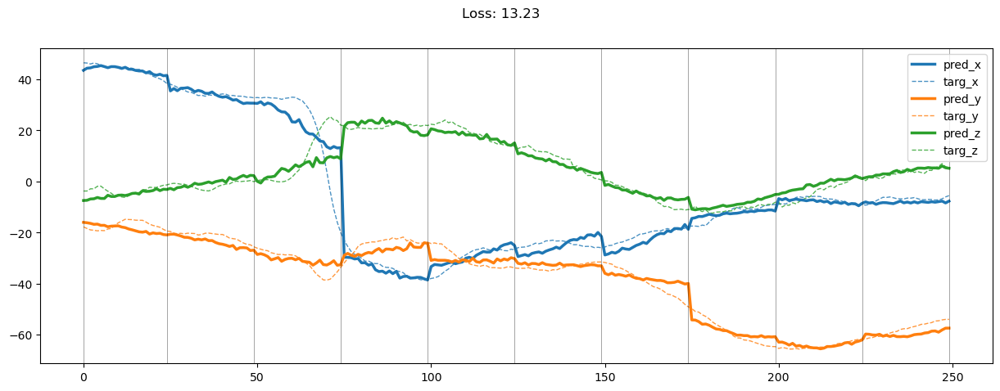

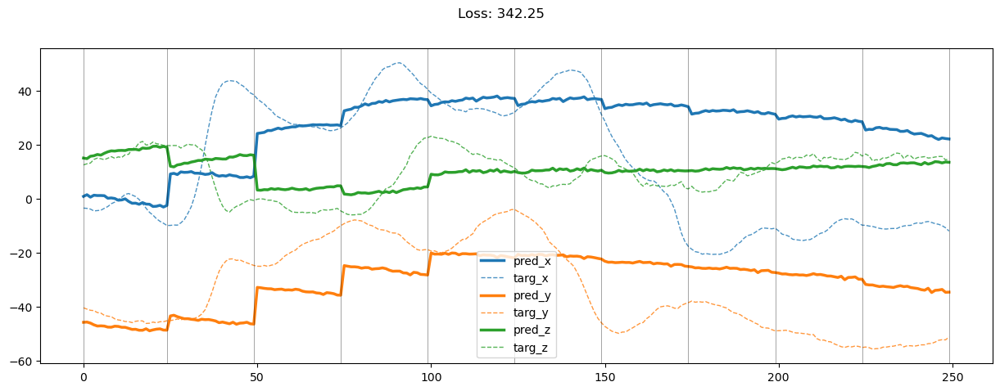

00199: train total loss:  15.232, pred loss:  15.232, valid total loss:  100.584, pred loss:  100.584


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


00200: train total loss:  15.276, pred loss:  15.276, valid total loss:  116.389, pred loss:  116.389


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


00201: train total loss:  15.003, pred loss:  15.003, valid total loss:  117.075, pred loss:  117.075


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00202: train total loss:  14.783, pred loss:  14.783, valid total loss:  132.619, pred loss:  132.619


100%|██████████| 6/6 [00:00<00:00, 19.49it/s]


00203: train total loss:  14.616, pred loss:  14.616, valid total loss:  119.198, pred loss:  119.198


100%|██████████| 6/6 [00:00<00:00, 19.77it/s]


00204: train total loss:  14.781, pred loss:  14.781, valid total loss:  108.707, pred loss:  108.707


100%|██████████| 6/6 [00:00<00:00, 18.44it/s]


00205: train total loss:  14.263, pred loss:  14.263, valid total loss:  93.711, pred loss:  93.711


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00206: train total loss:  14.328, pred loss:  14.328, valid total loss:  112.507, pred loss:  112.507


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


00207: train total loss:  13.950, pred loss:  13.950, valid total loss:  118.930, pred loss:  118.930


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


00208: train total loss:  14.267, pred loss:  14.267, valid total loss:  111.277, pred loss:  111.277


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


00209: train total loss:  14.029, pred loss:  14.029, valid total loss:  117.219, pred loss:  117.219


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


00210: train total loss:  13.826, pred loss:  13.826, valid total loss:  116.277, pred loss:  116.277


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00211: train total loss:  13.238, pred loss:  13.238, valid total loss:  111.598, pred loss:  111.598


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00212: train total loss:  13.293, pred loss:  13.293, valid total loss:  114.282, pred loss:  114.282


100%|██████████| 6/6 [00:00<00:00, 19.61it/s]


00213: train total loss:  13.253, pred loss:  13.253, valid total loss:  108.336, pred loss:  108.336


100%|██████████| 6/6 [00:00<00:00, 18.27it/s]


00214: train total loss:  13.168, pred loss:  13.168, valid total loss:  99.113, pred loss:  99.113


100%|██████████| 6/6 [00:00<00:00, 17.83it/s]


00215: train total loss:  12.880, pred loss:  12.880, valid total loss:  110.050, pred loss:  110.050


100%|██████████| 6/6 [00:00<00:00, 19.63it/s]


00216: train total loss:  12.956, pred loss:  12.956, valid total loss:  99.219, pred loss:  99.219


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00217: train total loss:  12.963, pred loss:  12.963, valid total loss:  107.811, pred loss:  107.811


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00218: train total loss:  12.856, pred loss:  12.856, valid total loss:  103.540, pred loss:  103.540


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00219: train total loss:  12.604, pred loss:  12.604, valid total loss:  102.905, pred loss:  102.905


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00220: train total loss:  12.649, pred loss:  12.649, valid total loss:  115.901, pred loss:  115.901


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00221: train total loss:  12.585, pred loss:  12.585, valid total loss:  107.445, pred loss:  107.445


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00222: train total loss:  12.716, pred loss:  12.716, valid total loss:  105.281, pred loss:  105.281


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00223: train total loss:  12.416, pred loss:  12.416, valid total loss:  106.135, pred loss:  106.135


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00224: train total loss:  12.230, pred loss:  12.230, valid total loss:  110.590, pred loss:  110.590


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00225: train total loss:  12.140, pred loss:  12.140, valid total loss:  96.055, pred loss:  96.055


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00226: train total loss:  12.456, pred loss:  12.456, valid total loss:  112.349, pred loss:  112.349


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00227: train total loss:  12.289, pred loss:  12.289, valid total loss:  111.464, pred loss:  111.464


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00228: train total loss:  12.240, pred loss:  12.240, valid total loss:  102.131, pred loss:  102.131


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00229: train total loss:  12.204, pred loss:  12.204, valid total loss:  104.782, pred loss:  104.782


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00230: train total loss:  11.681, pred loss:  11.681, valid total loss:  96.248, pred loss:  96.248


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00231: train total loss:  11.899, pred loss:  11.899, valid total loss:  92.482, pred loss:  92.482


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00232: train total loss:  11.367, pred loss:  11.367, valid total loss:  93.056, pred loss:  93.056


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00233: train total loss:  11.387, pred loss:  11.387, valid total loss:  99.035, pred loss:  99.035


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00234: train total loss:  11.248, pred loss:  11.248, valid total loss:  102.202, pred loss:  102.202


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00235: train total loss:  11.092, pred loss:  11.092, valid total loss:  102.836, pred loss:  102.836


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00236: train total loss:  11.015, pred loss:  11.015, valid total loss:  101.015, pred loss:  101.015


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00237: train total loss:  10.675, pred loss:  10.675, valid total loss:  104.932, pred loss:  104.932


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00238: train total loss:  10.644, pred loss:  10.644, valid total loss:  109.707, pred loss:  109.707


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00239: train total loss:  10.840, pred loss:  10.840, valid total loss:  122.468, pred loss:  122.468


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00240: train total loss:  10.505, pred loss:  10.505, valid total loss:  114.641, pred loss:  114.641


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00241: train total loss:  10.497, pred loss:  10.497, valid total loss:  109.196, pred loss:  109.196


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00242: train total loss:  11.023, pred loss:  11.023, valid total loss:  111.921, pred loss:  111.921


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00243: train total loss:  10.547, pred loss:  10.547, valid total loss:  119.323, pred loss:  119.323


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00244: train total loss:  10.832, pred loss:  10.832, valid total loss:  121.066, pred loss:  121.066


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00245: train total loss:  10.348, pred loss:  10.348, valid total loss:  108.646, pred loss:  108.646


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00246: train total loss:  10.654, pred loss:  10.654, valid total loss:  114.149, pred loss:  114.149


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00247: train total loss:  10.489, pred loss:  10.489, valid total loss:  114.047, pred loss:  114.047


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00248: train total loss:  10.637, pred loss:  10.637, valid total loss:  115.746, pred loss:  115.746


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


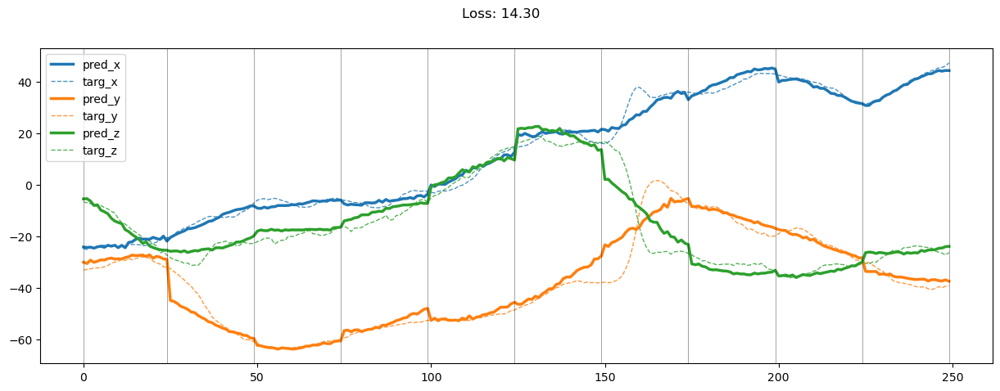

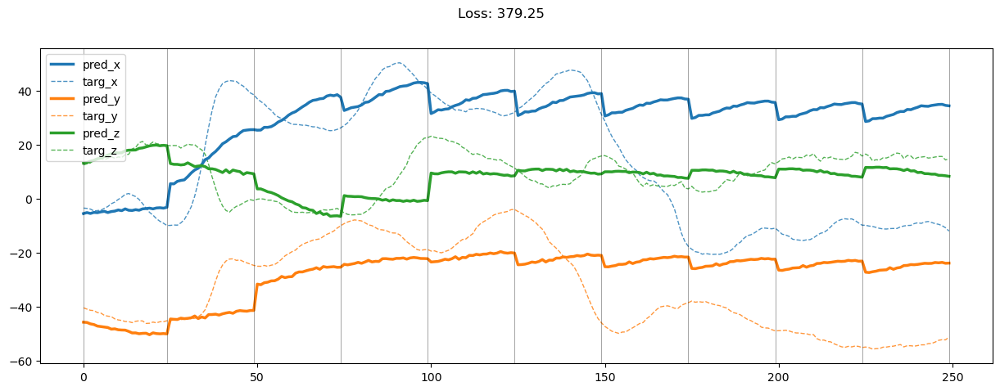

00249: train total loss:  10.329, pred loss:  10.329, valid total loss:  117.030, pred loss:  117.030


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00250: train total loss:  10.356, pred loss:  10.356, valid total loss:  104.735, pred loss:  104.735


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00251: train total loss:  10.518, pred loss:  10.518, valid total loss:  107.205, pred loss:  107.205


100%|██████████| 6/6 [00:00<00:00, 19.95it/s]


00252: train total loss:  10.147, pred loss:  10.147, valid total loss:  107.505, pred loss:  107.505


100%|██████████| 6/6 [00:00<00:00, 19.89it/s]


00253: train total loss:  10.376, pred loss:  10.376, valid total loss:  121.288, pred loss:  121.288


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00254: train total loss:  10.006, pred loss:  10.006, valid total loss:  123.015, pred loss:  123.015


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00255: train total loss:  9.985, pred loss:  9.985, valid total loss:  113.232, pred loss:  113.232


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00256: train total loss:  9.906, pred loss:  9.906, valid total loss:  101.796, pred loss:  101.796


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00257: train total loss:  9.595, pred loss:  9.595, valid total loss:  111.361, pred loss:  111.361


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00258: train total loss:  9.679, pred loss:  9.679, valid total loss:  111.459, pred loss:  111.459


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00259: train total loss:  9.511, pred loss:  9.511, valid total loss:  110.889, pred loss:  110.889


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00260: train total loss:  9.467, pred loss:  9.467, valid total loss:  114.071, pred loss:  114.071


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00261: train total loss:  9.471, pred loss:  9.471, valid total loss:  105.984, pred loss:  105.984


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00262: train total loss:  9.380, pred loss:  9.380, valid total loss:  106.909, pred loss:  106.909


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00263: train total loss:  9.265, pred loss:  9.265, valid total loss:  110.921, pred loss:  110.921


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00264: train total loss:  8.914, pred loss:  8.914, valid total loss:  106.104, pred loss:  106.104


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00265: train total loss:  9.111, pred loss:  9.111, valid total loss:  110.612, pred loss:  110.612


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00266: train total loss:  9.627, pred loss:  9.627, valid total loss:  110.990, pred loss:  110.990


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00267: train total loss:  9.014, pred loss:  9.014, valid total loss:  100.374, pred loss:  100.374


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00268: train total loss:  9.324, pred loss:  9.324, valid total loss:  106.231, pred loss:  106.231


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00269: train total loss:  8.931, pred loss:  8.931, valid total loss:  113.518, pred loss:  113.518


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00270: train total loss:  8.992, pred loss:  8.992, valid total loss:  111.069, pred loss:  111.069


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00271: train total loss:  8.918, pred loss:  8.918, valid total loss:  112.904, pred loss:  112.904


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00272: train total loss:  10.323, pred loss:  10.323, valid total loss:  94.572, pred loss:  94.572


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


00273: train total loss:  11.078, pred loss:  11.078, valid total loss:  94.660, pred loss:  94.660


100%|██████████| 6/6 [00:00<00:00, 18.27it/s]


00274: train total loss:  10.868, pred loss:  10.868, valid total loss:  102.477, pred loss:  102.477


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00275: train total loss:  11.983, pred loss:  11.983, valid total loss:  89.873, pred loss:  89.873


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00276: train total loss:  11.587, pred loss:  11.587, valid total loss:  107.256, pred loss:  107.256


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00277: train total loss:  10.319, pred loss:  10.319, valid total loss:  77.345, pred loss:  77.345


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00278: train total loss:  10.597, pred loss:  10.597, valid total loss:  91.556, pred loss:  91.556


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00279: train total loss:  10.232, pred loss:  10.232, valid total loss:  96.292, pred loss:  96.292


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00280: train total loss:  9.997, pred loss:  9.997, valid total loss:  90.092, pred loss:  90.092


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00281: train total loss:  9.396, pred loss:  9.396, valid total loss:  84.984, pred loss:  84.984


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00282: train total loss:  9.119, pred loss:  9.119, valid total loss:  86.083, pred loss:  86.083


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00283: train total loss:  9.184, pred loss:  9.184, valid total loss:  93.048, pred loss:  93.048


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00284: train total loss:  9.921, pred loss:  9.921, valid total loss:  97.823, pred loss:  97.823


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00285: train total loss:  9.534, pred loss:  9.534, valid total loss:  106.959, pred loss:  106.959


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00286: train total loss:  9.470, pred loss:  9.470, valid total loss:  97.429, pred loss:  97.429


100%|██████████| 6/6 [00:00<00:00, 19.12it/s]


00287: train total loss:  9.069, pred loss:  9.069, valid total loss:  95.074, pred loss:  95.074


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00288: train total loss:  8.845, pred loss:  8.845, valid total loss:  95.527, pred loss:  95.527


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00289: train total loss:  9.073, pred loss:  9.073, valid total loss:  87.407, pred loss:  87.407


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00290: train total loss:  8.896, pred loss:  8.896, valid total loss:  90.837, pred loss:  90.837


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00291: train total loss:  8.570, pred loss:  8.570, valid total loss:  95.908, pred loss:  95.908


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00292: train total loss:  8.951, pred loss:  8.951, valid total loss:  90.797, pred loss:  90.797


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00293: train total loss:  8.479, pred loss:  8.479, valid total loss:  88.883, pred loss:  88.883


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00294: train total loss:  8.503, pred loss:  8.503, valid total loss:  87.312, pred loss:  87.312


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00295: train total loss:  8.262, pred loss:  8.262, valid total loss:  94.226, pred loss:  94.226


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00296: train total loss:  8.514, pred loss:  8.514, valid total loss:  98.665, pred loss:  98.665


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00297: train total loss:  8.285, pred loss:  8.285, valid total loss:  79.752, pred loss:  79.752


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00298: train total loss:  8.190, pred loss:  8.190, valid total loss:  77.881, pred loss:  77.881


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


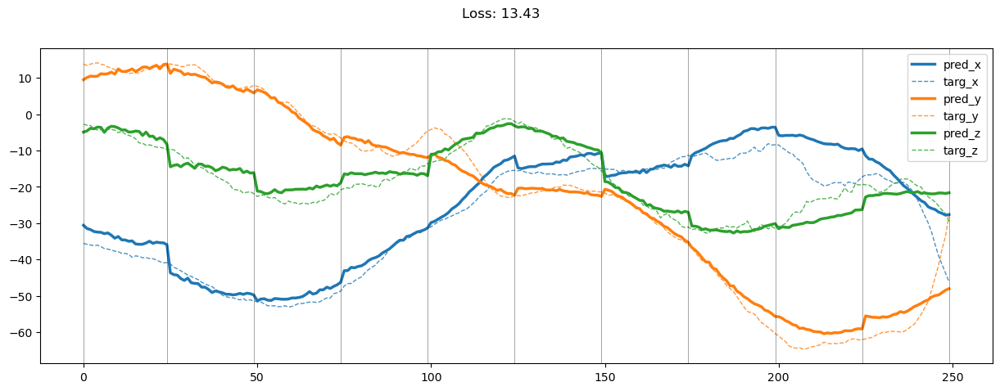

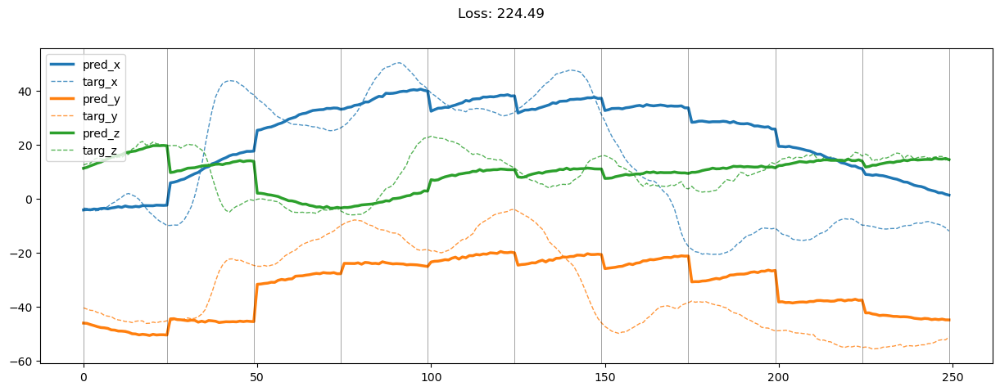

00299: train total loss:  7.881, pred loss:  7.881, valid total loss:  83.151, pred loss:  83.151


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00300: train total loss:  7.942, pred loss:  7.942, valid total loss:  83.475, pred loss:  83.475


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00301: train total loss:  7.817, pred loss:  7.817, valid total loss:  80.920, pred loss:  80.920


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00302: train total loss:  7.766, pred loss:  7.766, valid total loss:  83.243, pred loss:  83.243


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


00303: train total loss:  8.110, pred loss:  8.110, valid total loss:  88.447, pred loss:  88.447


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00304: train total loss:  7.970, pred loss:  7.970, valid total loss:  92.797, pred loss:  92.797


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00305: train total loss:  7.903, pred loss:  7.903, valid total loss:  95.172, pred loss:  95.172


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00306: train total loss:  8.004, pred loss:  8.004, valid total loss:  97.193, pred loss:  97.193


100%|██████████| 6/6 [00:00<00:00, 19.35it/s]


00307: train total loss:  7.943, pred loss:  7.943, valid total loss:  88.157, pred loss:  88.157


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


00308: train total loss:  7.905, pred loss:  7.905, valid total loss:  86.956, pred loss:  86.956


100%|██████████| 6/6 [00:00<00:00, 20.97it/s]


00309: train total loss:  7.737, pred loss:  7.737, valid total loss:  96.507, pred loss:  96.507


100%|██████████| 6/6 [00:00<00:00, 20.95it/s]


00310: train total loss:  7.752, pred loss:  7.752, valid total loss:  100.088, pred loss:  100.088


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


00311: train total loss:  7.741, pred loss:  7.741, valid total loss:  95.596, pred loss:  95.596


100%|██████████| 6/6 [00:00<00:00, 20.94it/s]


00312: train total loss:  7.583, pred loss:  7.583, valid total loss:  90.027, pred loss:  90.027


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00313: train total loss:  7.444, pred loss:  7.444, valid total loss:  91.247, pred loss:  91.247


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00314: train total loss:  7.283, pred loss:  7.283, valid total loss:  94.060, pred loss:  94.060


100%|██████████| 6/6 [00:00<00:00, 20.92it/s]


00315: train total loss:  7.403, pred loss:  7.403, valid total loss:  88.732, pred loss:  88.732


100%|██████████| 6/6 [00:00<00:00, 20.93it/s]


00316: train total loss:  7.277, pred loss:  7.277, valid total loss:  93.785, pred loss:  93.785


100%|██████████| 6/6 [00:00<00:00, 20.93it/s]


00317: train total loss:  7.140, pred loss:  7.140, valid total loss:  92.850, pred loss:  92.850


100%|██████████| 6/6 [00:00<00:00, 20.94it/s]


00318: train total loss:  7.094, pred loss:  7.094, valid total loss:  95.354, pred loss:  95.354


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00319: train total loss:  7.031, pred loss:  7.031, valid total loss:  101.945, pred loss:  101.945


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00320: train total loss:  7.181, pred loss:  7.181, valid total loss:  99.164, pred loss:  99.164


100%|██████████| 6/6 [00:00<00:00, 19.58it/s]


00321: train total loss:  7.124, pred loss:  7.124, valid total loss:  99.761, pred loss:  99.761


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00322: train total loss:  7.218, pred loss:  7.218, valid total loss:  98.366, pred loss:  98.366


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00323: train total loss:  7.200, pred loss:  7.200, valid total loss:  90.513, pred loss:  90.513


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00324: train total loss:  6.831, pred loss:  6.831, valid total loss:  95.910, pred loss:  95.910


100%|██████████| 6/6 [00:00<00:00, 19.20it/s]


00325: train total loss:  7.088, pred loss:  7.088, valid total loss:  96.857, pred loss:  96.857


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00326: train total loss:  6.889, pred loss:  6.889, valid total loss:  99.075, pred loss:  99.075


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00327: train total loss:  7.096, pred loss:  7.096, valid total loss:  97.775, pred loss:  97.775


100%|██████████| 6/6 [00:00<00:00, 20.93it/s]


00328: train total loss:  7.098, pred loss:  7.098, valid total loss:  93.429, pred loss:  93.429


100%|██████████| 6/6 [00:00<00:00, 20.92it/s]


00329: train total loss:  6.991, pred loss:  6.991, valid total loss:  93.384, pred loss:  93.384


100%|██████████| 6/6 [00:00<00:00, 19.69it/s]


00330: train total loss:  7.174, pred loss:  7.174, valid total loss:  93.125, pred loss:  93.125


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00331: train total loss:  6.991, pred loss:  6.991, valid total loss:  93.768, pred loss:  93.768


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00332: train total loss:  7.042, pred loss:  7.042, valid total loss:  95.305, pred loss:  95.305


100%|██████████| 6/6 [00:00<00:00, 18.42it/s]


00333: train total loss:  6.710, pred loss:  6.710, valid total loss:  93.900, pred loss:  93.900


100%|██████████| 6/6 [00:00<00:00, 18.12it/s]


00334: train total loss:  6.808, pred loss:  6.808, valid total loss:  92.431, pred loss:  92.431


100%|██████████| 6/6 [00:00<00:00, 18.45it/s]


00335: train total loss:  6.734, pred loss:  6.734, valid total loss:  88.820, pred loss:  88.820


100%|██████████| 6/6 [00:00<00:00, 18.38it/s]


00336: train total loss:  6.749, pred loss:  6.749, valid total loss:  91.594, pred loss:  91.594


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00337: train total loss:  6.817, pred loss:  6.817, valid total loss:  95.891, pred loss:  95.891


100%|██████████| 6/6 [00:00<00:00, 20.93it/s]


00338: train total loss:  6.665, pred loss:  6.665, valid total loss:  96.922, pred loss:  96.922


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00339: train total loss:  6.692, pred loss:  6.692, valid total loss:  96.470, pred loss:  96.470


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00340: train total loss:  6.820, pred loss:  6.820, valid total loss:  93.966, pred loss:  93.966


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00341: train total loss:  6.842, pred loss:  6.842, valid total loss:  91.288, pred loss:  91.288


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00342: train total loss:  6.938, pred loss:  6.938, valid total loss:  97.237, pred loss:  97.237


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00343: train total loss:  6.745, pred loss:  6.745, valid total loss:  94.477, pred loss:  94.477


100%|██████████| 6/6 [00:00<00:00, 19.56it/s]


00344: train total loss:  6.858, pred loss:  6.858, valid total loss:  90.790, pred loss:  90.790


100%|██████████| 6/6 [00:00<00:00, 17.99it/s]


00345: train total loss:  6.722, pred loss:  6.722, valid total loss:  83.771, pred loss:  83.771


100%|██████████| 6/6 [00:00<00:00, 18.41it/s]


00346: train total loss:  6.780, pred loss:  6.780, valid total loss:  90.277, pred loss:  90.277


100%|██████████| 6/6 [00:00<00:00, 18.03it/s]


00347: train total loss:  6.676, pred loss:  6.676, valid total loss:  89.454, pred loss:  89.454


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00348: train total loss:  6.868, pred loss:  6.868, valid total loss:  94.169, pred loss:  94.169


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


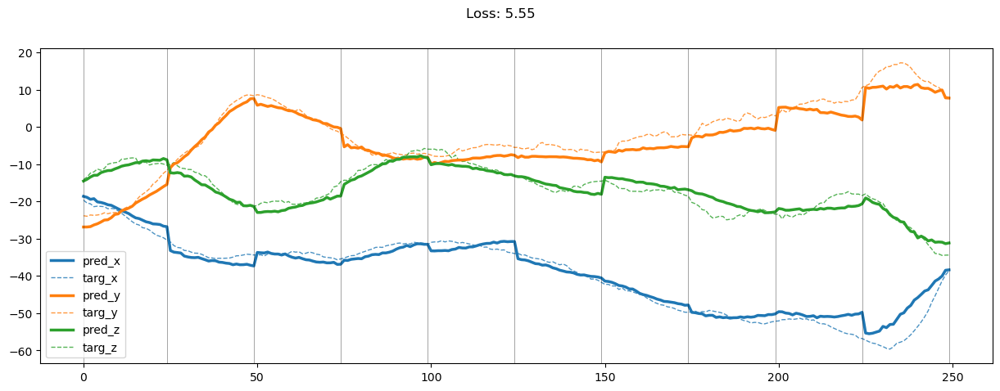

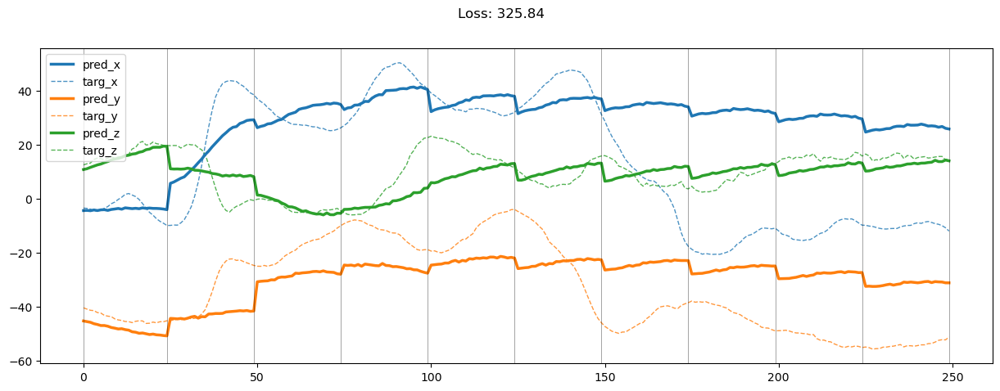

00349: train total loss:  6.867, pred loss:  6.867, valid total loss:  93.987, pred loss:  93.987


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00350: train total loss:  6.651, pred loss:  6.651, valid total loss:  95.763, pred loss:  95.763


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00351: train total loss:  6.705, pred loss:  6.705, valid total loss:  100.438, pred loss:  100.438


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


00352: train total loss:  6.603, pred loss:  6.603, valid total loss:  88.350, pred loss:  88.350


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00353: train total loss:  6.500, pred loss:  6.500, valid total loss:  92.166, pred loss:  92.166


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00354: train total loss:  6.767, pred loss:  6.767, valid total loss:  91.949, pred loss:  91.949


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00355: train total loss:  6.594, pred loss:  6.594, valid total loss:  99.580, pred loss:  99.580


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00356: train total loss:  6.656, pred loss:  6.656, valid total loss:  101.392, pred loss:  101.392


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00357: train total loss:  6.550, pred loss:  6.550, valid total loss:  105.015, pred loss:  105.015


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00358: train total loss:  6.339, pred loss:  6.339, valid total loss:  107.515, pred loss:  107.515


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00359: train total loss:  6.331, pred loss:  6.331, valid total loss:  105.798, pred loss:  105.798


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00360: train total loss:  6.418, pred loss:  6.418, valid total loss:  112.988, pred loss:  112.988


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00361: train total loss:  6.448, pred loss:  6.448, valid total loss:  102.959, pred loss:  102.959


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00362: train total loss:  6.306, pred loss:  6.306, valid total loss:  98.301, pred loss:  98.301


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00363: train total loss:  6.407, pred loss:  6.407, valid total loss:  101.379, pred loss:  101.379


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00364: train total loss:  6.340, pred loss:  6.340, valid total loss:  91.797, pred loss:  91.797


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00365: train total loss:  6.107, pred loss:  6.107, valid total loss:  103.388, pred loss:  103.388


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00366: train total loss:  6.263, pred loss:  6.263, valid total loss:  101.228, pred loss:  101.228


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00367: train total loss:  6.172, pred loss:  6.172, valid total loss:  99.334, pred loss:  99.334


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00368: train total loss:  6.241, pred loss:  6.241, valid total loss:  98.469, pred loss:  98.469


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00369: train total loss:  6.144, pred loss:  6.144, valid total loss:  99.656, pred loss:  99.656


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00370: train total loss:  6.467, pred loss:  6.467, valid total loss:  94.659, pred loss:  94.659


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00371: train total loss:  6.356, pred loss:  6.356, valid total loss:  95.850, pred loss:  95.850


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00372: train total loss:  6.360, pred loss:  6.360, valid total loss:  93.065, pred loss:  93.065


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00373: train total loss:  6.253, pred loss:  6.253, valid total loss:  102.659, pred loss:  102.659


100%|██████████| 6/6 [00:00<00:00, 18.63it/s]


00374: train total loss:  6.413, pred loss:  6.413, valid total loss:  104.442, pred loss:  104.442


100%|██████████| 6/6 [00:00<00:00, 19.22it/s]


00375: train total loss:  6.362, pred loss:  6.362, valid total loss:  100.529, pred loss:  100.529


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00376: train total loss:  6.152, pred loss:  6.152, valid total loss:  94.966, pred loss:  94.966


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00377: train total loss:  6.242, pred loss:  6.242, valid total loss:  94.905, pred loss:  94.905


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00378: train total loss:  6.401, pred loss:  6.401, valid total loss:  93.180, pred loss:  93.180


100%|██████████| 6/6 [00:00<00:00, 17.84it/s]


00379: train total loss:  6.030, pred loss:  6.030, valid total loss:  92.341, pred loss:  92.341


100%|██████████| 6/6 [00:00<00:00, 19.92it/s]


00380: train total loss:  6.023, pred loss:  6.023, valid total loss:  91.590, pred loss:  91.590


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


00381: train total loss:  6.105, pred loss:  6.105, valid total loss:  93.937, pred loss:  93.937


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00382: train total loss:  6.163, pred loss:  6.163, valid total loss:  93.680, pred loss:  93.680


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00383: train total loss:  5.916, pred loss:  5.916, valid total loss:  93.050, pred loss:  93.050


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00384: train total loss:  5.918, pred loss:  5.918, valid total loss:  101.418, pred loss:  101.418


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00385: train total loss:  5.873, pred loss:  5.873, valid total loss:  98.964, pred loss:  98.964


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00386: train total loss:  5.970, pred loss:  5.970, valid total loss:  95.466, pred loss:  95.466


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


00387: train total loss:  6.148, pred loss:  6.148, valid total loss:  94.896, pred loss:  94.896


100%|██████████| 6/6 [00:00<00:00, 20.95it/s]


00388: train total loss:  5.923, pred loss:  5.923, valid total loss:  102.005, pred loss:  102.005


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00389: train total loss:  5.903, pred loss:  5.903, valid total loss:  98.482, pred loss:  98.482


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00390: train total loss:  5.970, pred loss:  5.970, valid total loss:  95.069, pred loss:  95.069


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


00391: train total loss:  5.984, pred loss:  5.984, valid total loss:  98.245, pred loss:  98.245


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00392: train total loss:  5.879, pred loss:  5.879, valid total loss:  91.233, pred loss:  91.233


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00393: train total loss:  5.840, pred loss:  5.840, valid total loss:  97.255, pred loss:  97.255


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00394: train total loss:  5.815, pred loss:  5.815, valid total loss:  91.929, pred loss:  91.929


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00395: train total loss:  5.682, pred loss:  5.682, valid total loss:  97.658, pred loss:  97.658


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00396: train total loss:  5.589, pred loss:  5.589, valid total loss:  100.521, pred loss:  100.521


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00397: train total loss:  5.736, pred loss:  5.736, valid total loss:  91.355, pred loss:  91.355


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00398: train total loss:  5.687, pred loss:  5.687, valid total loss:  87.233, pred loss:  87.233


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


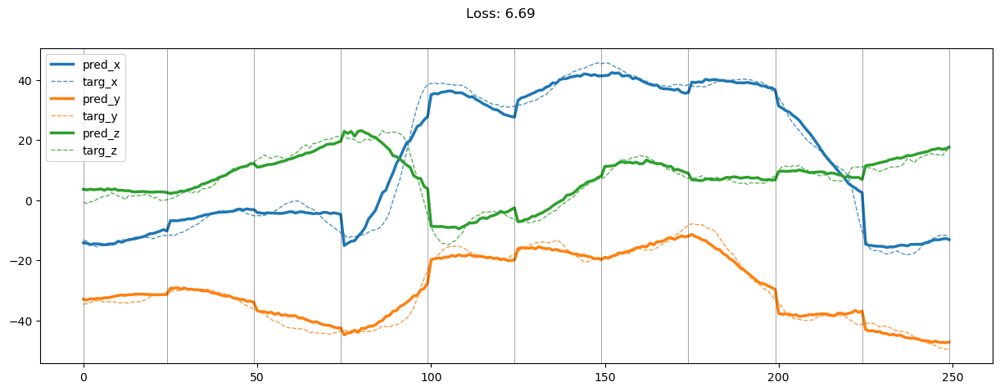

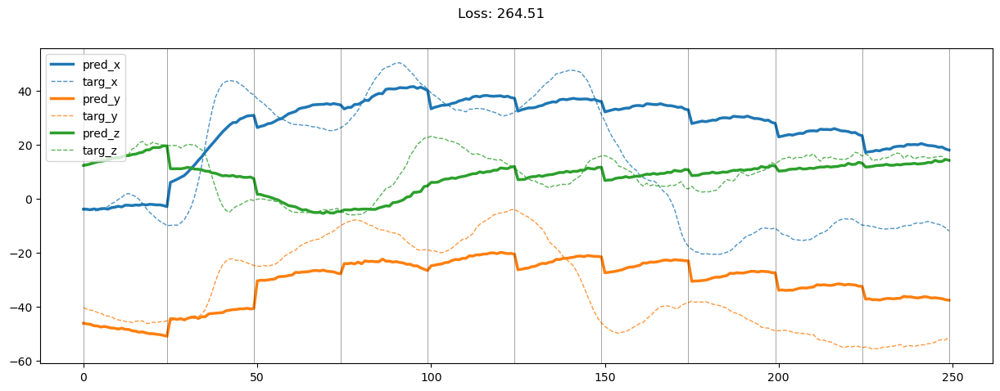

00399: train total loss:  5.748, pred loss:  5.748, valid total loss:  96.536, pred loss:  96.536


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00400: train total loss:  5.687, pred loss:  5.687, valid total loss:  100.624, pred loss:  100.624


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00401: train total loss:  5.526, pred loss:  5.526, valid total loss:  99.154, pred loss:  99.154


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00402: train total loss:  5.522, pred loss:  5.522, valid total loss:  98.213, pred loss:  98.213


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00403: train total loss:  5.599, pred loss:  5.599, valid total loss:  96.143, pred loss:  96.143


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00404: train total loss:  5.642, pred loss:  5.642, valid total loss:  90.144, pred loss:  90.144


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00405: train total loss:  5.657, pred loss:  5.657, valid total loss:  88.184, pred loss:  88.184


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00406: train total loss:  5.682, pred loss:  5.682, valid total loss:  93.034, pred loss:  93.034


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00407: train total loss:  5.545, pred loss:  5.545, valid total loss:  97.927, pred loss:  97.927


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00408: train total loss:  5.596, pred loss:  5.596, valid total loss:  97.673, pred loss:  97.673


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00409: train total loss:  5.642, pred loss:  5.642, valid total loss:  93.995, pred loss:  93.995


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00410: train total loss:  5.442, pred loss:  5.442, valid total loss:  93.035, pred loss:  93.035


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00411: train total loss:  5.439, pred loss:  5.439, valid total loss:  90.927, pred loss:  90.927


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


00412: train total loss:  5.610, pred loss:  5.610, valid total loss:  95.649, pred loss:  95.649


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00413: train total loss:  5.613, pred loss:  5.613, valid total loss:  98.599, pred loss:  98.599


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00414: train total loss:  5.597, pred loss:  5.597, valid total loss:  93.413, pred loss:  93.413


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00415: train total loss:  5.277, pred loss:  5.277, valid total loss:  88.777, pred loss:  88.777


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00416: train total loss:  5.375, pred loss:  5.375, valid total loss:  90.109, pred loss:  90.109


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00417: train total loss:  5.351, pred loss:  5.351, valid total loss:  91.565, pred loss:  91.565


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00418: train total loss:  5.367, pred loss:  5.367, valid total loss:  94.935, pred loss:  94.935


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00419: train total loss:  5.456, pred loss:  5.456, valid total loss:  95.082, pred loss:  95.082


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00420: train total loss:  5.322, pred loss:  5.322, valid total loss:  94.018, pred loss:  94.018


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00421: train total loss:  5.277, pred loss:  5.277, valid total loss:  95.667, pred loss:  95.667


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00422: train total loss:  5.282, pred loss:  5.282, valid total loss:  93.647, pred loss:  93.647


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00423: train total loss:  5.526, pred loss:  5.526, valid total loss:  90.415, pred loss:  90.415


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00424: train total loss:  5.419, pred loss:  5.419, valid total loss:  90.857, pred loss:  90.857


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00425: train total loss:  5.395, pred loss:  5.395, valid total loss:  92.693, pred loss:  92.693


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00426: train total loss:  5.266, pred loss:  5.266, valid total loss:  91.118, pred loss:  91.118


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


00427: train total loss:  5.249, pred loss:  5.249, valid total loss:  95.263, pred loss:  95.263


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00428: train total loss:  5.331, pred loss:  5.331, valid total loss:  93.779, pred loss:  93.779


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00429: train total loss:  5.366, pred loss:  5.366, valid total loss:  92.703, pred loss:  92.703


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00430: train total loss:  5.137, pred loss:  5.137, valid total loss:  86.956, pred loss:  86.956


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00431: train total loss:  5.025, pred loss:  5.025, valid total loss:  89.037, pred loss:  89.037


100%|██████████| 6/6 [00:00<00:00, 19.81it/s]


00432: train total loss:  5.096, pred loss:  5.096, valid total loss:  90.820, pred loss:  90.820


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00433: train total loss:  4.942, pred loss:  4.942, valid total loss:  91.292, pred loss:  91.292


100%|██████████| 6/6 [00:00<00:00, 18.78it/s]


00434: train total loss:  4.993, pred loss:  4.993, valid total loss:  92.432, pred loss:  92.432


100%|██████████| 6/6 [00:00<00:00, 17.50it/s]


00435: train total loss:  5.076, pred loss:  5.076, valid total loss:  92.725, pred loss:  92.725


100%|██████████| 6/6 [00:00<00:00, 17.68it/s]


00436: train total loss:  4.964, pred loss:  4.964, valid total loss:  90.601, pred loss:  90.601


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00437: train total loss:  5.018, pred loss:  5.018, valid total loss:  90.281, pred loss:  90.281


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00438: train total loss:  4.891, pred loss:  4.891, valid total loss:  88.871, pred loss:  88.871


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00439: train total loss:  5.021, pred loss:  5.021, valid total loss:  88.306, pred loss:  88.306


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00440: train total loss:  5.061, pred loss:  5.061, valid total loss:  87.178, pred loss:  87.178


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00441: train total loss:  5.127, pred loss:  5.127, valid total loss:  87.635, pred loss:  87.635


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00442: train total loss:  4.922, pred loss:  4.922, valid total loss:  87.174, pred loss:  87.174


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


00443: train total loss:  4.966, pred loss:  4.966, valid total loss:  87.526, pred loss:  87.526


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00444: train total loss:  4.938, pred loss:  4.938, valid total loss:  88.930, pred loss:  88.930


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00445: train total loss:  5.119, pred loss:  5.119, valid total loss:  87.759, pred loss:  87.759


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00446: train total loss:  5.027, pred loss:  5.027, valid total loss:  88.986, pred loss:  88.986


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00447: train total loss:  5.089, pred loss:  5.089, valid total loss:  90.624, pred loss:  90.624


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00448: train total loss:  5.051, pred loss:  5.051, valid total loss:  87.468, pred loss:  87.468


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


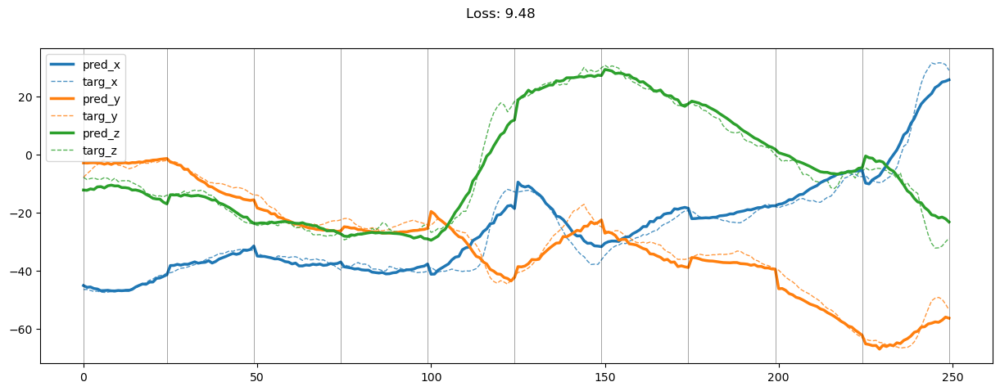

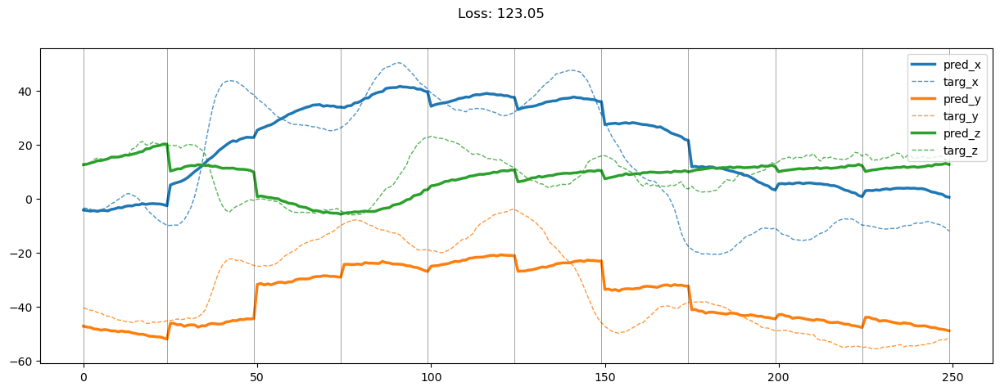

00449: train total loss:  5.031, pred loss:  5.031, valid total loss:  88.470, pred loss:  88.470


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00450: train total loss:  5.014, pred loss:  5.014, valid total loss:  87.471, pred loss:  87.471


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00451: train total loss:  5.143, pred loss:  5.143, valid total loss:  88.526, pred loss:  88.526


100%|██████████| 6/6 [00:00<00:00, 19.41it/s]


00452: train total loss:  5.042, pred loss:  5.042, valid total loss:  93.877, pred loss:  93.877


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


00453: train total loss:  5.050, pred loss:  5.050, valid total loss:  93.825, pred loss:  93.825


100%|██████████| 6/6 [00:00<00:00, 18.00it/s]


00454: train total loss:  5.079, pred loss:  5.079, valid total loss:  93.489, pred loss:  93.489


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00455: train total loss:  4.986, pred loss:  4.986, valid total loss:  94.502, pred loss:  94.502


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00456: train total loss:  4.882, pred loss:  4.882, valid total loss:  92.322, pred loss:  92.322


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00457: train total loss:  4.734, pred loss:  4.734, valid total loss:  91.182, pred loss:  91.182


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00458: train total loss:  5.018, pred loss:  5.018, valid total loss:  93.788, pred loss:  93.788


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00459: train total loss:  4.904, pred loss:  4.904, valid total loss:  94.292, pred loss:  94.292


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00460: train total loss:  5.068, pred loss:  5.068, valid total loss:  98.014, pred loss:  98.014


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00461: train total loss:  4.885, pred loss:  4.885, valid total loss:  96.483, pred loss:  96.483


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00462: train total loss:  4.855, pred loss:  4.855, valid total loss:  89.670, pred loss:  89.670


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00463: train total loss:  5.137, pred loss:  5.137, valid total loss:  92.761, pred loss:  92.761


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00464: train total loss:  5.134, pred loss:  5.134, valid total loss:  94.079, pred loss:  94.079


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00465: train total loss:  5.066, pred loss:  5.066, valid total loss:  97.322, pred loss:  97.322


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00466: train total loss:  4.958, pred loss:  4.958, valid total loss:  93.445, pred loss:  93.445


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00467: train total loss:  5.028, pred loss:  5.028, valid total loss:  93.387, pred loss:  93.387


100%|██████████| 6/6 [00:00<00:00, 20.17it/s]


00468: train total loss:  4.916, pred loss:  4.916, valid total loss:  90.523, pred loss:  90.523


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00469: train total loss:  4.867, pred loss:  4.867, valid total loss:  92.188, pred loss:  92.188


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00470: train total loss:  4.975, pred loss:  4.975, valid total loss:  94.105, pred loss:  94.105


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00471: train total loss:  4.989, pred loss:  4.989, valid total loss:  93.163, pred loss:  93.163


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00472: train total loss:  4.757, pred loss:  4.757, valid total loss:  86.727, pred loss:  86.727


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00473: train total loss:  4.826, pred loss:  4.826, valid total loss:  90.321, pred loss:  90.321


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


00474: train total loss:  4.920, pred loss:  4.920, valid total loss:  88.616, pred loss:  88.616


100%|██████████| 6/6 [00:00<00:00, 19.87it/s]


00475: train total loss:  4.827, pred loss:  4.827, valid total loss:  88.515, pred loss:  88.515


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00476: train total loss:  4.725, pred loss:  4.725, valid total loss:  87.772, pred loss:  87.772


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00477: train total loss:  4.782, pred loss:  4.782, valid total loss:  89.887, pred loss:  89.887


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00478: train total loss:  4.688, pred loss:  4.688, valid total loss:  88.356, pred loss:  88.356


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00479: train total loss:  4.707, pred loss:  4.707, valid total loss:  87.522, pred loss:  87.522


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00480: train total loss:  4.768, pred loss:  4.768, valid total loss:  89.685, pred loss:  89.685


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00481: train total loss:  4.454, pred loss:  4.454, valid total loss:  90.204, pred loss:  90.204


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00482: train total loss:  4.791, pred loss:  4.791, valid total loss:  88.535, pred loss:  88.535


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00483: train total loss:  4.561, pred loss:  4.561, valid total loss:  90.792, pred loss:  90.792


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00484: train total loss:  4.792, pred loss:  4.792, valid total loss:  87.038, pred loss:  87.038


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00485: train total loss:  4.565, pred loss:  4.565, valid total loss:  89.353, pred loss:  89.353


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


00486: train total loss:  4.589, pred loss:  4.589, valid total loss:  84.621, pred loss:  84.621


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00487: train total loss:  4.533, pred loss:  4.533, valid total loss:  87.587, pred loss:  87.587


100%|██████████| 6/6 [00:00<00:00, 19.09it/s]


00488: train total loss:  4.552, pred loss:  4.552, valid total loss:  91.349, pred loss:  91.349


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00489: train total loss:  4.659, pred loss:  4.659, valid total loss:  85.899, pred loss:  85.899


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00490: train total loss:  4.571, pred loss:  4.571, valid total loss:  85.484, pred loss:  85.484


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00491: train total loss:  4.418, pred loss:  4.418, valid total loss:  89.098, pred loss:  89.098


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


00492: train total loss:  4.437, pred loss:  4.437, valid total loss:  89.296, pred loss:  89.296


100%|██████████| 6/6 [00:00<00:00, 17.52it/s]


00493: train total loss:  4.448, pred loss:  4.448, valid total loss:  87.834, pred loss:  87.834


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00494: train total loss:  4.282, pred loss:  4.282, valid total loss:  91.541, pred loss:  91.541


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00495: train total loss:  4.375, pred loss:  4.375, valid total loss:  91.495, pred loss:  91.495


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00496: train total loss:  4.395, pred loss:  4.395, valid total loss:  94.473, pred loss:  94.473


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00497: train total loss:  4.174, pred loss:  4.174, valid total loss:  92.552, pred loss:  92.552


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00498: train total loss:  4.344, pred loss:  4.344, valid total loss:  90.957, pred loss:  90.957


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


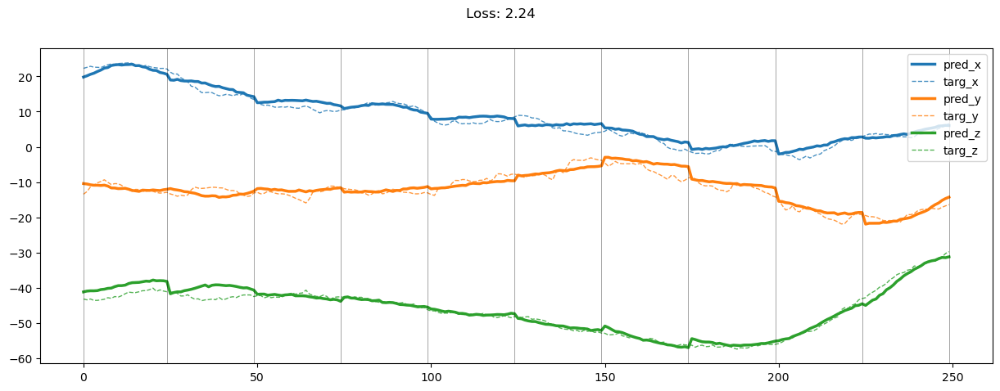

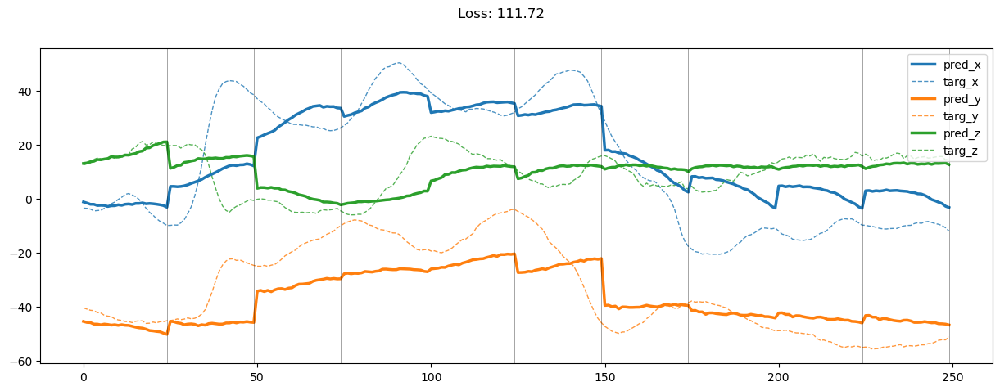

00499: train total loss:  4.383, pred loss:  4.383, valid total loss:  90.094, pred loss:  90.094


100%|██████████| 6/6 [00:00<00:00, 19.96it/s]


00500: train total loss:  4.403, pred loss:  4.403, valid total loss:  87.460, pred loss:  87.460


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00501: train total loss:  4.355, pred loss:  4.355, valid total loss:  90.985, pred loss:  90.985


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00502: train total loss:  4.334, pred loss:  4.334, valid total loss:  88.035, pred loss:  88.035


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00503: train total loss:  4.448, pred loss:  4.448, valid total loss:  85.249, pred loss:  85.249


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00504: train total loss:  4.594, pred loss:  4.594, valid total loss:  86.011, pred loss:  86.011


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00505: train total loss:  4.556, pred loss:  4.556, valid total loss:  89.323, pred loss:  89.323


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00506: train total loss:  4.547, pred loss:  4.547, valid total loss:  89.756, pred loss:  89.756


100%|██████████| 6/6 [00:00<00:00, 18.65it/s]


00507: train total loss:  4.536, pred loss:  4.536, valid total loss:  85.436, pred loss:  85.436


100%|██████████| 6/6 [00:00<00:00, 19.67it/s]


00508: train total loss:  4.417, pred loss:  4.417, valid total loss:  91.546, pred loss:  91.546


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00509: train total loss:  4.327, pred loss:  4.327, valid total loss:  95.230, pred loss:  95.230


100%|██████████| 6/6 [00:00<00:00, 19.40it/s]


00510: train total loss:  4.214, pred loss:  4.214, valid total loss:  91.639, pred loss:  91.639


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00511: train total loss:  4.139, pred loss:  4.139, valid total loss:  90.952, pred loss:  90.952


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00512: train total loss:  4.133, pred loss:  4.133, valid total loss:  91.309, pred loss:  91.309


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00513: train total loss:  4.102, pred loss:  4.102, valid total loss:  91.805, pred loss:  91.805


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00514: train total loss:  4.081, pred loss:  4.081, valid total loss:  93.249, pred loss:  93.249


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00515: train total loss:  3.965, pred loss:  3.965, valid total loss:  86.532, pred loss:  86.532


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00516: train total loss:  4.065, pred loss:  4.065, valid total loss:  89.773, pred loss:  89.773


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00517: train total loss:  3.953, pred loss:  3.953, valid total loss:  91.826, pred loss:  91.826


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00518: train total loss:  4.057, pred loss:  4.057, valid total loss:  93.667, pred loss:  93.667


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00519: train total loss:  3.932, pred loss:  3.932, valid total loss:  89.390, pred loss:  89.390


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00520: train total loss:  3.851, pred loss:  3.851, valid total loss:  87.745, pred loss:  87.745


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


00521: train total loss:  3.943, pred loss:  3.943, valid total loss:  86.966, pred loss:  86.966


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00522: train total loss:  3.976, pred loss:  3.976, valid total loss:  95.361, pred loss:  95.361


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


00523: train total loss:  3.944, pred loss:  3.944, valid total loss:  85.301, pred loss:  85.301


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00524: train total loss:  3.963, pred loss:  3.963, valid total loss:  87.854, pred loss:  87.854


100%|██████████| 6/6 [00:00<00:00, 19.80it/s]


00525: train total loss:  3.980, pred loss:  3.980, valid total loss:  91.261, pred loss:  91.261


100%|██████████| 6/6 [00:00<00:00, 19.95it/s]


00526: train total loss:  4.030, pred loss:  4.030, valid total loss:  89.508, pred loss:  89.508


100%|██████████| 6/6 [00:00<00:00, 19.73it/s]


00527: train total loss:  3.950, pred loss:  3.950, valid total loss:  88.750, pred loss:  88.750


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00528: train total loss:  3.836, pred loss:  3.836, valid total loss:  89.600, pred loss:  89.600


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00529: train total loss:  3.947, pred loss:  3.947, valid total loss:  89.655, pred loss:  89.655


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00530: train total loss:  3.825, pred loss:  3.825, valid total loss:  90.033, pred loss:  90.033


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


00531: train total loss:  3.761, pred loss:  3.761, valid total loss:  83.469, pred loss:  83.469


100%|██████████| 6/6 [00:00<00:00, 19.92it/s]


00532: train total loss:  3.810, pred loss:  3.810, valid total loss:  86.792, pred loss:  86.792


100%|██████████| 6/6 [00:00<00:00, 19.80it/s]


00533: train total loss:  3.785, pred loss:  3.785, valid total loss:  91.586, pred loss:  91.586


100%|██████████| 6/6 [00:00<00:00, 20.17it/s]


00534: train total loss:  3.824, pred loss:  3.824, valid total loss:  86.223, pred loss:  86.223


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00535: train total loss:  3.928, pred loss:  3.928, valid total loss:  88.586, pred loss:  88.586


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00536: train total loss:  3.838, pred loss:  3.838, valid total loss:  92.508, pred loss:  92.508


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00537: train total loss:  3.857, pred loss:  3.857, valid total loss:  90.360, pred loss:  90.360


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00538: train total loss:  3.872, pred loss:  3.872, valid total loss:  90.237, pred loss:  90.237


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00539: train total loss:  3.738, pred loss:  3.738, valid total loss:  93.141, pred loss:  93.141


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00540: train total loss:  3.811, pred loss:  3.811, valid total loss:  93.603, pred loss:  93.603


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


00541: train total loss:  3.702, pred loss:  3.702, valid total loss:  91.834, pred loss:  91.834


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00542: train total loss:  3.749, pred loss:  3.749, valid total loss:  86.375, pred loss:  86.375


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00543: train total loss:  3.630, pred loss:  3.630, valid total loss:  89.779, pred loss:  89.779


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00544: train total loss:  3.678, pred loss:  3.678, valid total loss:  87.075, pred loss:  87.075


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00545: train total loss:  3.722, pred loss:  3.722, valid total loss:  88.286, pred loss:  88.286


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00546: train total loss:  3.665, pred loss:  3.665, valid total loss:  89.773, pred loss:  89.773


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00547: train total loss:  3.763, pred loss:  3.763, valid total loss:  91.969, pred loss:  91.969


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00548: train total loss:  3.767, pred loss:  3.767, valid total loss:  88.728, pred loss:  88.728


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


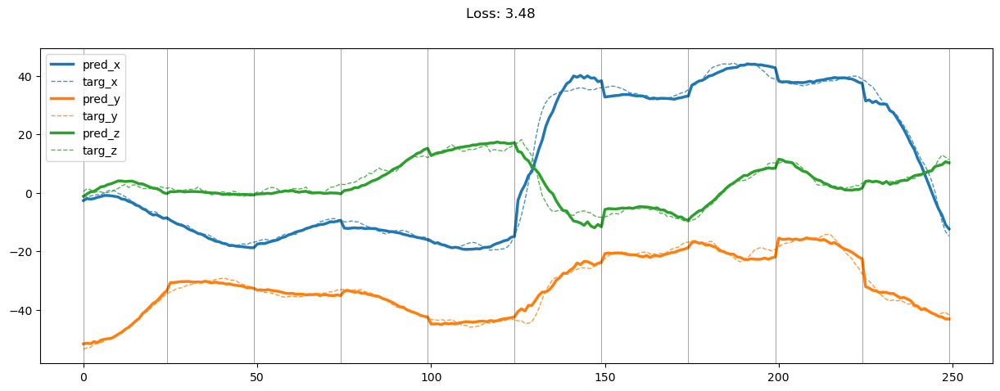

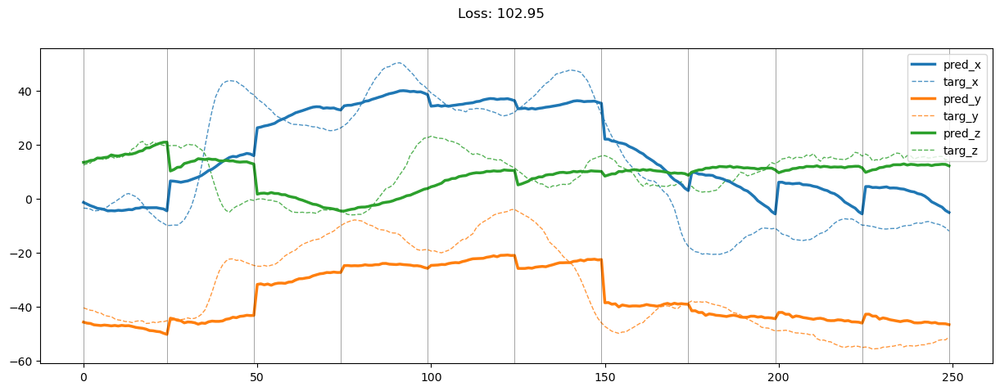

00549: train total loss:  3.762, pred loss:  3.762, valid total loss:  87.732, pred loss:  87.732


100%|██████████| 6/6 [00:00<00:00, 19.86it/s]


00550: train total loss:  3.637, pred loss:  3.637, valid total loss:  88.357, pred loss:  88.357


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00551: train total loss:  3.650, pred loss:  3.650, valid total loss:  88.918, pred loss:  88.918


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00552: train total loss:  3.700, pred loss:  3.700, valid total loss:  88.959, pred loss:  88.959


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00553: train total loss:  3.757, pred loss:  3.757, valid total loss:  85.464, pred loss:  85.464


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00554: train total loss:  3.769, pred loss:  3.769, valid total loss:  92.984, pred loss:  92.984


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


00555: train total loss:  3.856, pred loss:  3.856, valid total loss:  91.867, pred loss:  91.867


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00556: train total loss:  3.671, pred loss:  3.671, valid total loss:  90.863, pred loss:  90.863


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00557: train total loss:  3.690, pred loss:  3.690, valid total loss:  89.517, pred loss:  89.517


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00558: train total loss:  3.665, pred loss:  3.665, valid total loss:  86.560, pred loss:  86.560


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00559: train total loss:  3.520, pred loss:  3.520, valid total loss:  91.969, pred loss:  91.969


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00560: train total loss:  3.735, pred loss:  3.735, valid total loss:  88.390, pred loss:  88.390


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00561: train total loss:  3.841, pred loss:  3.841, valid total loss:  88.084, pred loss:  88.084


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00562: train total loss:  3.749, pred loss:  3.749, valid total loss:  90.380, pred loss:  90.380


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00563: train total loss:  3.670, pred loss:  3.670, valid total loss:  87.315, pred loss:  87.315


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00564: train total loss:  3.712, pred loss:  3.712, valid total loss:  86.874, pred loss:  86.874


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00565: train total loss:  3.670, pred loss:  3.670, valid total loss:  88.740, pred loss:  88.740


100%|██████████| 6/6 [00:00<00:00, 20.07it/s]


00566: train total loss:  3.557, pred loss:  3.557, valid total loss:  87.909, pred loss:  87.909


100%|██████████| 6/6 [00:00<00:00, 19.30it/s]


00567: train total loss:  3.612, pred loss:  3.612, valid total loss:  85.253, pred loss:  85.253


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00568: train total loss:  3.537, pred loss:  3.537, valid total loss:  84.483, pred loss:  84.483


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00569: train total loss:  3.567, pred loss:  3.567, valid total loss:  86.428, pred loss:  86.428


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00570: train total loss:  3.510, pred loss:  3.510, valid total loss:  90.490, pred loss:  90.490


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00571: train total loss:  3.580, pred loss:  3.580, valid total loss:  92.707, pred loss:  92.707


100%|██████████| 6/6 [00:00<00:00, 19.77it/s]


00572: train total loss:  3.504, pred loss:  3.504, valid total loss:  90.696, pred loss:  90.696


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00573: train total loss:  3.517, pred loss:  3.517, valid total loss:  91.763, pred loss:  91.763


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00574: train total loss:  3.509, pred loss:  3.509, valid total loss:  91.976, pred loss:  91.976


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00575: train total loss:  3.460, pred loss:  3.460, valid total loss:  88.238, pred loss:  88.238


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00576: train total loss:  3.367, pred loss:  3.367, valid total loss:  90.741, pred loss:  90.741


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


00577: train total loss:  3.561, pred loss:  3.561, valid total loss:  87.915, pred loss:  87.915


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00578: train total loss:  3.487, pred loss:  3.487, valid total loss:  88.468, pred loss:  88.468


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00579: train total loss:  3.455, pred loss:  3.455, valid total loss:  92.065, pred loss:  92.065


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00580: train total loss:  3.690, pred loss:  3.690, valid total loss:  87.404, pred loss:  87.404


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00581: train total loss:  3.517, pred loss:  3.517, valid total loss:  90.171, pred loss:  90.171


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00582: train total loss:  3.560, pred loss:  3.560, valid total loss:  91.650, pred loss:  91.650


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00583: train total loss:  3.429, pred loss:  3.429, valid total loss:  91.486, pred loss:  91.486


100%|██████████| 6/6 [00:00<00:00, 19.28it/s]


00584: train total loss:  3.502, pred loss:  3.502, valid total loss:  84.432, pred loss:  84.432


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00585: train total loss:  3.448, pred loss:  3.448, valid total loss:  84.598, pred loss:  84.598


100%|██████████| 6/6 [00:00<00:00, 19.46it/s]


00586: train total loss:  3.383, pred loss:  3.383, valid total loss:  89.128, pred loss:  89.128


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00587: train total loss:  3.460, pred loss:  3.460, valid total loss:  89.434, pred loss:  89.434


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00588: train total loss:  3.372, pred loss:  3.372, valid total loss:  87.083, pred loss:  87.083


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00589: train total loss:  3.348, pred loss:  3.348, valid total loss:  92.126, pred loss:  92.126


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00590: train total loss:  3.372, pred loss:  3.372, valid total loss:  90.627, pred loss:  90.627


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00591: train total loss:  3.408, pred loss:  3.408, valid total loss:  91.273, pred loss:  91.273


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00592: train total loss:  3.475, pred loss:  3.475, valid total loss:  91.223, pred loss:  91.223


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00593: train total loss:  3.399, pred loss:  3.399, valid total loss:  89.054, pred loss:  89.054


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00594: train total loss:  3.250, pred loss:  3.250, valid total loss:  87.869, pred loss:  87.869


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00595: train total loss:  3.366, pred loss:  3.366, valid total loss:  84.250, pred loss:  84.250


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00596: train total loss:  3.349, pred loss:  3.349, valid total loss:  89.355, pred loss:  89.355


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00597: train total loss:  3.252, pred loss:  3.252, valid total loss:  89.071, pred loss:  89.071


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00598: train total loss:  3.382, pred loss:  3.382, valid total loss:  88.704, pred loss:  88.704


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


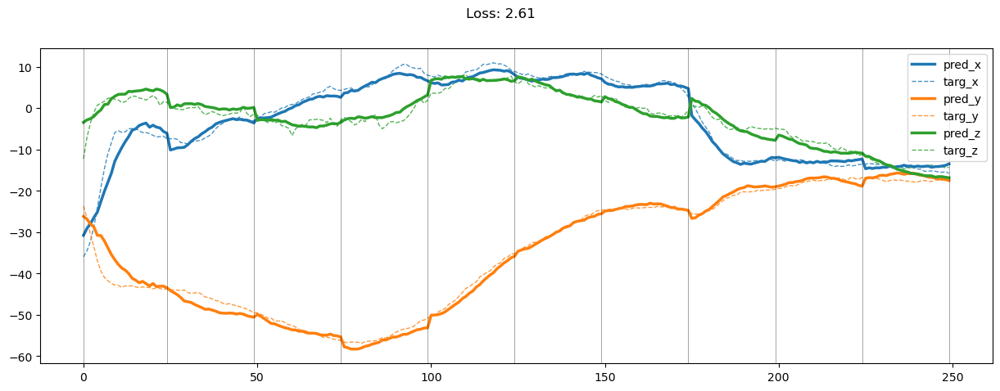

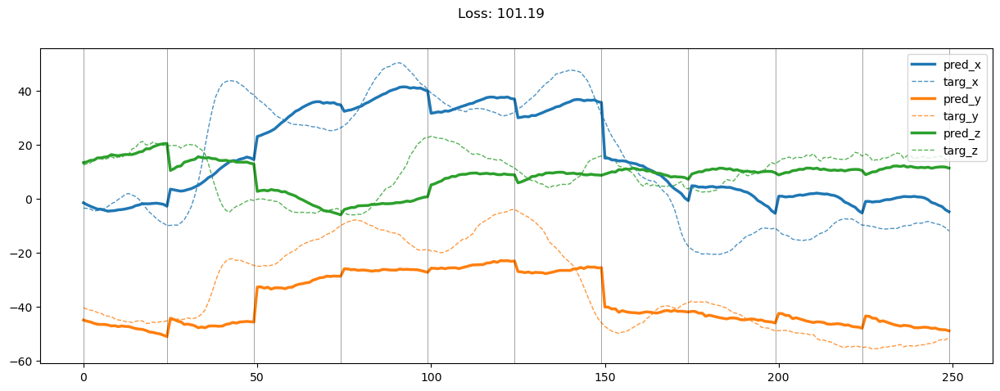

00599: train total loss:  3.339, pred loss:  3.339, valid total loss:  91.470, pred loss:  91.470


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00600: train total loss:  3.390, pred loss:  3.390, valid total loss:  91.011, pred loss:  91.011


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00601: train total loss:  3.387, pred loss:  3.387, valid total loss:  91.202, pred loss:  91.202


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00602: train total loss:  3.449, pred loss:  3.449, valid total loss:  88.763, pred loss:  88.763


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00603: train total loss:  3.429, pred loss:  3.429, valid total loss:  94.471, pred loss:  94.471


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00604: train total loss:  3.362, pred loss:  3.362, valid total loss:  93.402, pred loss:  93.402


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00605: train total loss:  3.400, pred loss:  3.400, valid total loss:  97.207, pred loss:  97.207


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00606: train total loss:  3.363, pred loss:  3.363, valid total loss:  95.083, pred loss:  95.083


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00607: train total loss:  3.513, pred loss:  3.513, valid total loss:  94.825, pred loss:  94.825


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00608: train total loss:  3.261, pred loss:  3.261, valid total loss:  92.713, pred loss:  92.713


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00609: train total loss:  3.226, pred loss:  3.226, valid total loss:  92.859, pred loss:  92.859


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00610: train total loss:  3.320, pred loss:  3.320, valid total loss:  93.145, pred loss:  93.145


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00611: train total loss:  3.213, pred loss:  3.213, valid total loss:  93.160, pred loss:  93.160


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00612: train total loss:  3.320, pred loss:  3.320, valid total loss:  94.009, pred loss:  94.009


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00613: train total loss:  3.134, pred loss:  3.134, valid total loss:  91.900, pred loss:  91.900


100%|██████████| 6/6 [00:00<00:00, 17.72it/s]


00614: train total loss:  3.114, pred loss:  3.114, valid total loss:  93.453, pred loss:  93.453


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00615: train total loss:  3.144, pred loss:  3.144, valid total loss:  96.466, pred loss:  96.466


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00616: train total loss:  3.119, pred loss:  3.119, valid total loss:  95.516, pred loss:  95.516


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00617: train total loss:  3.122, pred loss:  3.122, valid total loss:  92.941, pred loss:  92.941


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00618: train total loss:  3.180, pred loss:  3.180, valid total loss:  90.072, pred loss:  90.072


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00619: train total loss:  3.120, pred loss:  3.120, valid total loss:  91.932, pred loss:  91.932


100%|██████████| 6/6 [00:00<00:00, 20.14it/s]


00620: train total loss:  3.213, pred loss:  3.213, valid total loss:  91.592, pred loss:  91.592


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00621: train total loss:  3.162, pred loss:  3.162, valid total loss:  94.487, pred loss:  94.487


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00622: train total loss:  3.136, pred loss:  3.136, valid total loss:  93.436, pred loss:  93.436


100%|██████████| 6/6 [00:00<00:00, 18.10it/s]


00623: train total loss:  3.104, pred loss:  3.104, valid total loss:  95.046, pred loss:  95.046


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00624: train total loss:  3.149, pred loss:  3.149, valid total loss:  92.628, pred loss:  92.628


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00625: train total loss:  3.076, pred loss:  3.076, valid total loss:  90.793, pred loss:  90.793


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00626: train total loss:  3.073, pred loss:  3.073, valid total loss:  92.741, pred loss:  92.741


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00627: train total loss:  3.177, pred loss:  3.177, valid total loss:  91.947, pred loss:  91.947


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00628: train total loss:  3.058, pred loss:  3.058, valid total loss:  93.889, pred loss:  93.889


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00629: train total loss:  3.140, pred loss:  3.140, valid total loss:  91.766, pred loss:  91.766


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00630: train total loss:  3.018, pred loss:  3.018, valid total loss:  92.120, pred loss:  92.120


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00631: train total loss:  3.126, pred loss:  3.126, valid total loss:  95.157, pred loss:  95.157


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00632: train total loss:  3.090, pred loss:  3.090, valid total loss:  93.141, pred loss:  93.141


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00633: train total loss:  3.058, pred loss:  3.058, valid total loss:  92.151, pred loss:  92.151


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00634: train total loss:  3.003, pred loss:  3.003, valid total loss:  92.177, pred loss:  92.177


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00635: train total loss:  3.079, pred loss:  3.079, valid total loss:  95.071, pred loss:  95.071


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00636: train total loss:  3.108, pred loss:  3.108, valid total loss:  94.843, pred loss:  94.843


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00637: train total loss:  3.052, pred loss:  3.052, valid total loss:  96.691, pred loss:  96.691


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00638: train total loss:  3.038, pred loss:  3.038, valid total loss:  95.956, pred loss:  95.956


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00639: train total loss:  3.179, pred loss:  3.179, valid total loss:  93.644, pred loss:  93.644


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00640: train total loss:  3.087, pred loss:  3.087, valid total loss:  95.993, pred loss:  95.993


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00641: train total loss:  3.384, pred loss:  3.384, valid total loss:  94.256, pred loss:  94.256


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00642: train total loss:  3.449, pred loss:  3.449, valid total loss:  93.273, pred loss:  93.273


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00643: train total loss:  3.336, pred loss:  3.336, valid total loss:  93.349, pred loss:  93.349


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00644: train total loss:  3.181, pred loss:  3.181, valid total loss:  93.795, pred loss:  93.795


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00645: train total loss:  3.095, pred loss:  3.095, valid total loss:  93.076, pred loss:  93.076


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00646: train total loss:  3.014, pred loss:  3.014, valid total loss:  90.614, pred loss:  90.614


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00647: train total loss:  3.070, pred loss:  3.070, valid total loss:  88.746, pred loss:  88.746


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00648: train total loss:  3.101, pred loss:  3.101, valid total loss:  90.406, pred loss:  90.406


100%|██████████| 6/6 [00:00<00:00, 19.97it/s]


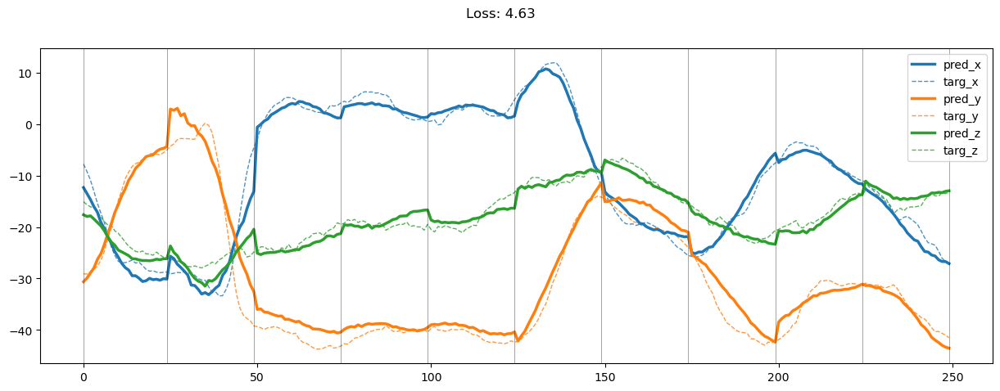

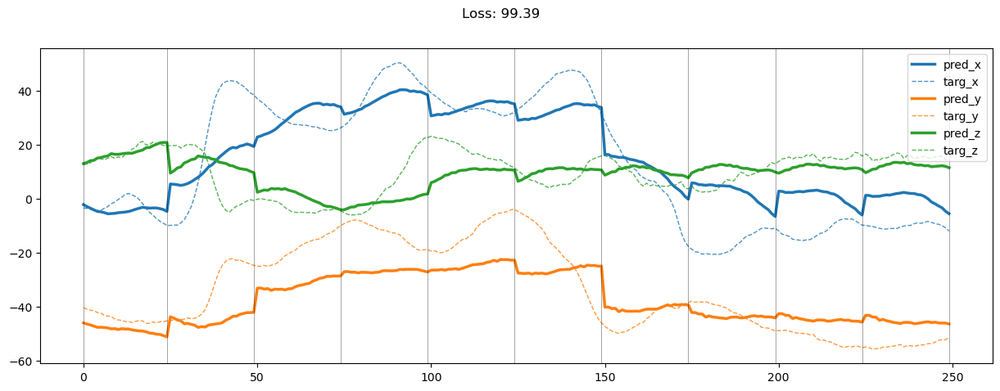

00649: train total loss:  3.031, pred loss:  3.031, valid total loss:  90.347, pred loss:  90.347


100%|██████████| 6/6 [00:00<00:00, 19.41it/s]


00650: train total loss:  3.026, pred loss:  3.026, valid total loss:  91.370, pred loss:  91.370


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00651: train total loss:  3.062, pred loss:  3.062, valid total loss:  90.996, pred loss:  90.996


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00652: train total loss:  3.008, pred loss:  3.008, valid total loss:  89.927, pred loss:  89.927


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00653: train total loss:  3.100, pred loss:  3.100, valid total loss:  91.639, pred loss:  91.639


100%|██████████| 6/6 [00:00<00:00, 19.41it/s]


00654: train total loss:  3.057, pred loss:  3.057, valid total loss:  92.319, pred loss:  92.319


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00655: train total loss:  3.038, pred loss:  3.038, valid total loss:  90.634, pred loss:  90.634


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00656: train total loss:  3.132, pred loss:  3.132, valid total loss:  87.618, pred loss:  87.618


100%|██████████| 6/6 [00:00<00:00, 19.41it/s]


00657: train total loss:  3.099, pred loss:  3.099, valid total loss:  86.532, pred loss:  86.532


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00658: train total loss:  3.082, pred loss:  3.082, valid total loss:  85.457, pred loss:  85.457


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00659: train total loss:  3.018, pred loss:  3.018, valid total loss:  89.176, pred loss:  89.176


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00660: train total loss:  3.079, pred loss:  3.079, valid total loss:  90.295, pred loss:  90.295


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00661: train total loss:  3.020, pred loss:  3.020, valid total loss:  90.772, pred loss:  90.772


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00662: train total loss:  3.017, pred loss:  3.017, valid total loss:  93.971, pred loss:  93.971


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00663: train total loss:  3.018, pred loss:  3.018, valid total loss:  93.401, pred loss:  93.401


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00664: train total loss:  2.979, pred loss:  2.979, valid total loss:  90.124, pred loss:  90.124


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00665: train total loss:  2.877, pred loss:  2.877, valid total loss:  90.557, pred loss:  90.557


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00666: train total loss:  3.004, pred loss:  3.004, valid total loss:  93.350, pred loss:  93.350


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00667: train total loss:  2.904, pred loss:  2.904, valid total loss:  96.501, pred loss:  96.501


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00668: train total loss:  2.820, pred loss:  2.820, valid total loss:  95.291, pred loss:  95.291


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00669: train total loss:  2.882, pred loss:  2.882, valid total loss:  94.987, pred loss:  94.987


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00670: train total loss:  2.768, pred loss:  2.768, valid total loss:  95.268, pred loss:  95.268


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


00671: train total loss:  2.872, pred loss:  2.872, valid total loss:  94.360, pred loss:  94.360


100%|██████████| 6/6 [00:00<00:00, 19.90it/s]


00672: train total loss:  2.768, pred loss:  2.768, valid total loss:  91.364, pred loss:  91.364


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00673: train total loss:  2.759, pred loss:  2.759, valid total loss:  93.142, pred loss:  93.142


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00674: train total loss:  2.808, pred loss:  2.808, valid total loss:  92.676, pred loss:  92.676


100%|██████████| 6/6 [00:00<00:00, 19.42it/s]


00675: train total loss:  2.951, pred loss:  2.951, valid total loss:  91.955, pred loss:  91.955


100%|██████████| 6/6 [00:00<00:00, 17.91it/s]


00676: train total loss:  3.047, pred loss:  3.047, valid total loss:  93.465, pred loss:  93.465


100%|██████████| 6/6 [00:00<00:00, 18.00it/s]


00677: train total loss:  3.048, pred loss:  3.048, valid total loss:  96.237, pred loss:  96.237


100%|██████████| 6/6 [00:00<00:00, 17.97it/s]


00678: train total loss:  3.138, pred loss:  3.138, valid total loss:  102.477, pred loss:  102.477


100%|██████████| 6/6 [00:00<00:00, 18.72it/s]


00679: train total loss:  3.069, pred loss:  3.069, valid total loss:  100.387, pred loss:  100.387


100%|██████████| 6/6 [00:00<00:00, 19.01it/s]


00680: train total loss:  2.997, pred loss:  2.997, valid total loss:  96.477, pred loss:  96.477


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00681: train total loss:  2.927, pred loss:  2.927, valid total loss:  101.138, pred loss:  101.138


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00682: train total loss:  2.937, pred loss:  2.937, valid total loss:  105.268, pred loss:  105.268


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00683: train total loss:  2.844, pred loss:  2.844, valid total loss:  96.687, pred loss:  96.687


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00684: train total loss:  2.884, pred loss:  2.884, valid total loss:  95.275, pred loss:  95.275


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00685: train total loss:  2.867, pred loss:  2.867, valid total loss:  94.310, pred loss:  94.310


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00686: train total loss:  2.785, pred loss:  2.785, valid total loss:  96.806, pred loss:  96.806


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00687: train total loss:  2.742, pred loss:  2.742, valid total loss:  97.805, pred loss:  97.805


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00688: train total loss:  2.812, pred loss:  2.812, valid total loss:  99.069, pred loss:  99.069


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00689: train total loss:  2.746, pred loss:  2.746, valid total loss:  96.142, pred loss:  96.142


100%|██████████| 6/6 [00:00<00:00, 20.17it/s]


00690: train total loss:  2.743, pred loss:  2.743, valid total loss:  94.746, pred loss:  94.746


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00691: train total loss:  2.806, pred loss:  2.806, valid total loss:  92.461, pred loss:  92.461


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00692: train total loss:  2.710, pred loss:  2.710, valid total loss:  92.818, pred loss:  92.818


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00693: train total loss:  2.716, pred loss:  2.716, valid total loss:  95.037, pred loss:  95.037


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00694: train total loss:  2.682, pred loss:  2.682, valid total loss:  98.235, pred loss:  98.235


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00695: train total loss:  2.724, pred loss:  2.724, valid total loss:  101.244, pred loss:  101.244


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00696: train total loss:  2.673, pred loss:  2.673, valid total loss:  96.808, pred loss:  96.808


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00697: train total loss:  2.738, pred loss:  2.738, valid total loss:  97.327, pred loss:  97.327


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00698: train total loss:  2.726, pred loss:  2.726, valid total loss:  97.665, pred loss:  97.665


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


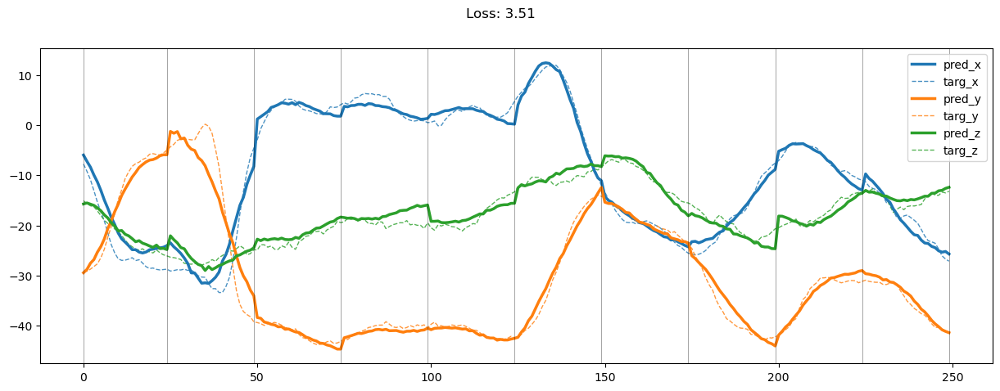

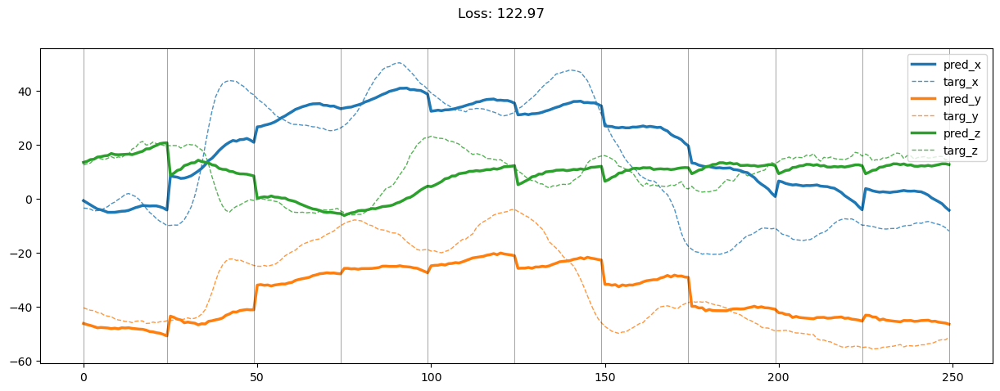

00699: train total loss:  2.730, pred loss:  2.730, valid total loss:  94.438, pred loss:  94.438


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00700: train total loss:  2.656, pred loss:  2.656, valid total loss:  101.181, pred loss:  101.181


100%|██████████| 6/6 [00:00<00:00, 17.55it/s]


00701: train total loss:  2.716, pred loss:  2.716, valid total loss:  99.225, pred loss:  99.225


100%|██████████| 6/6 [00:00<00:00, 18.01it/s]


00702: train total loss:  2.741, pred loss:  2.741, valid total loss:  97.922, pred loss:  97.922


100%|██████████| 6/6 [00:00<00:00, 17.94it/s]


00703: train total loss:  2.829, pred loss:  2.829, valid total loss:  95.248, pred loss:  95.248


100%|██████████| 6/6 [00:00<00:00, 17.81it/s]


00704: train total loss:  2.802, pred loss:  2.802, valid total loss:  93.284, pred loss:  93.284


100%|██████████| 6/6 [00:00<00:00, 19.51it/s]


00705: train total loss:  2.935, pred loss:  2.935, valid total loss:  92.822, pred loss:  92.822


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00706: train total loss:  2.932, pred loss:  2.932, valid total loss:  93.797, pred loss:  93.797


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00707: train total loss:  2.824, pred loss:  2.824, valid total loss:  95.296, pred loss:  95.296


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00708: train total loss:  2.755, pred loss:  2.755, valid total loss:  96.524, pred loss:  96.524


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00709: train total loss:  2.715, pred loss:  2.715, valid total loss:  93.691, pred loss:  93.691


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00710: train total loss:  2.665, pred loss:  2.665, valid total loss:  96.896, pred loss:  96.896


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00711: train total loss:  2.650, pred loss:  2.650, valid total loss:  97.572, pred loss:  97.572


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00712: train total loss:  2.682, pred loss:  2.682, valid total loss:  96.966, pred loss:  96.966


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00713: train total loss:  2.635, pred loss:  2.635, valid total loss:  98.814, pred loss:  98.814


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00714: train total loss:  2.604, pred loss:  2.604, valid total loss:  95.217, pred loss:  95.217


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00715: train total loss:  2.711, pred loss:  2.711, valid total loss:  99.980, pred loss:  99.980


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00716: train total loss:  2.761, pred loss:  2.761, valid total loss:  96.257, pred loss:  96.257


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00717: train total loss:  2.682, pred loss:  2.682, valid total loss:  96.800, pred loss:  96.800


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00718: train total loss:  2.671, pred loss:  2.671, valid total loss:  99.315, pred loss:  99.315


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00719: train total loss:  2.690, pred loss:  2.690, valid total loss:  97.770, pred loss:  97.770


100%|██████████| 6/6 [00:00<00:00, 19.86it/s]


00720: train total loss:  2.637, pred loss:  2.637, valid total loss:  95.852, pred loss:  95.852


100%|██████████| 6/6 [00:00<00:00, 19.45it/s]


00721: train total loss:  2.668, pred loss:  2.668, valid total loss:  98.034, pred loss:  98.034


100%|██████████| 6/6 [00:00<00:00, 18.14it/s]


00722: train total loss:  2.620, pred loss:  2.620, valid total loss:  95.589, pred loss:  95.589


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00723: train total loss:  2.609, pred loss:  2.609, valid total loss:  96.426, pred loss:  96.426


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00724: train total loss:  2.564, pred loss:  2.564, valid total loss:  95.238, pred loss:  95.238


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00725: train total loss:  2.627, pred loss:  2.627, valid total loss:  97.494, pred loss:  97.494


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00726: train total loss:  2.626, pred loss:  2.626, valid total loss:  96.539, pred loss:  96.539


100%|██████████| 6/6 [00:00<00:00, 19.13it/s]


00727: train total loss:  2.683, pred loss:  2.683, valid total loss:  93.809, pred loss:  93.809


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00728: train total loss:  2.680, pred loss:  2.680, valid total loss:  91.426, pred loss:  91.426


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00729: train total loss:  2.794, pred loss:  2.794, valid total loss:  93.454, pred loss:  93.454


100%|██████████| 6/6 [00:00<00:00, 19.25it/s]


00730: train total loss:  2.688, pred loss:  2.688, valid total loss:  94.297, pred loss:  94.297


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00731: train total loss:  2.657, pred loss:  2.657, valid total loss:  94.634, pred loss:  94.634


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00732: train total loss:  2.723, pred loss:  2.723, valid total loss:  98.196, pred loss:  98.196


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00733: train total loss:  2.673, pred loss:  2.673, valid total loss:  96.646, pred loss:  96.646


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00734: train total loss:  2.685, pred loss:  2.685, valid total loss:  94.381, pred loss:  94.381


100%|██████████| 6/6 [00:00<00:00, 20.14it/s]


00735: train total loss:  2.582, pred loss:  2.582, valid total loss:  95.011, pred loss:  95.011


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00736: train total loss:  2.619, pred loss:  2.619, valid total loss:  98.147, pred loss:  98.147


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00737: train total loss:  2.560, pred loss:  2.560, valid total loss:  99.539, pred loss:  99.539


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00738: train total loss:  2.614, pred loss:  2.614, valid total loss:  92.292, pred loss:  92.292


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00739: train total loss:  2.511, pred loss:  2.511, valid total loss:  95.714, pred loss:  95.714


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00740: train total loss:  2.684, pred loss:  2.684, valid total loss:  93.063, pred loss:  93.063


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00741: train total loss:  2.579, pred loss:  2.579, valid total loss:  94.352, pred loss:  94.352


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00742: train total loss:  2.566, pred loss:  2.566, valid total loss:  92.323, pred loss:  92.323


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


00743: train total loss:  2.516, pred loss:  2.516, valid total loss:  91.029, pred loss:  91.029


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


00744: train total loss:  2.454, pred loss:  2.454, valid total loss:  93.062, pred loss:  93.062


100%|██████████| 6/6 [00:00<00:00, 18.90it/s]


00745: train total loss:  2.502, pred loss:  2.502, valid total loss:  91.336, pred loss:  91.336


100%|██████████| 6/6 [00:00<00:00, 18.86it/s]


00746: train total loss:  2.539, pred loss:  2.539, valid total loss:  92.284, pred loss:  92.284


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00747: train total loss:  2.516, pred loss:  2.516, valid total loss:  93.041, pred loss:  93.041


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00748: train total loss:  2.506, pred loss:  2.506, valid total loss:  91.790, pred loss:  91.790


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


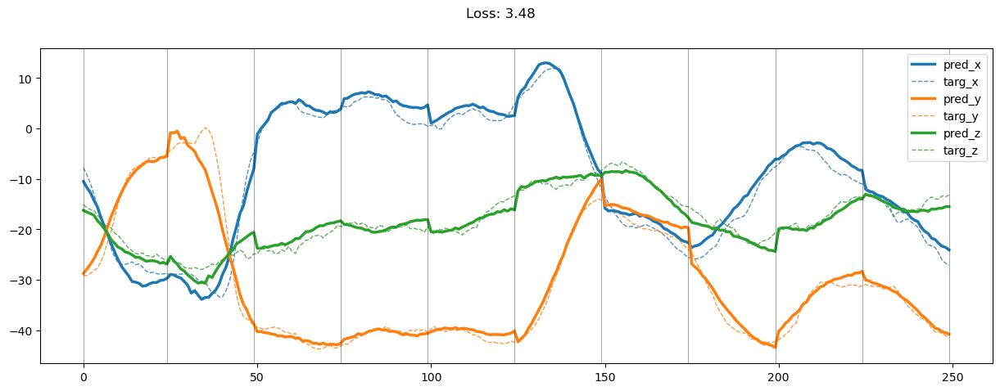

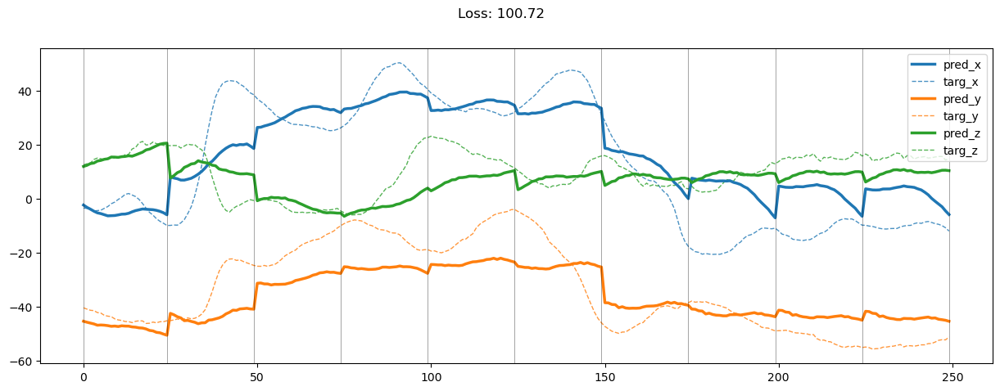

00749: train total loss:  2.505, pred loss:  2.505, valid total loss:  94.200, pred loss:  94.200


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00750: train total loss:  2.667, pred loss:  2.667, valid total loss:  93.860, pred loss:  93.860


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00751: train total loss:  2.650, pred loss:  2.650, valid total loss:  91.882, pred loss:  91.882


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00752: train total loss:  2.707, pred loss:  2.707, valid total loss:  93.846, pred loss:  93.846


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00753: train total loss:  2.573, pred loss:  2.573, valid total loss:  92.194, pred loss:  92.194


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00754: train total loss:  2.654, pred loss:  2.654, valid total loss:  93.286, pred loss:  93.286


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00755: train total loss:  2.780, pred loss:  2.780, valid total loss:  95.406, pred loss:  95.406


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00756: train total loss:  2.824, pred loss:  2.824, valid total loss:  94.136, pred loss:  94.136


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00757: train total loss:  2.815, pred loss:  2.815, valid total loss:  97.477, pred loss:  97.477


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00758: train total loss:  2.655, pred loss:  2.655, valid total loss:  94.785, pred loss:  94.785


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00759: train total loss:  2.713, pred loss:  2.713, valid total loss:  94.760, pred loss:  94.760


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00760: train total loss:  2.595, pred loss:  2.595, valid total loss:  94.188, pred loss:  94.188


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00761: train total loss:  2.528, pred loss:  2.528, valid total loss:  92.839, pred loss:  92.839


100%|██████████| 6/6 [00:00<00:00, 19.77it/s]


00762: train total loss:  2.555, pred loss:  2.555, valid total loss:  95.888, pred loss:  95.888


100%|██████████| 6/6 [00:00<00:00, 18.38it/s]


00763: train total loss:  2.546, pred loss:  2.546, valid total loss:  93.749, pred loss:  93.749


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00764: train total loss:  2.523, pred loss:  2.523, valid total loss:  94.789, pred loss:  94.789


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00765: train total loss:  2.494, pred loss:  2.494, valid total loss:  94.703, pred loss:  94.703


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00766: train total loss:  2.446, pred loss:  2.446, valid total loss:  94.130, pred loss:  94.130


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00767: train total loss:  2.389, pred loss:  2.389, valid total loss:  95.894, pred loss:  95.894


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


00768: train total loss:  2.385, pred loss:  2.385, valid total loss:  98.882, pred loss:  98.882


100%|██████████| 6/6 [00:00<00:00, 18.08it/s]


00769: train total loss:  2.353, pred loss:  2.353, valid total loss:  95.616, pred loss:  95.616


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00770: train total loss:  2.411, pred loss:  2.411, valid total loss:  97.324, pred loss:  97.324


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00771: train total loss:  2.424, pred loss:  2.424, valid total loss:  95.553, pred loss:  95.553


100%|██████████| 6/6 [00:00<00:00, 18.56it/s]


00772: train total loss:  2.441, pred loss:  2.441, valid total loss:  99.254, pred loss:  99.254


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00773: train total loss:  2.417, pred loss:  2.417, valid total loss:  95.675, pred loss:  95.675


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00774: train total loss:  2.431, pred loss:  2.431, valid total loss:  98.777, pred loss:  98.777


100%|██████████| 6/6 [00:00<00:00, 19.62it/s]


00775: train total loss:  2.451, pred loss:  2.451, valid total loss:  99.201, pred loss:  99.201


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00776: train total loss:  2.393, pred loss:  2.393, valid total loss:  94.229, pred loss:  94.229


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00777: train total loss:  2.537, pred loss:  2.537, valid total loss:  94.686, pred loss:  94.686


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00778: train total loss:  2.440, pred loss:  2.440, valid total loss:  96.163, pred loss:  96.163


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00779: train total loss:  2.440, pred loss:  2.440, valid total loss:  94.952, pred loss:  94.952


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00780: train total loss:  2.589, pred loss:  2.589, valid total loss:  93.022, pred loss:  93.022


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00781: train total loss:  2.530, pred loss:  2.530, valid total loss:  95.896, pred loss:  95.896


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


00782: train total loss:  2.417, pred loss:  2.417, valid total loss:  94.115, pred loss:  94.115


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00783: train total loss:  2.473, pred loss:  2.473, valid total loss:  92.894, pred loss:  92.894


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00784: train total loss:  2.475, pred loss:  2.475, valid total loss:  102.132, pred loss:  102.132


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00785: train total loss:  2.501, pred loss:  2.501, valid total loss:  104.492, pred loss:  104.492


100%|██████████| 6/6 [00:00<00:00, 19.97it/s]


00786: train total loss:  2.478, pred loss:  2.478, valid total loss:  101.001, pred loss:  101.001


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


00787: train total loss:  2.613, pred loss:  2.613, valid total loss:  99.551, pred loss:  99.551


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


00788: train total loss:  2.528, pred loss:  2.528, valid total loss:  103.174, pred loss:  103.174


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00789: train total loss:  2.673, pred loss:  2.673, valid total loss:  103.710, pred loss:  103.710


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00790: train total loss:  2.628, pred loss:  2.628, valid total loss:  98.809, pred loss:  98.809


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00791: train total loss:  2.416, pred loss:  2.416, valid total loss:  93.680, pred loss:  93.680


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00792: train total loss:  2.368, pred loss:  2.368, valid total loss:  94.173, pred loss:  94.173


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00793: train total loss:  2.404, pred loss:  2.404, valid total loss:  99.216, pred loss:  99.216


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00794: train total loss:  2.427, pred loss:  2.427, valid total loss:  97.369, pred loss:  97.369


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00795: train total loss:  2.347, pred loss:  2.347, valid total loss:  95.730, pred loss:  95.730


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00796: train total loss:  2.381, pred loss:  2.381, valid total loss:  93.785, pred loss:  93.785


100%|██████████| 6/6 [00:00<00:00, 18.97it/s]


00797: train total loss:  2.357, pred loss:  2.357, valid total loss:  103.933, pred loss:  103.933


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00798: train total loss:  2.299, pred loss:  2.299, valid total loss:  99.719, pred loss:  99.719


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


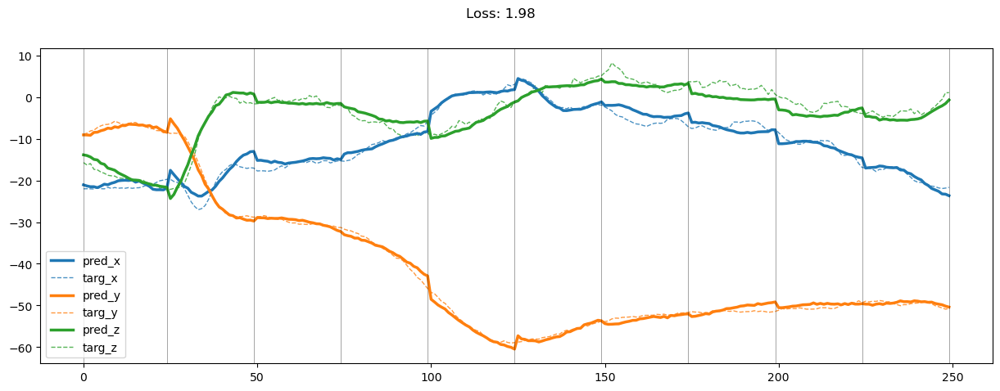

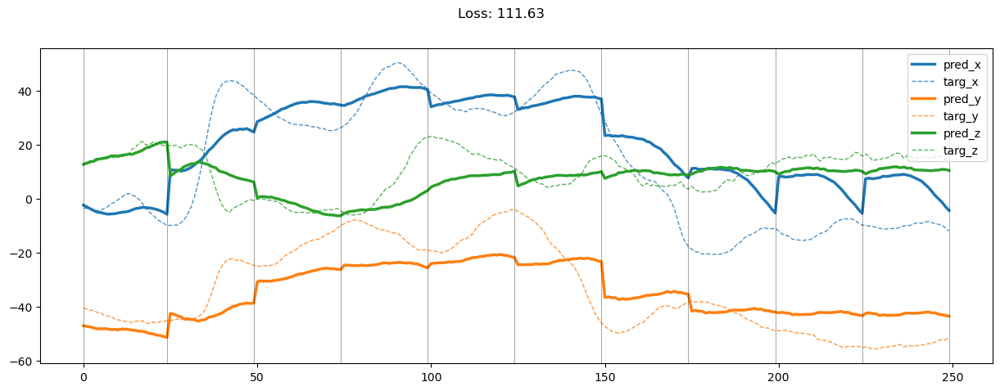

00799: train total loss:  2.298, pred loss:  2.298, valid total loss:  96.171, pred loss:  96.171


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00800: train total loss:  2.225, pred loss:  2.225, valid total loss:  95.478, pred loss:  95.478


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


00801: train total loss:  2.306, pred loss:  2.306, valid total loss:  91.642, pred loss:  91.642


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00802: train total loss:  2.390, pred loss:  2.390, valid total loss:  91.462, pred loss:  91.462


100%|██████████| 6/6 [00:00<00:00, 18.06it/s]


00803: train total loss:  2.452, pred loss:  2.452, valid total loss:  91.466, pred loss:  91.466


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00804: train total loss:  2.436, pred loss:  2.436, valid total loss:  92.259, pred loss:  92.259


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00805: train total loss:  2.479, pred loss:  2.479, valid total loss:  100.408, pred loss:  100.408


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00806: train total loss:  2.780, pred loss:  2.780, valid total loss:  93.616, pred loss:  93.616


100%|██████████| 6/6 [00:00<00:00, 18.18it/s]


00807: train total loss:  2.747, pred loss:  2.747, valid total loss:  94.665, pred loss:  94.665


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00808: train total loss:  2.672, pred loss:  2.672, valid total loss:  93.052, pred loss:  93.052


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00809: train total loss:  2.718, pred loss:  2.718, valid total loss:  93.343, pred loss:  93.343


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00810: train total loss:  2.673, pred loss:  2.673, valid total loss:  92.279, pred loss:  92.279


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00811: train total loss:  2.499, pred loss:  2.499, valid total loss:  94.781, pred loss:  94.781


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00812: train total loss:  2.385, pred loss:  2.385, valid total loss:  101.797, pred loss:  101.797


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00813: train total loss:  2.578, pred loss:  2.578, valid total loss:  85.118, pred loss:  85.118


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00814: train total loss:  2.917, pred loss:  2.917, valid total loss:  84.478, pred loss:  84.478


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00815: train total loss:  3.228, pred loss:  3.228, valid total loss:  98.238, pred loss:  98.238


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00816: train total loss:  8.628, pred loss:  8.628, valid total loss:  129.809, pred loss:  129.809


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


00817: train total loss:  18.792, pred loss:  18.792, valid total loss:  102.858, pred loss:  102.858


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00818: train total loss:  41.479, pred loss:  41.479, valid total loss:  162.920, pred loss:  162.920


100%|██████████| 6/6 [00:00<00:00, 17.93it/s]


00819: train total loss:  30.310, pred loss:  30.310, valid total loss:  141.473, pred loss:  141.473


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00820: train total loss:  26.071, pred loss:  26.071, valid total loss:  118.074, pred loss:  118.074


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00821: train total loss:  23.487, pred loss:  23.487, valid total loss:  135.753, pred loss:  135.753


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00822: train total loss:  21.596, pred loss:  21.596, valid total loss:  122.846, pred loss:  122.846


100%|██████████| 6/6 [00:00<00:00, 18.53it/s]


00823: train total loss:  21.224, pred loss:  21.224, valid total loss:  166.388, pred loss:  166.388


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00824: train total loss:  21.026, pred loss:  21.026, valid total loss:  107.021, pred loss:  107.021


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00825: train total loss:  19.054, pred loss:  19.054, valid total loss:  137.628, pred loss:  137.628


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00826: train total loss:  18.210, pred loss:  18.210, valid total loss:  97.333, pred loss:  97.333


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00827: train total loss:  13.645, pred loss:  13.645, valid total loss:  94.350, pred loss:  94.350


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00828: train total loss:  12.022, pred loss:  12.022, valid total loss:  91.178, pred loss:  91.178


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


00829: train total loss:  10.041, pred loss:  10.041, valid total loss:  98.992, pred loss:  98.992


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00830: train total loss:  8.735, pred loss:  8.735, valid total loss:  90.705, pred loss:  90.705


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00831: train total loss:  7.744, pred loss:  7.744, valid total loss:  81.784, pred loss:  81.784


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00832: train total loss:  7.040, pred loss:  7.040, valid total loss:  82.849, pred loss:  82.849


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00833: train total loss:  6.350, pred loss:  6.350, valid total loss:  83.808, pred loss:  83.808


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00834: train total loss:  5.819, pred loss:  5.819, valid total loss:  85.814, pred loss:  85.814


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00835: train total loss:  5.426, pred loss:  5.426, valid total loss:  83.945, pred loss:  83.945


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


00836: train total loss:  4.923, pred loss:  4.923, valid total loss:  84.727, pred loss:  84.727


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00837: train total loss:  4.877, pred loss:  4.877, valid total loss:  92.214, pred loss:  92.214


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00838: train total loss:  4.581, pred loss:  4.581, valid total loss:  85.069, pred loss:  85.069


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00839: train total loss:  4.372, pred loss:  4.372, valid total loss:  93.197, pred loss:  93.197


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00840: train total loss:  4.140, pred loss:  4.140, valid total loss:  92.132, pred loss:  92.132


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00841: train total loss:  3.927, pred loss:  3.927, valid total loss:  86.391, pred loss:  86.391


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00842: train total loss:  3.881, pred loss:  3.881, valid total loss:  84.534, pred loss:  84.534


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00843: train total loss:  3.682, pred loss:  3.682, valid total loss:  89.197, pred loss:  89.197


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00844: train total loss:  3.509, pred loss:  3.509, valid total loss:  93.118, pred loss:  93.118


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00845: train total loss:  3.563, pred loss:  3.563, valid total loss:  88.997, pred loss:  88.997


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00846: train total loss:  3.413, pred loss:  3.413, valid total loss:  86.001, pred loss:  86.001


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00847: train total loss:  3.410, pred loss:  3.410, valid total loss:  83.317, pred loss:  83.317


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00848: train total loss:  3.286, pred loss:  3.286, valid total loss:  84.598, pred loss:  84.598


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


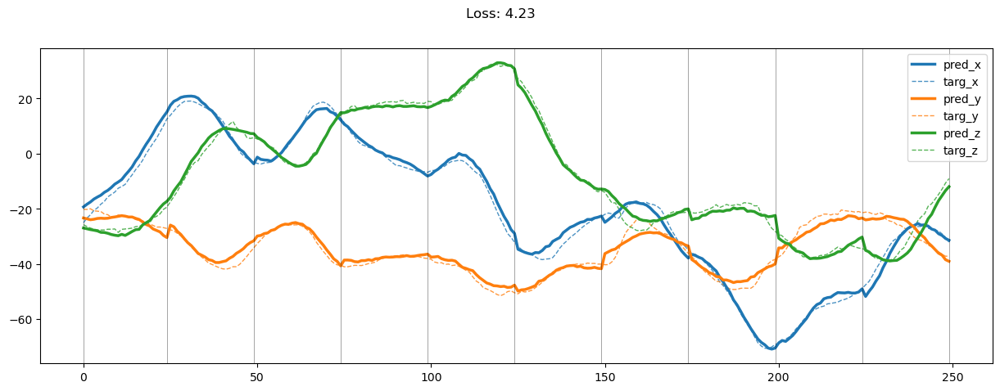

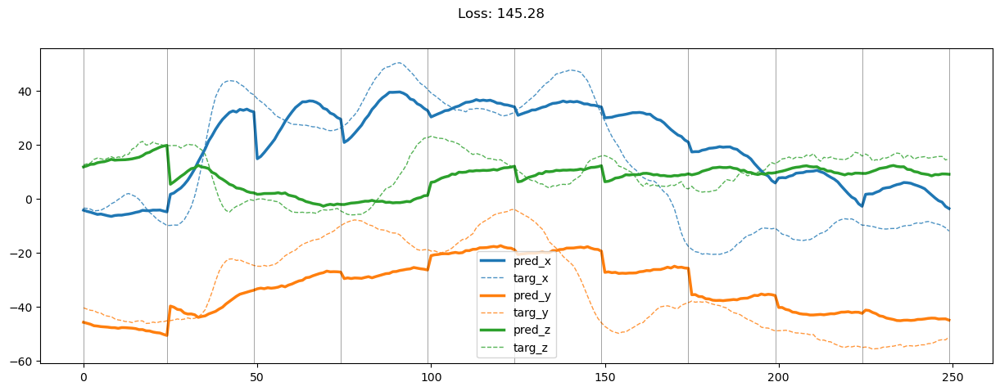

00849: train total loss:  3.300, pred loss:  3.300, valid total loss:  83.092, pred loss:  83.092


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00850: train total loss:  3.181, pred loss:  3.181, valid total loss:  82.880, pred loss:  82.880


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00851: train total loss:  3.188, pred loss:  3.188, valid total loss:  84.800, pred loss:  84.800


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00852: train total loss:  3.148, pred loss:  3.148, valid total loss:  85.564, pred loss:  85.564


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00853: train total loss:  3.156, pred loss:  3.156, valid total loss:  86.973, pred loss:  86.973


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00854: train total loss:  3.062, pred loss:  3.062, valid total loss:  86.733, pred loss:  86.733


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00855: train total loss:  3.080, pred loss:  3.080, valid total loss:  86.479, pred loss:  86.479


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00856: train total loss:  3.052, pred loss:  3.052, valid total loss:  84.718, pred loss:  84.718


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00857: train total loss:  3.025, pred loss:  3.025, valid total loss:  83.164, pred loss:  83.164


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00858: train total loss:  3.027, pred loss:  3.027, valid total loss:  85.528, pred loss:  85.528


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


00859: train total loss:  2.893, pred loss:  2.893, valid total loss:  86.385, pred loss:  86.385


100%|██████████| 6/6 [00:00<00:00, 19.84it/s]


00860: train total loss:  2.934, pred loss:  2.934, valid total loss:  88.040, pred loss:  88.040


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00861: train total loss:  2.903, pred loss:  2.903, valid total loss:  88.314, pred loss:  88.314


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00862: train total loss:  2.838, pred loss:  2.838, valid total loss:  85.209, pred loss:  85.209


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00863: train total loss:  2.870, pred loss:  2.870, valid total loss:  82.862, pred loss:  82.862


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


00864: train total loss:  2.767, pred loss:  2.767, valid total loss:  81.378, pred loss:  81.378


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00865: train total loss:  2.819, pred loss:  2.819, valid total loss:  82.432, pred loss:  82.432


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00866: train total loss:  2.762, pred loss:  2.762, valid total loss:  81.977, pred loss:  81.977


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00867: train total loss:  2.743, pred loss:  2.743, valid total loss:  83.954, pred loss:  83.954


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00868: train total loss:  2.715, pred loss:  2.715, valid total loss:  84.245, pred loss:  84.245


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


00869: train total loss:  2.720, pred loss:  2.720, valid total loss:  84.800, pred loss:  84.800


100%|██████████| 6/6 [00:00<00:00, 19.21it/s]


00870: train total loss:  2.684, pred loss:  2.684, valid total loss:  84.228, pred loss:  84.228


100%|██████████| 6/6 [00:00<00:00, 18.50it/s]


00871: train total loss:  2.778, pred loss:  2.778, valid total loss:  82.809, pred loss:  82.809


100%|██████████| 6/6 [00:00<00:00, 19.63it/s]


00872: train total loss:  2.712, pred loss:  2.712, valid total loss:  83.839, pred loss:  83.839


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00873: train total loss:  2.728, pred loss:  2.728, valid total loss:  83.908, pred loss:  83.908


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00874: train total loss:  2.737, pred loss:  2.737, valid total loss:  79.356, pred loss:  79.356


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00875: train total loss:  2.724, pred loss:  2.724, valid total loss:  78.946, pred loss:  78.946


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


00876: train total loss:  2.701, pred loss:  2.701, valid total loss:  80.529, pred loss:  80.529


100%|██████████| 6/6 [00:00<00:00, 20.08it/s]


00877: train total loss:  2.636, pred loss:  2.636, valid total loss:  80.076, pred loss:  80.076


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00878: train total loss:  2.595, pred loss:  2.595, valid total loss:  78.474, pred loss:  78.474


100%|██████████| 6/6 [00:00<00:00, 19.94it/s]


00879: train total loss:  2.556, pred loss:  2.556, valid total loss:  79.440, pred loss:  79.440


100%|██████████| 6/6 [00:00<00:00, 19.35it/s]


00880: train total loss:  2.561, pred loss:  2.561, valid total loss:  79.391, pred loss:  79.391


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00881: train total loss:  2.593, pred loss:  2.593, valid total loss:  78.500, pred loss:  78.500


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00882: train total loss:  2.677, pred loss:  2.677, valid total loss:  78.034, pred loss:  78.034


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00883: train total loss:  2.521, pred loss:  2.521, valid total loss:  79.662, pred loss:  79.662


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00884: train total loss:  2.502, pred loss:  2.502, valid total loss:  82.327, pred loss:  82.327


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00885: train total loss:  2.547, pred loss:  2.547, valid total loss:  81.419, pred loss:  81.419


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00886: train total loss:  2.507, pred loss:  2.507, valid total loss:  81.989, pred loss:  81.989


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00887: train total loss:  2.471, pred loss:  2.471, valid total loss:  80.460, pred loss:  80.460


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00888: train total loss:  2.484, pred loss:  2.484, valid total loss:  80.952, pred loss:  80.952


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00889: train total loss:  2.473, pred loss:  2.473, valid total loss:  81.549, pred loss:  81.549


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00890: train total loss:  2.432, pred loss:  2.432, valid total loss:  83.240, pred loss:  83.240


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00891: train total loss:  2.462, pred loss:  2.462, valid total loss:  79.955, pred loss:  79.955


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00892: train total loss:  2.504, pred loss:  2.504, valid total loss:  80.287, pred loss:  80.287


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00893: train total loss:  2.453, pred loss:  2.453, valid total loss:  79.868, pred loss:  79.868


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00894: train total loss:  2.435, pred loss:  2.435, valid total loss:  81.801, pred loss:  81.801


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00895: train total loss:  2.479, pred loss:  2.479, valid total loss:  81.537, pred loss:  81.537


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00896: train total loss:  2.482, pred loss:  2.482, valid total loss:  81.500, pred loss:  81.500


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00897: train total loss:  2.395, pred loss:  2.395, valid total loss:  80.932, pred loss:  80.932


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00898: train total loss:  2.417, pred loss:  2.417, valid total loss:  80.763, pred loss:  80.763


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


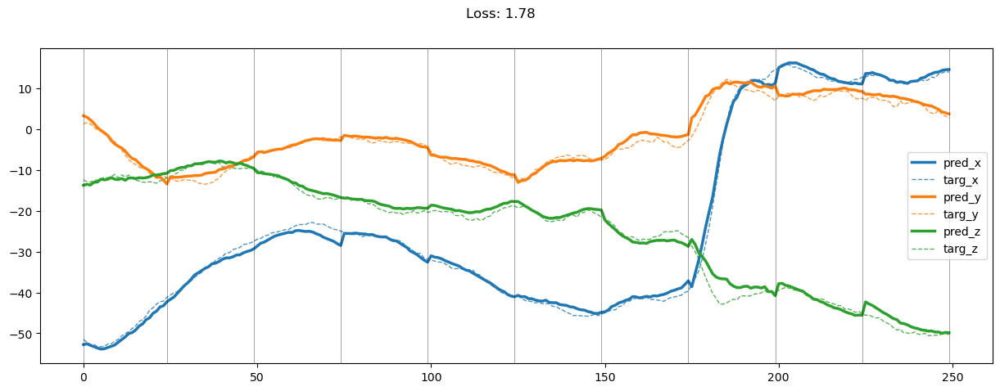

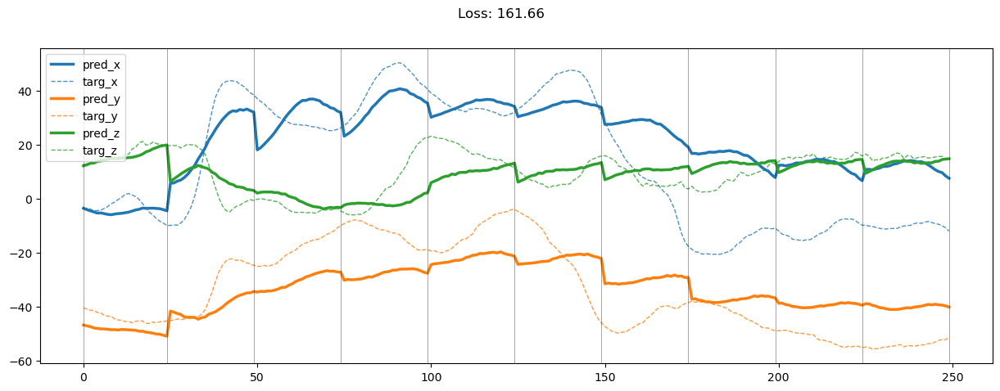

00899: train total loss:  2.391, pred loss:  2.391, valid total loss:  81.948, pred loss:  81.948


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00900: train total loss:  2.441, pred loss:  2.441, valid total loss:  80.118, pred loss:  80.118


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00901: train total loss:  2.407, pred loss:  2.407, valid total loss:  79.892, pred loss:  79.892


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00902: train total loss:  2.411, pred loss:  2.411, valid total loss:  78.555, pred loss:  78.555


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00903: train total loss:  2.459, pred loss:  2.459, valid total loss:  80.688, pred loss:  80.688


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


00904: train total loss:  2.481, pred loss:  2.481, valid total loss:  80.640, pred loss:  80.640


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00905: train total loss:  2.385, pred loss:  2.385, valid total loss:  79.793, pred loss:  79.793


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00906: train total loss:  2.389, pred loss:  2.389, valid total loss:  80.902, pred loss:  80.902


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00907: train total loss:  2.292, pred loss:  2.292, valid total loss:  79.920, pred loss:  79.920


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00908: train total loss:  2.344, pred loss:  2.344, valid total loss:  79.231, pred loss:  79.231


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00909: train total loss:  2.373, pred loss:  2.373, valid total loss:  77.946, pred loss:  77.946


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00910: train total loss:  2.315, pred loss:  2.315, valid total loss:  78.931, pred loss:  78.931


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00911: train total loss:  2.340, pred loss:  2.340, valid total loss:  79.174, pred loss:  79.174


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00912: train total loss:  2.378, pred loss:  2.378, valid total loss:  79.920, pred loss:  79.920


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00913: train total loss:  2.346, pred loss:  2.346, valid total loss:  79.708, pred loss:  79.708


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00914: train total loss:  2.323, pred loss:  2.323, valid total loss:  80.265, pred loss:  80.265


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00915: train total loss:  2.336, pred loss:  2.336, valid total loss:  80.358, pred loss:  80.358


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


00916: train total loss:  2.316, pred loss:  2.316, valid total loss:  79.353, pred loss:  79.353


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00917: train total loss:  2.288, pred loss:  2.288, valid total loss:  80.599, pred loss:  80.599


100%|██████████| 6/6 [00:00<00:00, 19.63it/s]


00918: train total loss:  2.236, pred loss:  2.236, valid total loss:  79.992, pred loss:  79.992


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00919: train total loss:  2.205, pred loss:  2.205, valid total loss:  79.854, pred loss:  79.854


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00920: train total loss:  2.256, pred loss:  2.256, valid total loss:  79.340, pred loss:  79.340


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00921: train total loss:  2.222, pred loss:  2.222, valid total loss:  77.855, pred loss:  77.855


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00922: train total loss:  2.268, pred loss:  2.268, valid total loss:  77.248, pred loss:  77.248


100%|██████████| 6/6 [00:00<00:00, 19.49it/s]


00923: train total loss:  2.249, pred loss:  2.249, valid total loss:  77.290, pred loss:  77.290


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00924: train total loss:  2.216, pred loss:  2.216, valid total loss:  79.485, pred loss:  79.485


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00925: train total loss:  2.276, pred loss:  2.276, valid total loss:  79.791, pred loss:  79.791


100%|██████████| 6/6 [00:00<00:00, 20.08it/s]


00926: train total loss:  2.204, pred loss:  2.204, valid total loss:  78.736, pred loss:  78.736


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00927: train total loss:  2.165, pred loss:  2.165, valid total loss:  78.222, pred loss:  78.222


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00928: train total loss:  2.177, pred loss:  2.177, valid total loss:  78.034, pred loss:  78.034


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00929: train total loss:  2.189, pred loss:  2.189, valid total loss:  77.872, pred loss:  77.872


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00930: train total loss:  2.116, pred loss:  2.116, valid total loss:  78.173, pred loss:  78.173


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00931: train total loss:  2.234, pred loss:  2.234, valid total loss:  78.590, pred loss:  78.590


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00932: train total loss:  2.154, pred loss:  2.154, valid total loss:  78.634, pred loss:  78.634


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00933: train total loss:  2.156, pred loss:  2.156, valid total loss:  77.905, pred loss:  77.905


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00934: train total loss:  2.163, pred loss:  2.163, valid total loss:  77.904, pred loss:  77.904


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00935: train total loss:  2.135, pred loss:  2.135, valid total loss:  78.632, pred loss:  78.632


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00936: train total loss:  2.159, pred loss:  2.159, valid total loss:  78.798, pred loss:  78.798


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00937: train total loss:  2.102, pred loss:  2.102, valid total loss:  79.895, pred loss:  79.895


100%|██████████| 6/6 [00:00<00:00, 19.95it/s]


00938: train total loss:  2.161, pred loss:  2.161, valid total loss:  78.504, pred loss:  78.504


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00939: train total loss:  2.145, pred loss:  2.145, valid total loss:  78.383, pred loss:  78.383


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00940: train total loss:  2.093, pred loss:  2.093, valid total loss:  77.294, pred loss:  77.294


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00941: train total loss:  2.170, pred loss:  2.170, valid total loss:  76.778, pred loss:  76.778


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00942: train total loss:  2.133, pred loss:  2.133, valid total loss:  77.065, pred loss:  77.065


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00943: train total loss:  2.156, pred loss:  2.156, valid total loss:  77.170, pred loss:  77.170


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00944: train total loss:  2.140, pred loss:  2.140, valid total loss:  77.102, pred loss:  77.102


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00945: train total loss:  2.147, pred loss:  2.147, valid total loss:  78.102, pred loss:  78.102


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00946: train total loss:  2.129, pred loss:  2.129, valid total loss:  79.023, pred loss:  79.023


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00947: train total loss:  2.110, pred loss:  2.110, valid total loss:  78.258, pred loss:  78.258


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00948: train total loss:  2.152, pred loss:  2.152, valid total loss:  77.703, pred loss:  77.703


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


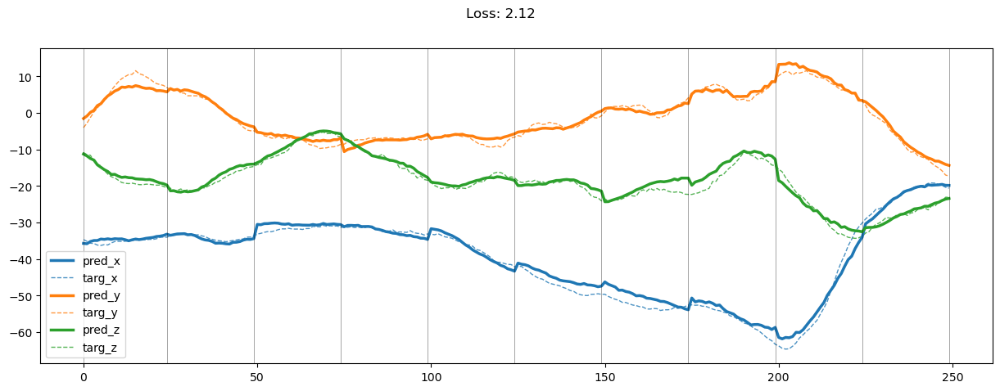

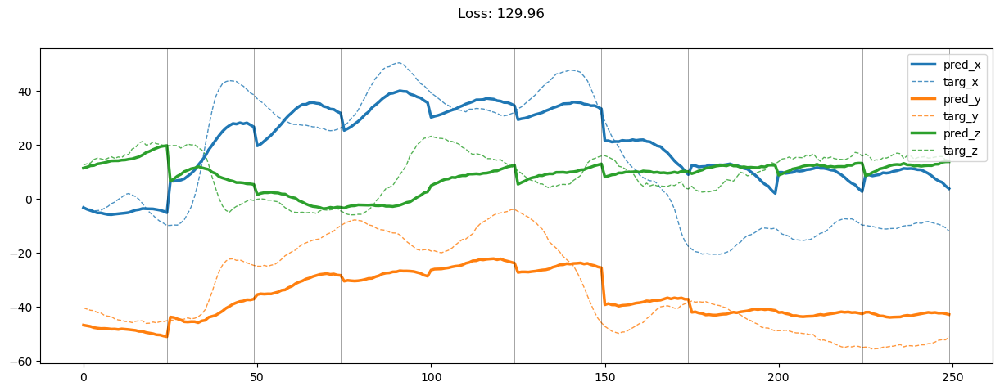

00949: train total loss:  2.159, pred loss:  2.159, valid total loss:  78.276, pred loss:  78.276


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00950: train total loss:  2.166, pred loss:  2.166, valid total loss:  76.699, pred loss:  76.699


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


00951: train total loss:  2.138, pred loss:  2.138, valid total loss:  76.671, pred loss:  76.671


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00952: train total loss:  2.146, pred loss:  2.146, valid total loss:  76.749, pred loss:  76.749


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00953: train total loss:  2.111, pred loss:  2.111, valid total loss:  77.142, pred loss:  77.142


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00954: train total loss:  2.072, pred loss:  2.072, valid total loss:  77.061, pred loss:  77.061


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00955: train total loss:  2.055, pred loss:  2.055, valid total loss:  78.303, pred loss:  78.303


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00956: train total loss:  2.090, pred loss:  2.090, valid total loss:  78.241, pred loss:  78.241


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00957: train total loss:  2.051, pred loss:  2.051, valid total loss:  79.093, pred loss:  79.093


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00958: train total loss:  2.103, pred loss:  2.103, valid total loss:  77.663, pred loss:  77.663


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00959: train total loss:  2.094, pred loss:  2.094, valid total loss:  78.556, pred loss:  78.556


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00960: train total loss:  2.120, pred loss:  2.120, valid total loss:  78.197, pred loss:  78.197


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00961: train total loss:  2.078, pred loss:  2.078, valid total loss:  78.121, pred loss:  78.121


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00962: train total loss:  2.089, pred loss:  2.089, valid total loss:  78.835, pred loss:  78.835


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


00963: train total loss:  2.036, pred loss:  2.036, valid total loss:  78.714, pred loss:  78.714


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00964: train total loss:  2.113, pred loss:  2.113, valid total loss:  78.601, pred loss:  78.601


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00965: train total loss:  2.082, pred loss:  2.082, valid total loss:  79.070, pred loss:  79.070


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00966: train total loss:  2.049, pred loss:  2.049, valid total loss:  79.596, pred loss:  79.596


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00967: train total loss:  2.018, pred loss:  2.018, valid total loss:  78.656, pred loss:  78.656


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00968: train total loss:  2.043, pred loss:  2.043, valid total loss:  78.117, pred loss:  78.117


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


00969: train total loss:  1.980, pred loss:  1.980, valid total loss:  79.034, pred loss:  79.034


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00970: train total loss:  2.010, pred loss:  2.010, valid total loss:  79.754, pred loss:  79.754


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


00971: train total loss:  2.049, pred loss:  2.049, valid total loss:  79.513, pred loss:  79.513


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00972: train total loss:  2.032, pred loss:  2.032, valid total loss:  80.729, pred loss:  80.729


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00973: train total loss:  2.001, pred loss:  2.001, valid total loss:  78.024, pred loss:  78.024


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00974: train total loss:  2.009, pred loss:  2.009, valid total loss:  79.662, pred loss:  79.662


100%|██████████| 6/6 [00:00<00:00, 19.70it/s]


00975: train total loss:  2.020, pred loss:  2.020, valid total loss:  80.906, pred loss:  80.906


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00976: train total loss:  1.971, pred loss:  1.971, valid total loss:  79.604, pred loss:  79.604


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00977: train total loss:  2.083, pred loss:  2.083, valid total loss:  81.547, pred loss:  81.547


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00978: train total loss:  1.991, pred loss:  1.991, valid total loss:  79.839, pred loss:  79.839


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00979: train total loss:  2.043, pred loss:  2.043, valid total loss:  79.877, pred loss:  79.877


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00980: train total loss:  1.998, pred loss:  1.998, valid total loss:  80.804, pred loss:  80.804


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00981: train total loss:  1.986, pred loss:  1.986, valid total loss:  80.426, pred loss:  80.426


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00982: train total loss:  1.964, pred loss:  1.964, valid total loss:  81.170, pred loss:  81.170


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00983: train total loss:  1.982, pred loss:  1.982, valid total loss:  80.455, pred loss:  80.455


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00984: train total loss:  1.954, pred loss:  1.954, valid total loss:  80.598, pred loss:  80.598


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


00985: train total loss:  2.050, pred loss:  2.050, valid total loss:  80.432, pred loss:  80.432


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


00986: train total loss:  2.019, pred loss:  2.019, valid total loss:  80.940, pred loss:  80.940


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


00987: train total loss:  2.026, pred loss:  2.026, valid total loss:  80.827, pred loss:  80.827


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00988: train total loss:  2.010, pred loss:  2.010, valid total loss:  82.414, pred loss:  82.414


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00989: train total loss:  1.943, pred loss:  1.943, valid total loss:  79.973, pred loss:  79.973


100%|██████████| 6/6 [00:00<00:00, 18.07it/s]


00990: train total loss:  1.967, pred loss:  1.967, valid total loss:  78.630, pred loss:  78.630


100%|██████████| 6/6 [00:00<00:00, 17.63it/s]


00991: train total loss:  1.924, pred loss:  1.924, valid total loss:  79.343, pred loss:  79.343


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00992: train total loss:  1.962, pred loss:  1.962, valid total loss:  79.136, pred loss:  79.136


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00993: train total loss:  1.970, pred loss:  1.970, valid total loss:  78.736, pred loss:  78.736


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00994: train total loss:  1.921, pred loss:  1.921, valid total loss:  77.507, pred loss:  77.507


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00995: train total loss:  1.866, pred loss:  1.866, valid total loss:  78.860, pred loss:  78.860


100%|██████████| 6/6 [00:00<00:00, 17.70it/s]


00996: train total loss:  1.894, pred loss:  1.894, valid total loss:  78.807, pred loss:  78.807


100%|██████████| 6/6 [00:00<00:00, 17.64it/s]


00997: train total loss:  1.901, pred loss:  1.901, valid total loss:  78.289, pred loss:  78.289


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00998: train total loss:  1.925, pred loss:  1.925, valid total loss:  79.112, pred loss:  79.112


100%|██████████| 6/6 [00:00<00:00, 19.38it/s]


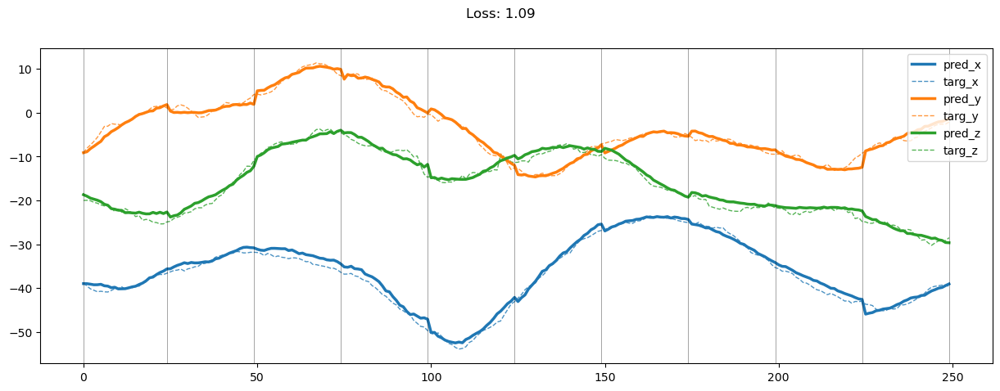

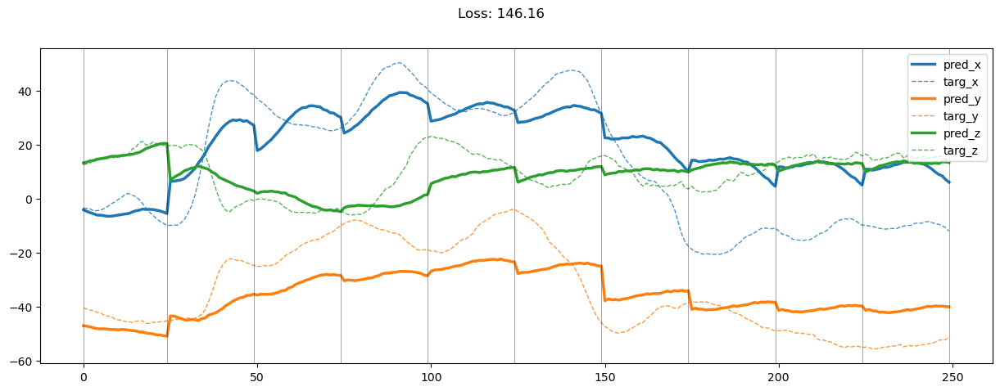

00999: train total loss:  1.927, pred loss:  1.927, valid total loss:  79.366, pred loss:  79.366


100%|██████████| 6/6 [00:00<00:00, 18.46it/s]


01000: train total loss:  1.909, pred loss:  1.909, valid total loss:  80.389, pred loss:  80.389


100%|██████████| 6/6 [00:00<00:00, 19.14it/s]


01001: train total loss:  1.904, pred loss:  1.904, valid total loss:  79.208, pred loss:  79.208


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01002: train total loss:  1.936, pred loss:  1.936, valid total loss:  79.266, pred loss:  79.266


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01003: train total loss:  1.937, pred loss:  1.937, valid total loss:  77.593, pred loss:  77.593


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01004: train total loss:  1.879, pred loss:  1.879, valid total loss:  78.943, pred loss:  78.943


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01005: train total loss:  1.915, pred loss:  1.915, valid total loss:  80.621, pred loss:  80.621


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01006: train total loss:  1.889, pred loss:  1.889, valid total loss:  77.938, pred loss:  77.938


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01007: train total loss:  1.942, pred loss:  1.942, valid total loss:  79.883, pred loss:  79.883


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01008: train total loss:  1.924, pred loss:  1.924, valid total loss:  81.053, pred loss:  81.053


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01009: train total loss:  1.915, pred loss:  1.915, valid total loss:  79.103, pred loss:  79.103


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01010: train total loss:  1.992, pred loss:  1.992, valid total loss:  77.741, pred loss:  77.741


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01011: train total loss:  1.965, pred loss:  1.965, valid total loss:  77.258, pred loss:  77.258


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01012: train total loss:  1.904, pred loss:  1.904, valid total loss:  77.862, pred loss:  77.862


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01013: train total loss:  1.893, pred loss:  1.893, valid total loss:  77.653, pred loss:  77.653


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01014: train total loss:  1.851, pred loss:  1.851, valid total loss:  79.205, pred loss:  79.205


100%|██████████| 6/6 [00:00<00:00, 19.59it/s]


01015: train total loss:  1.857, pred loss:  1.857, valid total loss:  78.615, pred loss:  78.615


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01016: train total loss:  1.833, pred loss:  1.833, valid total loss:  77.360, pred loss:  77.360


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01017: train total loss:  1.845, pred loss:  1.845, valid total loss:  78.055, pred loss:  78.055


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01018: train total loss:  1.807, pred loss:  1.807, valid total loss:  78.521, pred loss:  78.521


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01019: train total loss:  1.892, pred loss:  1.892, valid total loss:  77.927, pred loss:  77.927


100%|██████████| 6/6 [00:00<00:00, 18.07it/s]


01020: train total loss:  1.889, pred loss:  1.889, valid total loss:  78.283, pred loss:  78.283


100%|██████████| 6/6 [00:00<00:00, 17.94it/s]


01021: train total loss:  1.855, pred loss:  1.855, valid total loss:  76.386, pred loss:  76.386


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01022: train total loss:  1.798, pred loss:  1.798, valid total loss:  75.343, pred loss:  75.343


100%|██████████| 6/6 [00:00<00:00, 19.65it/s]


01023: train total loss:  1.881, pred loss:  1.881, valid total loss:  76.811, pred loss:  76.811


100%|██████████| 6/6 [00:00<00:00, 18.53it/s]


01024: train total loss:  1.828, pred loss:  1.828, valid total loss:  78.997, pred loss:  78.997


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01025: train total loss:  1.920, pred loss:  1.920, valid total loss:  78.014, pred loss:  78.014


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01026: train total loss:  1.890, pred loss:  1.890, valid total loss:  78.116, pred loss:  78.116


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


01027: train total loss:  1.895, pred loss:  1.895, valid total loss:  79.759, pred loss:  79.759


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01028: train total loss:  1.923, pred loss:  1.923, valid total loss:  76.938, pred loss:  76.938


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01029: train total loss:  1.884, pred loss:  1.884, valid total loss:  77.117, pred loss:  77.117


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01030: train total loss:  1.897, pred loss:  1.897, valid total loss:  78.979, pred loss:  78.979


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01031: train total loss:  1.889, pred loss:  1.889, valid total loss:  78.033, pred loss:  78.033


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01032: train total loss:  1.857, pred loss:  1.857, valid total loss:  77.438, pred loss:  77.438


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01033: train total loss:  1.823, pred loss:  1.823, valid total loss:  78.645, pred loss:  78.645


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01034: train total loss:  1.884, pred loss:  1.884, valid total loss:  79.723, pred loss:  79.723


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01035: train total loss:  1.880, pred loss:  1.880, valid total loss:  78.401, pred loss:  78.401


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01036: train total loss:  1.815, pred loss:  1.815, valid total loss:  78.017, pred loss:  78.017


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01037: train total loss:  1.839, pred loss:  1.839, valid total loss:  78.372, pred loss:  78.372


100%|██████████| 6/6 [00:00<00:00, 19.15it/s]


01038: train total loss:  1.826, pred loss:  1.826, valid total loss:  78.041, pred loss:  78.041


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01039: train total loss:  1.860, pred loss:  1.860, valid total loss:  80.328, pred loss:  80.328


100%|██████████| 6/6 [00:00<00:00, 20.14it/s]


01040: train total loss:  1.851, pred loss:  1.851, valid total loss:  79.682, pred loss:  79.682


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01041: train total loss:  1.819, pred loss:  1.819, valid total loss:  76.941, pred loss:  76.941


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01042: train total loss:  1.801, pred loss:  1.801, valid total loss:  78.331, pred loss:  78.331


100%|██████████| 6/6 [00:00<00:00, 19.69it/s]


01043: train total loss:  1.924, pred loss:  1.924, valid total loss:  79.271, pred loss:  79.271


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01044: train total loss:  1.881, pred loss:  1.881, valid total loss:  79.396, pred loss:  79.396


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01045: train total loss:  1.896, pred loss:  1.896, valid total loss:  82.313, pred loss:  82.313


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01046: train total loss:  1.835, pred loss:  1.835, valid total loss:  80.541, pred loss:  80.541


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01047: train total loss:  1.837, pred loss:  1.837, valid total loss:  79.189, pred loss:  79.189


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01048: train total loss:  1.871, pred loss:  1.871, valid total loss:  78.272, pred loss:  78.272


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


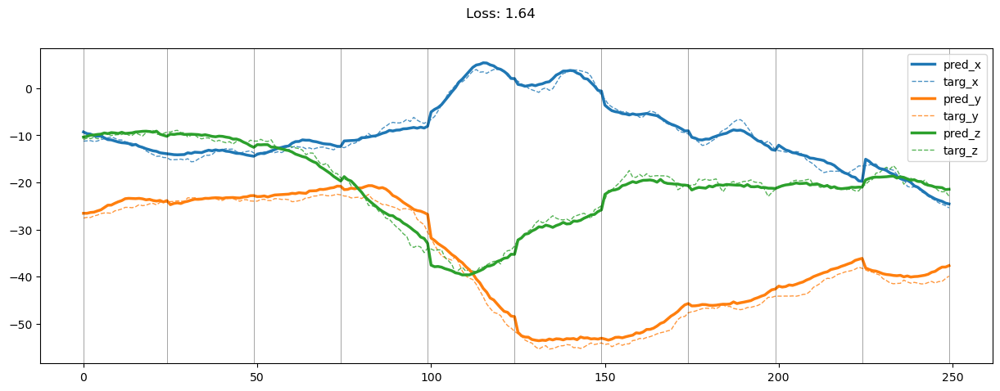

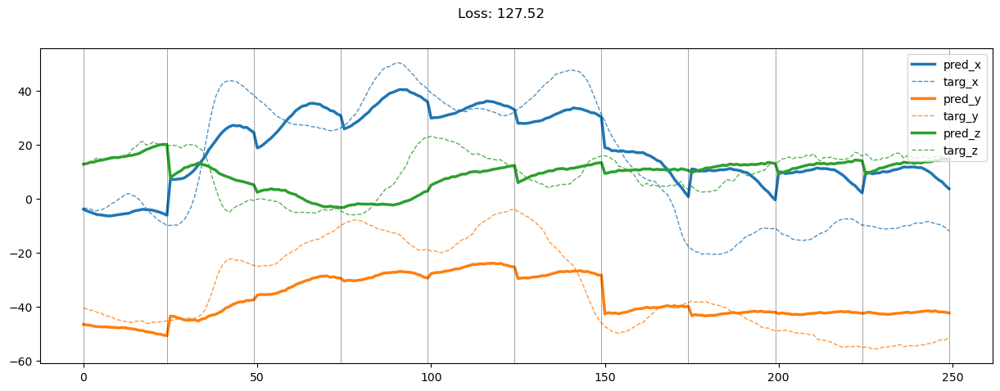

01049: train total loss:  1.811, pred loss:  1.811, valid total loss:  78.819, pred loss:  78.819


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01050: train total loss:  1.768, pred loss:  1.768, valid total loss:  80.193, pred loss:  80.193


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01051: train total loss:  1.803, pred loss:  1.803, valid total loss:  79.395, pred loss:  79.395


100%|██████████| 6/6 [00:00<00:00, 18.26it/s]


01052: train total loss:  1.775, pred loss:  1.775, valid total loss:  78.196, pred loss:  78.196


100%|██████████| 6/6 [00:00<00:00, 18.01it/s]


01053: train total loss:  1.811, pred loss:  1.811, valid total loss:  77.759, pred loss:  77.759


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01054: train total loss:  1.799, pred loss:  1.799, valid total loss:  79.835, pred loss:  79.835


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01055: train total loss:  1.778, pred loss:  1.778, valid total loss:  79.657, pred loss:  79.657


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01056: train total loss:  1.747, pred loss:  1.747, valid total loss:  78.833, pred loss:  78.833


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01057: train total loss:  1.788, pred loss:  1.788, valid total loss:  80.333, pred loss:  80.333


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01058: train total loss:  1.766, pred loss:  1.766, valid total loss:  78.736, pred loss:  78.736


100%|██████████| 6/6 [00:00<00:00, 18.09it/s]


01059: train total loss:  1.785, pred loss:  1.785, valid total loss:  79.237, pred loss:  79.237


100%|██████████| 6/6 [00:00<00:00, 17.56it/s]


01060: train total loss:  1.814, pred loss:  1.814, valid total loss:  79.227, pred loss:  79.227


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01061: train total loss:  1.808, pred loss:  1.808, valid total loss:  79.751, pred loss:  79.751


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01062: train total loss:  1.803, pred loss:  1.803, valid total loss:  77.932, pred loss:  77.932


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01063: train total loss:  1.763, pred loss:  1.763, valid total loss:  81.386, pred loss:  81.386


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


01064: train total loss:  1.795, pred loss:  1.795, valid total loss:  78.766, pred loss:  78.766


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


01065: train total loss:  1.788, pred loss:  1.788, valid total loss:  80.205, pred loss:  80.205


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01066: train total loss:  1.734, pred loss:  1.734, valid total loss:  81.414, pred loss:  81.414


100%|██████████| 6/6 [00:00<00:00, 20.18it/s]


01067: train total loss:  1.769, pred loss:  1.769, valid total loss:  80.038, pred loss:  80.038


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01068: train total loss:  1.771, pred loss:  1.771, valid total loss:  80.541, pred loss:  80.541


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01069: train total loss:  1.796, pred loss:  1.796, valid total loss:  77.060, pred loss:  77.060


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01070: train total loss:  1.806, pred loss:  1.806, valid total loss:  78.491, pred loss:  78.491


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01071: train total loss:  1.776, pred loss:  1.776, valid total loss:  79.767, pred loss:  79.767


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01072: train total loss:  1.783, pred loss:  1.783, valid total loss:  82.356, pred loss:  82.356


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01073: train total loss:  1.804, pred loss:  1.804, valid total loss:  80.219, pred loss:  80.219


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01074: train total loss:  1.785, pred loss:  1.785, valid total loss:  81.503, pred loss:  81.503


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01075: train total loss:  1.750, pred loss:  1.750, valid total loss:  81.852, pred loss:  81.852


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01076: train total loss:  1.734, pred loss:  1.734, valid total loss:  81.701, pred loss:  81.701


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01077: train total loss:  1.795, pred loss:  1.795, valid total loss:  80.577, pred loss:  80.577


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01078: train total loss:  1.713, pred loss:  1.713, valid total loss:  80.087, pred loss:  80.087


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01079: train total loss:  1.701, pred loss:  1.701, valid total loss:  82.077, pred loss:  82.077


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01080: train total loss:  1.712, pred loss:  1.712, valid total loss:  79.350, pred loss:  79.350


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01081: train total loss:  1.706, pred loss:  1.706, valid total loss:  82.323, pred loss:  82.323


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01082: train total loss:  1.741, pred loss:  1.741, valid total loss:  83.418, pred loss:  83.418


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01083: train total loss:  1.727, pred loss:  1.727, valid total loss:  81.520, pred loss:  81.520


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01084: train total loss:  1.716, pred loss:  1.716, valid total loss:  81.083, pred loss:  81.083


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01085: train total loss:  1.700, pred loss:  1.700, valid total loss:  83.714, pred loss:  83.714


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


01086: train total loss:  1.713, pred loss:  1.713, valid total loss:  83.416, pred loss:  83.416


100%|██████████| 6/6 [00:00<00:00, 19.30it/s]


01087: train total loss:  1.745, pred loss:  1.745, valid total loss:  81.953, pred loss:  81.953


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01088: train total loss:  1.814, pred loss:  1.814, valid total loss:  81.880, pred loss:  81.880


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01089: train total loss:  1.828, pred loss:  1.828, valid total loss:  80.418, pred loss:  80.418


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01090: train total loss:  1.848, pred loss:  1.848, valid total loss:  79.692, pred loss:  79.692


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01091: train total loss:  1.814, pred loss:  1.814, valid total loss:  80.572, pred loss:  80.572


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01092: train total loss:  1.774, pred loss:  1.774, valid total loss:  81.381, pred loss:  81.381


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01093: train total loss:  1.745, pred loss:  1.745, valid total loss:  80.859, pred loss:  80.859


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01094: train total loss:  1.700, pred loss:  1.700, valid total loss:  81.294, pred loss:  81.294


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01095: train total loss:  1.692, pred loss:  1.692, valid total loss:  81.677, pred loss:  81.677


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01096: train total loss:  1.722, pred loss:  1.722, valid total loss:  82.490, pred loss:  82.490


100%|██████████| 6/6 [00:00<00:00, 17.91it/s]


01097: train total loss:  1.718, pred loss:  1.718, valid total loss:  81.230, pred loss:  81.230


100%|██████████| 6/6 [00:00<00:00, 19.52it/s]


01098: train total loss:  1.754, pred loss:  1.754, valid total loss:  79.498, pred loss:  79.498


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


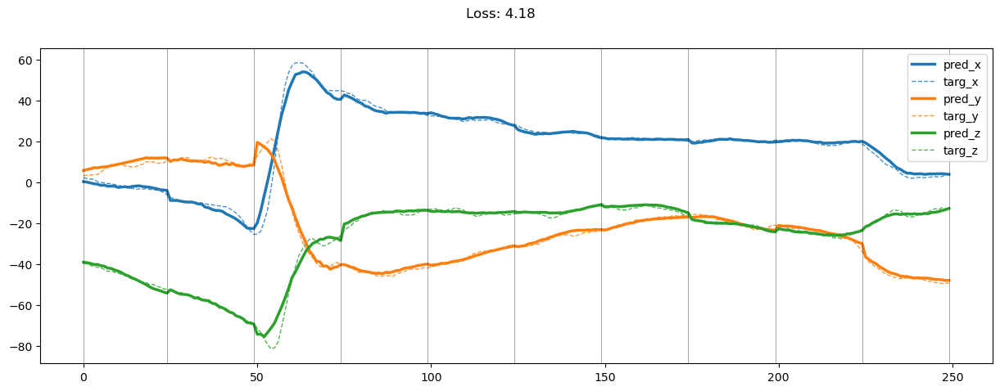

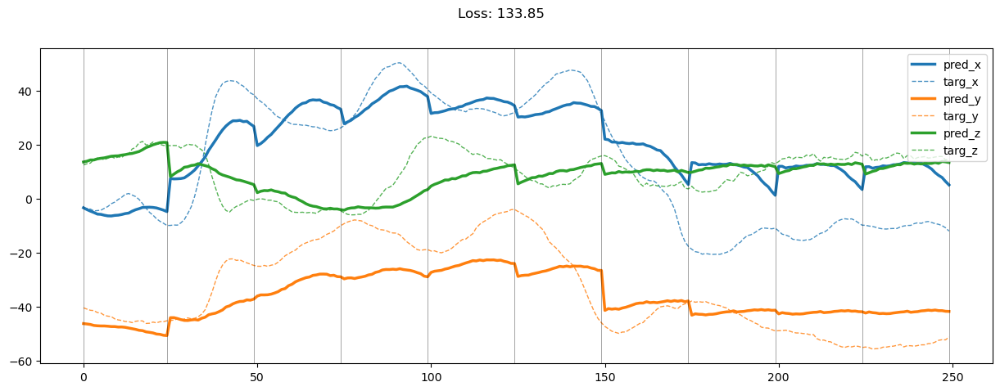

01099: train total loss:  1.838, pred loss:  1.838, valid total loss:  81.598, pred loss:  81.598


100%|██████████| 6/6 [00:00<00:00, 19.55it/s]


01100: train total loss:  1.758, pred loss:  1.758, valid total loss:  80.957, pred loss:  80.957


100%|██████████| 6/6 [00:00<00:00, 17.99it/s]


01101: train total loss:  1.804, pred loss:  1.804, valid total loss:  80.737, pred loss:  80.737


100%|██████████| 6/6 [00:00<00:00, 18.12it/s]


01102: train total loss:  1.773, pred loss:  1.773, valid total loss:  81.603, pred loss:  81.603


100%|██████████| 6/6 [00:00<00:00, 17.89it/s]


01103: train total loss:  1.717, pred loss:  1.717, valid total loss:  80.614, pred loss:  80.614


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01104: train total loss:  1.745, pred loss:  1.745, valid total loss:  80.246, pred loss:  80.246


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01105: train total loss:  1.728, pred loss:  1.728, valid total loss:  81.512, pred loss:  81.512


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01106: train total loss:  1.690, pred loss:  1.690, valid total loss:  80.456, pred loss:  80.456


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01107: train total loss:  1.689, pred loss:  1.689, valid total loss:  80.440, pred loss:  80.440


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01108: train total loss:  1.724, pred loss:  1.724, valid total loss:  81.183, pred loss:  81.183


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01109: train total loss:  1.670, pred loss:  1.670, valid total loss:  81.681, pred loss:  81.681


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01110: train total loss:  1.657, pred loss:  1.657, valid total loss:  78.682, pred loss:  78.682


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


01111: train total loss:  1.680, pred loss:  1.680, valid total loss:  78.680, pred loss:  78.680


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01112: train total loss:  1.710, pred loss:  1.710, valid total loss:  80.178, pred loss:  80.178


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01113: train total loss:  1.691, pred loss:  1.691, valid total loss:  79.974, pred loss:  79.974


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01114: train total loss:  1.732, pred loss:  1.732, valid total loss:  79.900, pred loss:  79.900


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01115: train total loss:  1.678, pred loss:  1.678, valid total loss:  79.416, pred loss:  79.416


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


01116: train total loss:  1.666, pred loss:  1.666, valid total loss:  79.835, pred loss:  79.835


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


01117: train total loss:  1.691, pred loss:  1.691, valid total loss:  79.635, pred loss:  79.635


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01118: train total loss:  1.700, pred loss:  1.700, valid total loss:  79.229, pred loss:  79.229


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01119: train total loss:  1.663, pred loss:  1.663, valid total loss:  81.347, pred loss:  81.347


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01120: train total loss:  1.635, pred loss:  1.635, valid total loss:  80.346, pred loss:  80.346


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01121: train total loss:  1.629, pred loss:  1.629, valid total loss:  80.723, pred loss:  80.723


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


01122: train total loss:  1.603, pred loss:  1.603, valid total loss:  80.821, pred loss:  80.821


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01123: train total loss:  1.655, pred loss:  1.655, valid total loss:  81.707, pred loss:  81.707


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01124: train total loss:  1.672, pred loss:  1.672, valid total loss:  82.147, pred loss:  82.147


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01125: train total loss:  1.656, pred loss:  1.656, valid total loss:  79.688, pred loss:  79.688


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01126: train total loss:  1.603, pred loss:  1.603, valid total loss:  81.268, pred loss:  81.268


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01127: train total loss:  1.584, pred loss:  1.584, valid total loss:  83.705, pred loss:  83.705


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01128: train total loss:  1.603, pred loss:  1.603, valid total loss:  81.245, pred loss:  81.245


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01129: train total loss:  1.597, pred loss:  1.597, valid total loss:  79.538, pred loss:  79.538


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01130: train total loss:  1.624, pred loss:  1.624, valid total loss:  80.804, pred loss:  80.804


100%|██████████| 6/6 [00:00<00:00, 19.62it/s]


01131: train total loss:  1.627, pred loss:  1.627, valid total loss:  79.475, pred loss:  79.475


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01132: train total loss:  1.633, pred loss:  1.633, valid total loss:  79.615, pred loss:  79.615


100%|██████████| 6/6 [00:00<00:00, 19.77it/s]


01133: train total loss:  1.631, pred loss:  1.631, valid total loss:  79.363, pred loss:  79.363


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01134: train total loss:  1.628, pred loss:  1.628, valid total loss:  81.413, pred loss:  81.413


100%|██████████| 6/6 [00:00<00:00, 17.90it/s]


01135: train total loss:  1.628, pred loss:  1.628, valid total loss:  81.440, pred loss:  81.440


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01136: train total loss:  1.709, pred loss:  1.709, valid total loss:  83.360, pred loss:  83.360


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


01137: train total loss:  1.742, pred loss:  1.742, valid total loss:  83.381, pred loss:  83.381


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01138: train total loss:  1.714, pred loss:  1.714, valid total loss:  83.902, pred loss:  83.902


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01139: train total loss:  1.763, pred loss:  1.763, valid total loss:  83.277, pred loss:  83.277


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01140: train total loss:  1.745, pred loss:  1.745, valid total loss:  82.046, pred loss:  82.046


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01141: train total loss:  1.725, pred loss:  1.725, valid total loss:  82.460, pred loss:  82.460


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01142: train total loss:  1.742, pred loss:  1.742, valid total loss:  82.598, pred loss:  82.598


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01143: train total loss:  1.735, pred loss:  1.735, valid total loss:  81.602, pred loss:  81.602


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01144: train total loss:  1.693, pred loss:  1.693, valid total loss:  80.917, pred loss:  80.917


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01145: train total loss:  1.663, pred loss:  1.663, valid total loss:  81.809, pred loss:  81.809


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01146: train total loss:  1.668, pred loss:  1.668, valid total loss:  84.455, pred loss:  84.455


100%|██████████| 6/6 [00:00<00:00, 20.02it/s]


01147: train total loss:  1.675, pred loss:  1.675, valid total loss:  85.128, pred loss:  85.128


100%|██████████| 6/6 [00:00<00:00, 19.64it/s]


01148: train total loss:  1.682, pred loss:  1.682, valid total loss:  84.525, pred loss:  84.525


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


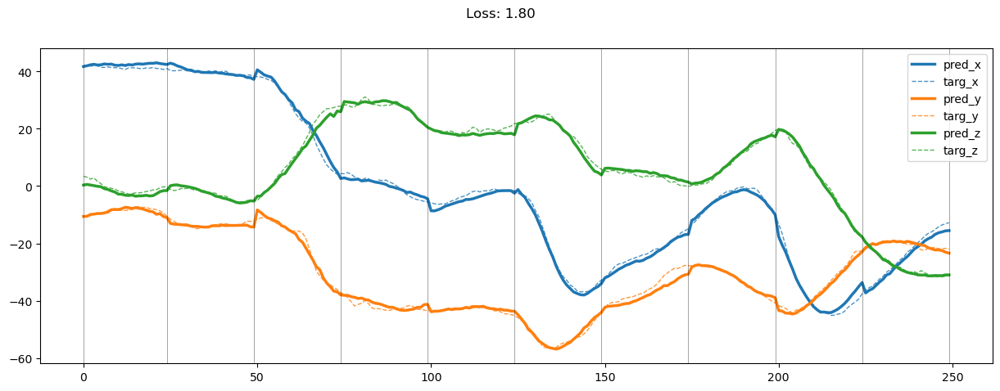

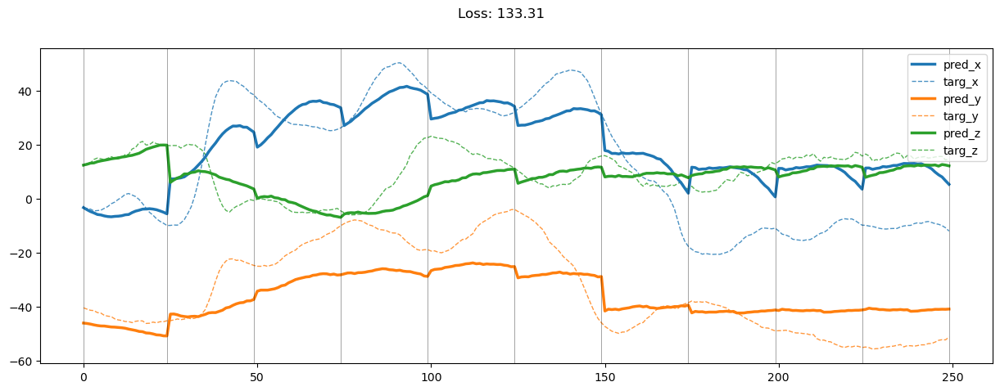

01149: train total loss:  1.735, pred loss:  1.735, valid total loss:  82.694, pred loss:  82.694


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01150: train total loss:  1.765, pred loss:  1.765, valid total loss:  80.567, pred loss:  80.567


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01151: train total loss:  1.728, pred loss:  1.728, valid total loss:  81.492, pred loss:  81.492


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01152: train total loss:  1.658, pred loss:  1.658, valid total loss:  80.302, pred loss:  80.302


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01153: train total loss:  1.641, pred loss:  1.641, valid total loss:  82.245, pred loss:  82.245


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01154: train total loss:  1.598, pred loss:  1.598, valid total loss:  81.463, pred loss:  81.463


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01155: train total loss:  1.588, pred loss:  1.588, valid total loss:  84.157, pred loss:  84.157


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


01156: train total loss:  1.645, pred loss:  1.645, valid total loss:  85.877, pred loss:  85.877


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01157: train total loss:  1.691, pred loss:  1.691, valid total loss:  85.250, pred loss:  85.250


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


01158: train total loss:  1.687, pred loss:  1.687, valid total loss:  83.069, pred loss:  83.069


100%|██████████| 6/6 [00:00<00:00, 17.95it/s]


01159: train total loss:  1.633, pred loss:  1.633, valid total loss:  83.759, pred loss:  83.759


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01160: train total loss:  1.644, pred loss:  1.644, valid total loss:  84.822, pred loss:  84.822


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01161: train total loss:  1.669, pred loss:  1.669, valid total loss:  82.570, pred loss:  82.570


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01162: train total loss:  1.696, pred loss:  1.696, valid total loss:  82.439, pred loss:  82.439


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


01163: train total loss:  1.696, pred loss:  1.696, valid total loss:  83.008, pred loss:  83.008


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01164: train total loss:  1.656, pred loss:  1.656, valid total loss:  80.601, pred loss:  80.601


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01165: train total loss:  1.632, pred loss:  1.632, valid total loss:  83.836, pred loss:  83.836


100%|██████████| 6/6 [00:00<00:00, 18.35it/s]


01166: train total loss:  1.622, pred loss:  1.622, valid total loss:  85.127, pred loss:  85.127


100%|██████████| 6/6 [00:00<00:00, 19.17it/s]


01167: train total loss:  1.631, pred loss:  1.631, valid total loss:  84.597, pred loss:  84.597


100%|██████████| 6/6 [00:00<00:00, 18.15it/s]


01168: train total loss:  1.574, pred loss:  1.574, valid total loss:  82.377, pred loss:  82.377


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01169: train total loss:  1.639, pred loss:  1.639, valid total loss:  81.094, pred loss:  81.094


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01170: train total loss:  1.577, pred loss:  1.577, valid total loss:  81.791, pred loss:  81.791


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01171: train total loss:  1.595, pred loss:  1.595, valid total loss:  85.404, pred loss:  85.404


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


01172: train total loss:  1.580, pred loss:  1.580, valid total loss:  81.408, pred loss:  81.408


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01173: train total loss:  1.567, pred loss:  1.567, valid total loss:  84.278, pred loss:  84.278


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01174: train total loss:  1.658, pred loss:  1.658, valid total loss:  83.509, pred loss:  83.509


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01175: train total loss:  1.609, pred loss:  1.609, valid total loss:  81.992, pred loss:  81.992


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01176: train total loss:  1.651, pred loss:  1.651, valid total loss:  83.019, pred loss:  83.019


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01177: train total loss:  1.586, pred loss:  1.586, valid total loss:  81.736, pred loss:  81.736


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01178: train total loss:  1.586, pred loss:  1.586, valid total loss:  81.821, pred loss:  81.821


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01179: train total loss:  1.590, pred loss:  1.590, valid total loss:  81.550, pred loss:  81.550


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01180: train total loss:  1.599, pred loss:  1.599, valid total loss:  82.244, pred loss:  82.244


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01181: train total loss:  1.573, pred loss:  1.573, valid total loss:  85.048, pred loss:  85.048


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01182: train total loss:  1.585, pred loss:  1.585, valid total loss:  81.675, pred loss:  81.675


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01183: train total loss:  1.614, pred loss:  1.614, valid total loss:  82.472, pred loss:  82.472


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01184: train total loss:  1.566, pred loss:  1.566, valid total loss:  82.516, pred loss:  82.516


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01185: train total loss:  1.578, pred loss:  1.578, valid total loss:  82.092, pred loss:  82.092


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01186: train total loss:  1.572, pred loss:  1.572, valid total loss:  81.288, pred loss:  81.288


100%|██████████| 6/6 [00:00<00:00, 19.67it/s]


01187: train total loss:  1.515, pred loss:  1.515, valid total loss:  80.968, pred loss:  80.968


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01188: train total loss:  1.552, pred loss:  1.552, valid total loss:  80.014, pred loss:  80.014


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01189: train total loss:  1.547, pred loss:  1.547, valid total loss:  80.378, pred loss:  80.378


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01190: train total loss:  1.590, pred loss:  1.590, valid total loss:  78.523, pred loss:  78.523


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01191: train total loss:  1.632, pred loss:  1.632, valid total loss:  79.019, pred loss:  79.019


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01192: train total loss:  1.666, pred loss:  1.666, valid total loss:  79.553, pred loss:  79.553


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01193: train total loss:  1.602, pred loss:  1.602, valid total loss:  80.745, pred loss:  80.745


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01194: train total loss:  1.581, pred loss:  1.581, valid total loss:  81.946, pred loss:  81.946


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01195: train total loss:  1.536, pred loss:  1.536, valid total loss:  79.987, pred loss:  79.987


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01196: train total loss:  1.516, pred loss:  1.516, valid total loss:  81.820, pred loss:  81.820


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01197: train total loss:  1.583, pred loss:  1.583, valid total loss:  81.366, pred loss:  81.366


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01198: train total loss:  1.585, pred loss:  1.585, valid total loss:  84.042, pred loss:  84.042


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


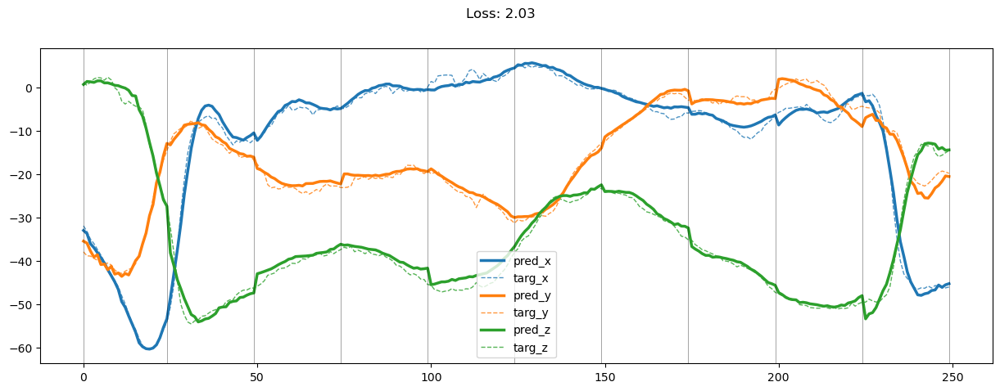

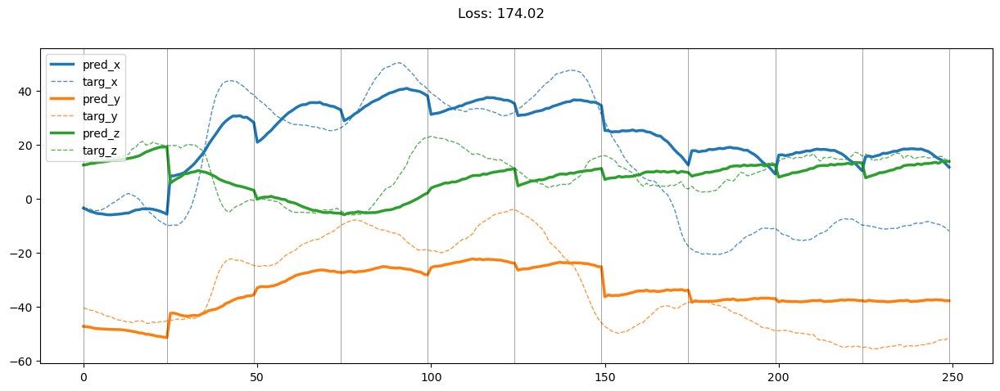

01199: train total loss:  1.611, pred loss:  1.611, valid total loss:  85.254, pred loss:  85.254


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01200: train total loss:  1.580, pred loss:  1.580, valid total loss:  85.489, pred loss:  85.489


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01201: train total loss:  1.587, pred loss:  1.587, valid total loss:  81.805, pred loss:  81.805


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01202: train total loss:  1.609, pred loss:  1.609, valid total loss:  82.064, pred loss:  82.064


100%|██████████| 6/6 [00:00<00:00, 17.82it/s]


01203: train total loss:  1.613, pred loss:  1.613, valid total loss:  80.850, pred loss:  80.850


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01204: train total loss:  1.623, pred loss:  1.623, valid total loss:  82.998, pred loss:  82.998


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01205: train total loss:  1.615, pred loss:  1.615, valid total loss:  82.706, pred loss:  82.706


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01206: train total loss:  1.577, pred loss:  1.577, valid total loss:  83.399, pred loss:  83.399


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01207: train total loss:  1.599, pred loss:  1.599, valid total loss:  81.265, pred loss:  81.265


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01208: train total loss:  1.589, pred loss:  1.589, valid total loss:  82.876, pred loss:  82.876


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01209: train total loss:  1.611, pred loss:  1.611, valid total loss:  83.104, pred loss:  83.104


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01210: train total loss:  1.538, pred loss:  1.538, valid total loss:  85.512, pred loss:  85.512


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01211: train total loss:  1.583, pred loss:  1.583, valid total loss:  85.107, pred loss:  85.107


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01212: train total loss:  1.601, pred loss:  1.601, valid total loss:  82.819, pred loss:  82.819


100%|██████████| 6/6 [00:00<00:00, 19.17it/s]


01213: train total loss:  1.572, pred loss:  1.572, valid total loss:  84.628, pred loss:  84.628


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


01214: train total loss:  1.566, pred loss:  1.566, valid total loss:  84.011, pred loss:  84.011


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01215: train total loss:  1.530, pred loss:  1.530, valid total loss:  84.527, pred loss:  84.527


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01216: train total loss:  1.565, pred loss:  1.565, valid total loss:  86.076, pred loss:  86.076


100%|██████████| 6/6 [00:00<00:00, 19.07it/s]


01217: train total loss:  1.530, pred loss:  1.530, valid total loss:  82.779, pred loss:  82.779


100%|██████████| 6/6 [00:00<00:00, 20.08it/s]


01218: train total loss:  1.521, pred loss:  1.521, valid total loss:  81.222, pred loss:  81.222


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01219: train total loss:  1.506, pred loss:  1.506, valid total loss:  84.603, pred loss:  84.603


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01220: train total loss:  1.522, pred loss:  1.522, valid total loss:  84.047, pred loss:  84.047


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01221: train total loss:  1.557, pred loss:  1.557, valid total loss:  82.763, pred loss:  82.763


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01222: train total loss:  1.557, pred loss:  1.557, valid total loss:  81.675, pred loss:  81.675


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01223: train total loss:  1.485, pred loss:  1.485, valid total loss:  81.507, pred loss:  81.507


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01224: train total loss:  1.555, pred loss:  1.555, valid total loss:  82.113, pred loss:  82.113


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01225: train total loss:  1.495, pred loss:  1.495, valid total loss:  84.248, pred loss:  84.248


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


01226: train total loss:  1.537, pred loss:  1.537, valid total loss:  84.218, pred loss:  84.218


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01227: train total loss:  1.545, pred loss:  1.545, valid total loss:  83.742, pred loss:  83.742


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01228: train total loss:  1.463, pred loss:  1.463, valid total loss:  82.029, pred loss:  82.029


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01229: train total loss:  1.524, pred loss:  1.524, valid total loss:  81.636, pred loss:  81.636


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01230: train total loss:  1.555, pred loss:  1.555, valid total loss:  83.235, pred loss:  83.235


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01231: train total loss:  1.525, pred loss:  1.525, valid total loss:  82.741, pred loss:  82.741


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01232: train total loss:  1.587, pred loss:  1.587, valid total loss:  80.678, pred loss:  80.678


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01233: train total loss:  1.573, pred loss:  1.573, valid total loss:  81.261, pred loss:  81.261


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01234: train total loss:  1.567, pred loss:  1.567, valid total loss:  80.286, pred loss:  80.286


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01235: train total loss:  1.528, pred loss:  1.528, valid total loss:  83.530, pred loss:  83.530


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


01236: train total loss:  1.590, pred loss:  1.590, valid total loss:  86.427, pred loss:  86.427


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01237: train total loss:  1.644, pred loss:  1.644, valid total loss:  85.276, pred loss:  85.276


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01238: train total loss:  1.689, pred loss:  1.689, valid total loss:  85.647, pred loss:  85.647


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01239: train total loss:  1.731, pred loss:  1.731, valid total loss:  87.716, pred loss:  87.716


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01240: train total loss:  1.687, pred loss:  1.687, valid total loss:  86.942, pred loss:  86.942


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01241: train total loss:  1.656, pred loss:  1.656, valid total loss:  85.241, pred loss:  85.241


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01242: train total loss:  1.584, pred loss:  1.584, valid total loss:  87.637, pred loss:  87.637


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01243: train total loss:  1.556, pred loss:  1.556, valid total loss:  86.258, pred loss:  86.258


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01244: train total loss:  1.516, pred loss:  1.516, valid total loss:  85.152, pred loss:  85.152


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01245: train total loss:  1.526, pred loss:  1.526, valid total loss:  83.231, pred loss:  83.231


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01246: train total loss:  1.545, pred loss:  1.545, valid total loss:  84.774, pred loss:  84.774


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01247: train total loss:  1.534, pred loss:  1.534, valid total loss:  85.123, pred loss:  85.123


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01248: train total loss:  1.528, pred loss:  1.528, valid total loss:  87.275, pred loss:  87.275


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


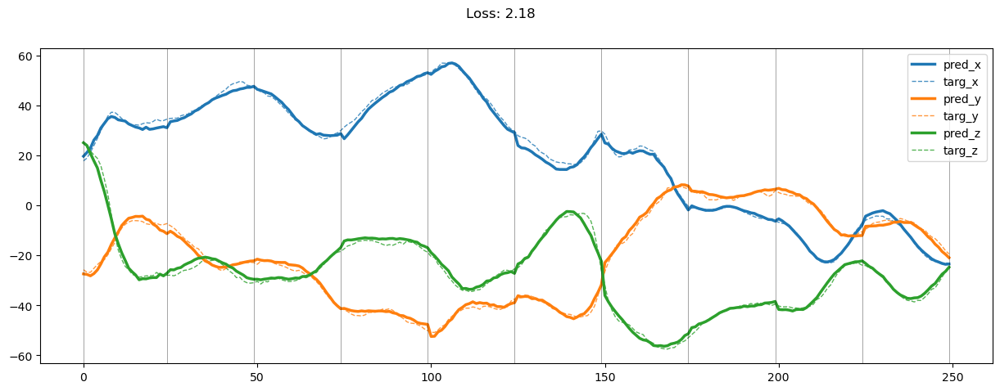

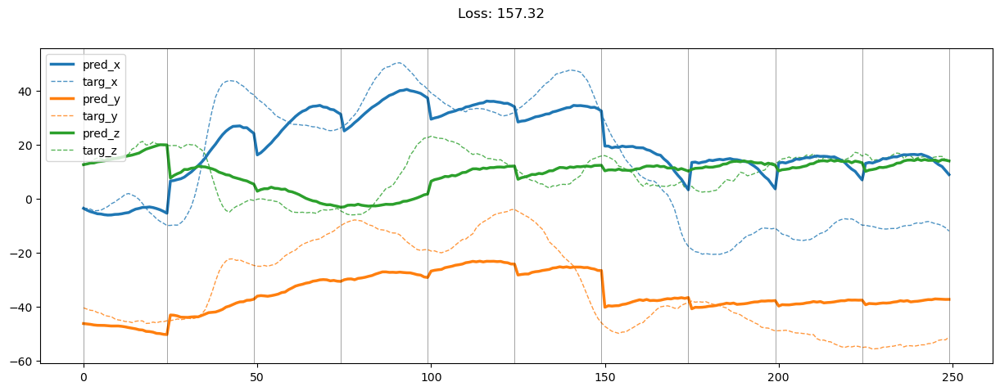

01249: train total loss:  1.523, pred loss:  1.523, valid total loss:  86.267, pred loss:  86.267


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01250: train total loss:  1.514, pred loss:  1.514, valid total loss:  87.993, pred loss:  87.993


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01251: train total loss:  1.432, pred loss:  1.432, valid total loss:  86.907, pred loss:  86.907


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


01252: train total loss:  1.511, pred loss:  1.511, valid total loss:  86.741, pred loss:  86.741


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01253: train total loss:  1.454, pred loss:  1.454, valid total loss:  83.957, pred loss:  83.957


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01254: train total loss:  1.445, pred loss:  1.445, valid total loss:  81.967, pred loss:  81.967


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01255: train total loss:  1.424, pred loss:  1.424, valid total loss:  84.114, pred loss:  84.114


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01256: train total loss:  1.485, pred loss:  1.485, valid total loss:  85.232, pred loss:  85.232


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01257: train total loss:  1.435, pred loss:  1.435, valid total loss:  85.132, pred loss:  85.132


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01258: train total loss:  1.465, pred loss:  1.465, valid total loss:  84.601, pred loss:  84.601


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01259: train total loss:  1.480, pred loss:  1.480, valid total loss:  87.094, pred loss:  87.094


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01260: train total loss:  1.454, pred loss:  1.454, valid total loss:  88.195, pred loss:  88.195


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01261: train total loss:  1.553, pred loss:  1.553, valid total loss:  84.821, pred loss:  84.821


100%|██████████| 6/6 [00:00<00:00, 19.88it/s]


01262: train total loss:  1.564, pred loss:  1.564, valid total loss:  84.140, pred loss:  84.140


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01263: train total loss:  1.549, pred loss:  1.549, valid total loss:  82.134, pred loss:  82.134


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01264: train total loss:  1.484, pred loss:  1.484, valid total loss:  84.062, pred loss:  84.062


100%|██████████| 6/6 [00:00<00:00, 19.59it/s]


01265: train total loss:  1.402, pred loss:  1.402, valid total loss:  86.089, pred loss:  86.089


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01266: train total loss:  1.455, pred loss:  1.455, valid total loss:  85.148, pred loss:  85.148


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01267: train total loss:  1.477, pred loss:  1.477, valid total loss:  85.681, pred loss:  85.681


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01268: train total loss:  1.523, pred loss:  1.523, valid total loss:  82.444, pred loss:  82.444


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01269: train total loss:  1.474, pred loss:  1.474, valid total loss:  83.079, pred loss:  83.079


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


01270: train total loss:  1.468, pred loss:  1.468, valid total loss:  81.575, pred loss:  81.575


100%|██████████| 6/6 [00:00<00:00, 19.06it/s]


01271: train total loss:  1.406, pred loss:  1.406, valid total loss:  82.466, pred loss:  82.466


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01272: train total loss:  1.378, pred loss:  1.378, valid total loss:  83.505, pred loss:  83.505


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01273: train total loss:  1.352, pred loss:  1.352, valid total loss:  81.821, pred loss:  81.821


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01274: train total loss:  1.361, pred loss:  1.361, valid total loss:  83.305, pred loss:  83.305


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01275: train total loss:  1.370, pred loss:  1.370, valid total loss:  87.554, pred loss:  87.554


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01276: train total loss:  1.405, pred loss:  1.405, valid total loss:  86.013, pred loss:  86.013


100%|██████████| 6/6 [00:00<00:00, 19.52it/s]


01277: train total loss:  1.388, pred loss:  1.388, valid total loss:  83.916, pred loss:  83.916


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01278: train total loss:  1.421, pred loss:  1.421, valid total loss:  84.607, pred loss:  84.607


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01279: train total loss:  1.388, pred loss:  1.388, valid total loss:  82.735, pred loss:  82.735


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01280: train total loss:  1.404, pred loss:  1.404, valid total loss:  82.773, pred loss:  82.773


100%|██████████| 6/6 [00:00<00:00, 19.70it/s]


01281: train total loss:  1.425, pred loss:  1.425, valid total loss:  83.083, pred loss:  83.083


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01282: train total loss:  1.501, pred loss:  1.501, valid total loss:  83.175, pred loss:  83.175


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01283: train total loss:  1.459, pred loss:  1.459, valid total loss:  82.339, pred loss:  82.339


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01284: train total loss:  1.487, pred loss:  1.487, valid total loss:  82.769, pred loss:  82.769


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01285: train total loss:  1.458, pred loss:  1.458, valid total loss:  82.672, pred loss:  82.672


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01286: train total loss:  1.502, pred loss:  1.502, valid total loss:  81.538, pred loss:  81.538


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


01287: train total loss:  1.447, pred loss:  1.447, valid total loss:  84.495, pred loss:  84.495


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01288: train total loss:  1.460, pred loss:  1.460, valid total loss:  87.239, pred loss:  87.239


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01289: train total loss:  1.459, pred loss:  1.459, valid total loss:  83.569, pred loss:  83.569


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01290: train total loss:  1.433, pred loss:  1.433, valid total loss:  83.325, pred loss:  83.325


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01291: train total loss:  1.456, pred loss:  1.456, valid total loss:  85.371, pred loss:  85.371


100%|██████████| 6/6 [00:00<00:00, 19.25it/s]


01292: train total loss:  1.474, pred loss:  1.474, valid total loss:  85.318, pred loss:  85.318


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01293: train total loss:  1.510, pred loss:  1.510, valid total loss:  86.196, pred loss:  86.196


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01294: train total loss:  1.449, pred loss:  1.449, valid total loss:  87.498, pred loss:  87.498


100%|██████████| 6/6 [00:00<00:00, 19.50it/s]


01295: train total loss:  1.387, pred loss:  1.387, valid total loss:  86.160, pred loss:  86.160


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01296: train total loss:  1.392, pred loss:  1.392, valid total loss:  86.264, pred loss:  86.264


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01297: train total loss:  1.413, pred loss:  1.413, valid total loss:  84.659, pred loss:  84.659


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01298: train total loss:  1.439, pred loss:  1.439, valid total loss:  83.077, pred loss:  83.077


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


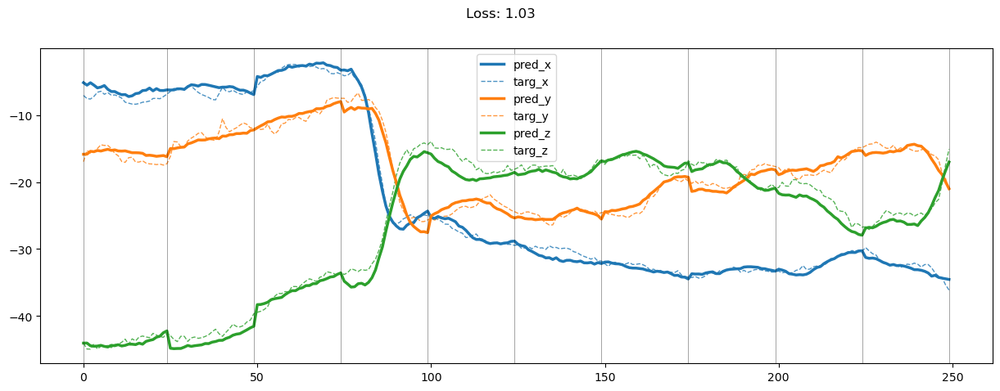

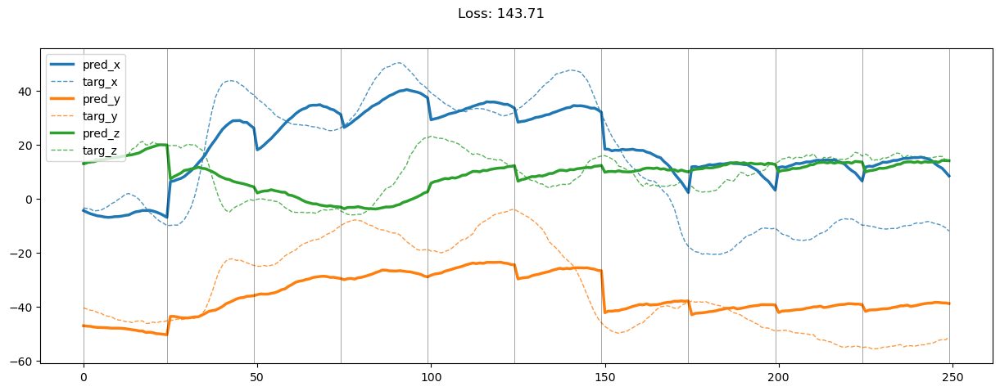

01299: train total loss:  1.416, pred loss:  1.416, valid total loss:  83.437, pred loss:  83.437


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01300: train total loss:  1.421, pred loss:  1.421, valid total loss:  86.952, pred loss:  86.952


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01301: train total loss:  1.428, pred loss:  1.428, valid total loss:  84.767, pred loss:  84.767


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01302: train total loss:  1.429, pred loss:  1.429, valid total loss:  83.923, pred loss:  83.923


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01303: train total loss:  1.452, pred loss:  1.452, valid total loss:  80.947, pred loss:  80.947


100%|██████████| 6/6 [00:00<00:00, 19.73it/s]


01304: train total loss:  1.452, pred loss:  1.452, valid total loss:  79.147, pred loss:  79.147


100%|██████████| 6/6 [00:00<00:00, 17.76it/s]


01305: train total loss:  1.495, pred loss:  1.495, valid total loss:  80.703, pred loss:  80.703


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01306: train total loss:  1.488, pred loss:  1.488, valid total loss:  83.128, pred loss:  83.128


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01307: train total loss:  1.546, pred loss:  1.546, valid total loss:  83.021, pred loss:  83.021


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01308: train total loss:  1.436, pred loss:  1.436, valid total loss:  84.119, pred loss:  84.119


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01309: train total loss:  1.420, pred loss:  1.420, valid total loss:  84.233, pred loss:  84.233


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01310: train total loss:  1.409, pred loss:  1.409, valid total loss:  83.558, pred loss:  83.558


100%|██████████| 6/6 [00:00<00:00, 18.72it/s]


01311: train total loss:  1.438, pred loss:  1.438, valid total loss:  81.697, pred loss:  81.697


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01312: train total loss:  1.416, pred loss:  1.416, valid total loss:  82.183, pred loss:  82.183


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01313: train total loss:  1.406, pred loss:  1.406, valid total loss:  81.460, pred loss:  81.460


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01314: train total loss:  1.396, pred loss:  1.396, valid total loss:  84.270, pred loss:  84.270


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


01315: train total loss:  1.410, pred loss:  1.410, valid total loss:  85.391, pred loss:  85.391


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01316: train total loss:  1.443, pred loss:  1.443, valid total loss:  82.522, pred loss:  82.522


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01317: train total loss:  1.384, pred loss:  1.384, valid total loss:  82.509, pred loss:  82.509


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01318: train total loss:  1.399, pred loss:  1.399, valid total loss:  84.289, pred loss:  84.289


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01319: train total loss:  1.409, pred loss:  1.409, valid total loss:  84.401, pred loss:  84.401


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01320: train total loss:  1.380, pred loss:  1.380, valid total loss:  88.050, pred loss:  88.050


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01321: train total loss:  1.416, pred loss:  1.416, valid total loss:  87.987, pred loss:  87.987


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01322: train total loss:  1.440, pred loss:  1.440, valid total loss:  90.390, pred loss:  90.390


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01323: train total loss:  1.471, pred loss:  1.471, valid total loss:  85.601, pred loss:  85.601


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01324: train total loss:  1.421, pred loss:  1.421, valid total loss:  90.330, pred loss:  90.330


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01325: train total loss:  1.480, pred loss:  1.480, valid total loss:  87.581, pred loss:  87.581


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01326: train total loss:  1.494, pred loss:  1.494, valid total loss:  81.987, pred loss:  81.987


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01327: train total loss:  1.508, pred loss:  1.508, valid total loss:  81.746, pred loss:  81.746


100%|██████████| 6/6 [00:00<00:00, 19.76it/s]


01328: train total loss:  1.554, pred loss:  1.554, valid total loss:  84.958, pred loss:  84.958


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01329: train total loss:  1.671, pred loss:  1.671, valid total loss:  83.828, pred loss:  83.828


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01330: train total loss:  1.581, pred loss:  1.581, valid total loss:  85.240, pred loss:  85.240


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


01331: train total loss:  1.583, pred loss:  1.583, valid total loss:  85.388, pred loss:  85.388


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01332: train total loss:  1.513, pred loss:  1.513, valid total loss:  88.458, pred loss:  88.458


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01333: train total loss:  1.470, pred loss:  1.470, valid total loss:  85.395, pred loss:  85.395


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01334: train total loss:  1.460, pred loss:  1.460, valid total loss:  87.638, pred loss:  87.638


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01335: train total loss:  1.424, pred loss:  1.424, valid total loss:  84.488, pred loss:  84.488


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


01336: train total loss:  1.380, pred loss:  1.380, valid total loss:  83.230, pred loss:  83.230


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01337: train total loss:  1.372, pred loss:  1.372, valid total loss:  82.459, pred loss:  82.459


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01338: train total loss:  1.321, pred loss:  1.321, valid total loss:  87.323, pred loss:  87.323


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01339: train total loss:  1.331, pred loss:  1.331, valid total loss:  91.456, pred loss:  91.456


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01340: train total loss:  1.303, pred loss:  1.303, valid total loss:  91.982, pred loss:  91.982


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01341: train total loss:  1.377, pred loss:  1.377, valid total loss:  90.169, pred loss:  90.169


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01342: train total loss:  1.396, pred loss:  1.396, valid total loss:  87.808, pred loss:  87.808


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01343: train total loss:  1.421, pred loss:  1.421, valid total loss:  85.111, pred loss:  85.111


100%|██████████| 6/6 [00:00<00:00, 19.92it/s]


01344: train total loss:  1.382, pred loss:  1.382, valid total loss:  84.289, pred loss:  84.289


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01345: train total loss:  1.377, pred loss:  1.377, valid total loss:  81.261, pred loss:  81.261


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01346: train total loss:  1.364, pred loss:  1.364, valid total loss:  81.019, pred loss:  81.019


100%|██████████| 6/6 [00:00<00:00, 19.69it/s]


01347: train total loss:  1.417, pred loss:  1.417, valid total loss:  81.434, pred loss:  81.434


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01348: train total loss:  1.445, pred loss:  1.445, valid total loss:  85.460, pred loss:  85.460


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


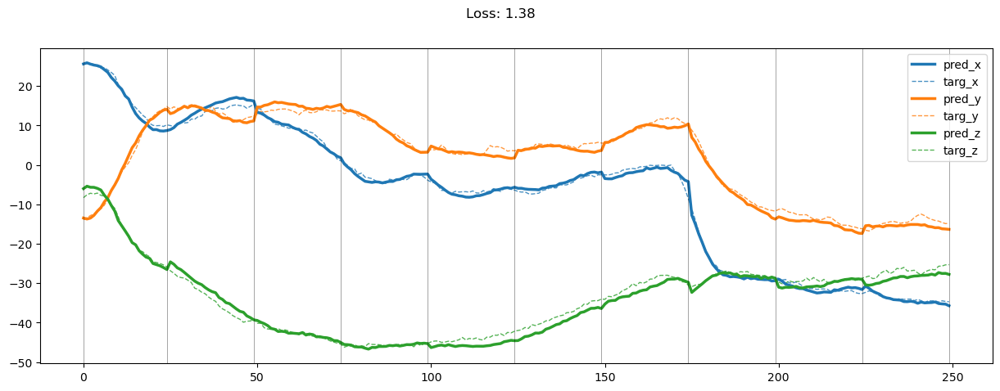

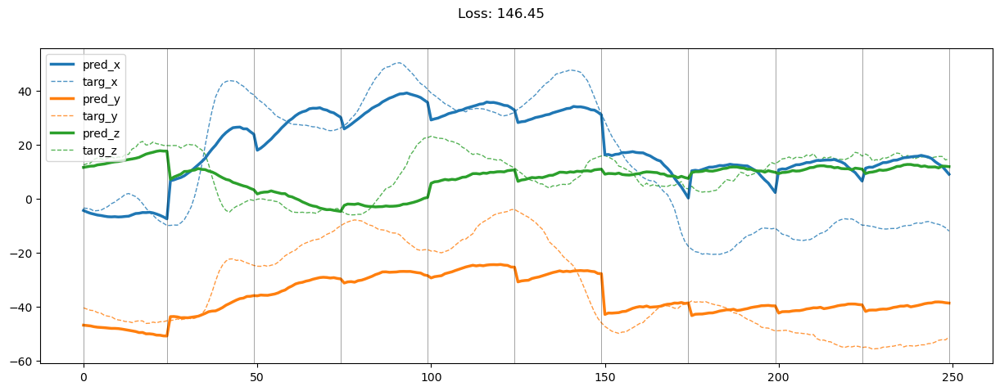

01349: train total loss:  1.473, pred loss:  1.473, valid total loss:  86.644, pred loss:  86.644


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01350: train total loss:  1.423, pred loss:  1.423, valid total loss:  86.372, pred loss:  86.372


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01351: train total loss:  1.373, pred loss:  1.373, valid total loss:  86.792, pred loss:  86.792


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01352: train total loss:  1.320, pred loss:  1.320, valid total loss:  86.750, pred loss:  86.750


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01353: train total loss:  1.302, pred loss:  1.302, valid total loss:  86.726, pred loss:  86.726


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01354: train total loss:  1.324, pred loss:  1.324, valid total loss:  89.103, pred loss:  89.103


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01355: train total loss:  1.328, pred loss:  1.328, valid total loss:  86.889, pred loss:  86.889


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01356: train total loss:  1.371, pred loss:  1.371, valid total loss:  84.123, pred loss:  84.123


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01357: train total loss:  1.327, pred loss:  1.327, valid total loss:  84.498, pred loss:  84.498


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01358: train total loss:  1.387, pred loss:  1.387, valid total loss:  87.032, pred loss:  87.032


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01359: train total loss:  1.397, pred loss:  1.397, valid total loss:  85.198, pred loss:  85.198


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01360: train total loss:  1.390, pred loss:  1.390, valid total loss:  83.800, pred loss:  83.800


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01361: train total loss:  1.351, pred loss:  1.351, valid total loss:  86.840, pred loss:  86.840


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01362: train total loss:  1.393, pred loss:  1.393, valid total loss:  87.047, pred loss:  87.047


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01363: train total loss:  1.393, pred loss:  1.393, valid total loss:  84.335, pred loss:  84.335


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01364: train total loss:  1.374, pred loss:  1.374, valid total loss:  84.335, pred loss:  84.335


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01365: train total loss:  1.388, pred loss:  1.388, valid total loss:  86.178, pred loss:  86.178


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01366: train total loss:  1.363, pred loss:  1.363, valid total loss:  86.171, pred loss:  86.171


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


01367: train total loss:  1.403, pred loss:  1.403, valid total loss:  82.102, pred loss:  82.102


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01368: train total loss:  1.390, pred loss:  1.390, valid total loss:  83.517, pred loss:  83.517


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01369: train total loss:  1.411, pred loss:  1.411, valid total loss:  88.162, pred loss:  88.162


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01370: train total loss:  1.356, pred loss:  1.356, valid total loss:  86.513, pred loss:  86.513


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01371: train total loss:  1.363, pred loss:  1.363, valid total loss:  87.983, pred loss:  87.983


100%|██████████| 6/6 [00:00<00:00, 20.08it/s]


01372: train total loss:  1.335, pred loss:  1.335, valid total loss:  91.521, pred loss:  91.521


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01373: train total loss:  1.320, pred loss:  1.320, valid total loss:  89.901, pred loss:  89.901


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01374: train total loss:  1.307, pred loss:  1.307, valid total loss:  88.305, pred loss:  88.305


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01375: train total loss:  1.365, pred loss:  1.365, valid total loss:  82.761, pred loss:  82.761


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01376: train total loss:  1.345, pred loss:  1.345, valid total loss:  84.963, pred loss:  84.963


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01377: train total loss:  1.331, pred loss:  1.331, valid total loss:  85.716, pred loss:  85.716


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01378: train total loss:  1.327, pred loss:  1.327, valid total loss:  84.816, pred loss:  84.816


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01379: train total loss:  1.320, pred loss:  1.320, valid total loss:  83.996, pred loss:  83.996


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01380: train total loss:  1.336, pred loss:  1.336, valid total loss:  86.415, pred loss:  86.415


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01381: train total loss:  1.271, pred loss:  1.271, valid total loss:  85.722, pred loss:  85.722


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01382: train total loss:  1.267, pred loss:  1.267, valid total loss:  82.982, pred loss:  82.982


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01383: train total loss:  1.274, pred loss:  1.274, valid total loss:  82.929, pred loss:  82.929


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


01384: train total loss:  1.347, pred loss:  1.347, valid total loss:  85.870, pred loss:  85.870


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01385: train total loss:  1.378, pred loss:  1.378, valid total loss:  86.221, pred loss:  86.221


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01386: train total loss:  1.283, pred loss:  1.283, valid total loss:  89.056, pred loss:  89.056


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01387: train total loss:  1.262, pred loss:  1.262, valid total loss:  85.522, pred loss:  85.522


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01388: train total loss:  1.323, pred loss:  1.323, valid total loss:  83.803, pred loss:  83.803


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01389: train total loss:  1.416, pred loss:  1.416, valid total loss:  83.761, pred loss:  83.761


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01390: train total loss:  1.423, pred loss:  1.423, valid total loss:  86.240, pred loss:  86.240


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01391: train total loss:  1.461, pred loss:  1.461, valid total loss:  86.866, pred loss:  86.866


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01392: train total loss:  1.505, pred loss:  1.505, valid total loss:  87.297, pred loss:  87.297


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01393: train total loss:  1.480, pred loss:  1.480, valid total loss:  84.661, pred loss:  84.661


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01394: train total loss:  1.390, pred loss:  1.390, valid total loss:  89.610, pred loss:  89.610


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01395: train total loss:  1.348, pred loss:  1.348, valid total loss:  91.090, pred loss:  91.090


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


01396: train total loss:  1.366, pred loss:  1.366, valid total loss:  91.012, pred loss:  91.012


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01397: train total loss:  1.369, pred loss:  1.369, valid total loss:  87.896, pred loss:  87.896


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01398: train total loss:  1.332, pred loss:  1.332, valid total loss:  84.835, pred loss:  84.835


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


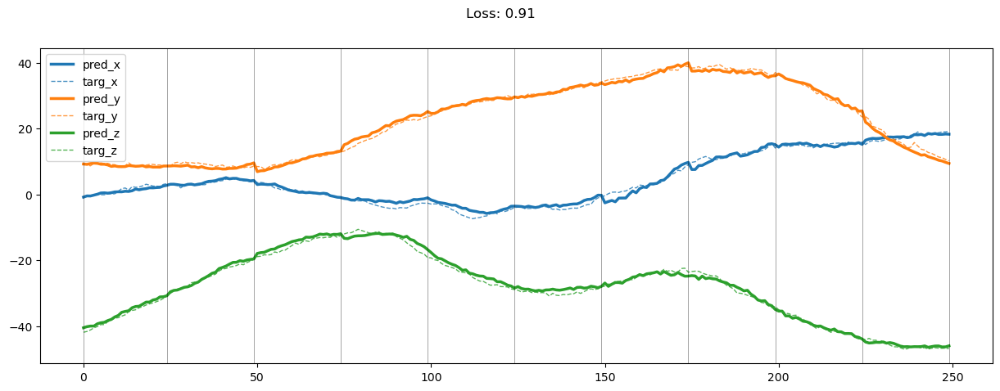

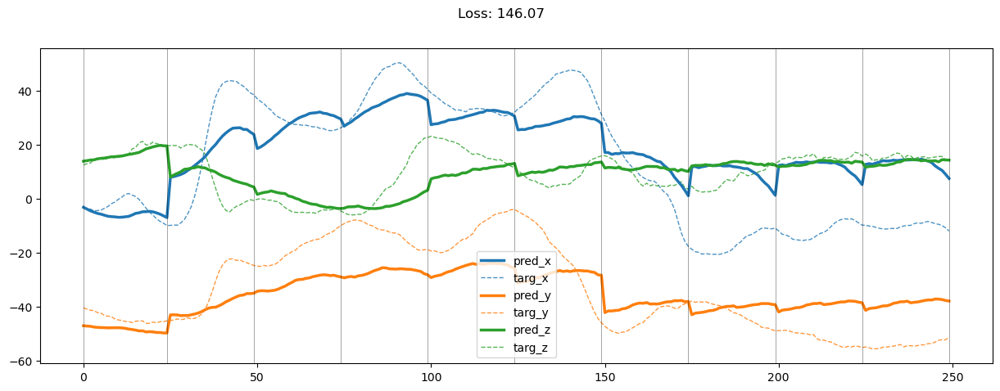

01399: train total loss:  1.383, pred loss:  1.383, valid total loss:  81.918, pred loss:  81.918


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01400: train total loss:  1.378, pred loss:  1.378, valid total loss:  85.996, pred loss:  85.996


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01401: train total loss:  1.344, pred loss:  1.344, valid total loss:  93.028, pred loss:  93.028


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01402: train total loss:  1.314, pred loss:  1.314, valid total loss:  92.797, pred loss:  92.797


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01403: train total loss:  1.318, pred loss:  1.318, valid total loss:  86.637, pred loss:  86.637


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01404: train total loss:  1.314, pred loss:  1.314, valid total loss:  86.315, pred loss:  86.315


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01405: train total loss:  1.391, pred loss:  1.391, valid total loss:  85.677, pred loss:  85.677


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


01406: train total loss:  1.331, pred loss:  1.331, valid total loss:  85.595, pred loss:  85.595


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01407: train total loss:  1.323, pred loss:  1.323, valid total loss:  85.941, pred loss:  85.941


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


01408: train total loss:  1.339, pred loss:  1.339, valid total loss:  84.268, pred loss:  84.268


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01409: train total loss:  1.284, pred loss:  1.284, valid total loss:  85.785, pred loss:  85.785


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


01410: train total loss:  1.281, pred loss:  1.281, valid total loss:  87.320, pred loss:  87.320


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01411: train total loss:  1.252, pred loss:  1.252, valid total loss:  92.632, pred loss:  92.632


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01412: train total loss:  1.306, pred loss:  1.306, valid total loss:  86.585, pred loss:  86.585


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01413: train total loss:  1.305, pred loss:  1.305, valid total loss:  83.463, pred loss:  83.463


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01414: train total loss:  1.332, pred loss:  1.332, valid total loss:  86.311, pred loss:  86.311


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


01415: train total loss:  1.315, pred loss:  1.315, valid total loss:  86.417, pred loss:  86.417


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


01416: train total loss:  1.335, pred loss:  1.335, valid total loss:  82.726, pred loss:  82.726


100%|██████████| 6/6 [00:00<00:00, 19.82it/s]


01417: train total loss:  1.315, pred loss:  1.315, valid total loss:  82.293, pred loss:  82.293


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01418: train total loss:  1.290, pred loss:  1.290, valid total loss:  84.074, pred loss:  84.074


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01419: train total loss:  1.249, pred loss:  1.249, valid total loss:  84.953, pred loss:  84.953


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01420: train total loss:  1.295, pred loss:  1.295, valid total loss:  87.632, pred loss:  87.632


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01421: train total loss:  1.250, pred loss:  1.250, valid total loss:  87.687, pred loss:  87.687


100%|██████████| 6/6 [00:00<00:00, 19.92it/s]


01422: train total loss:  1.263, pred loss:  1.263, valid total loss:  88.535, pred loss:  88.535


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01423: train total loss:  1.266, pred loss:  1.266, valid total loss:  87.093, pred loss:  87.093


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01424: train total loss:  1.251, pred loss:  1.251, valid total loss:  87.954, pred loss:  87.954


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01425: train total loss:  1.282, pred loss:  1.282, valid total loss:  88.371, pred loss:  88.371


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01426: train total loss:  1.277, pred loss:  1.277, valid total loss:  90.112, pred loss:  90.112


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01427: train total loss:  1.236, pred loss:  1.236, valid total loss:  91.169, pred loss:  91.169


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01428: train total loss:  1.315, pred loss:  1.315, valid total loss:  88.304, pred loss:  88.304


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01429: train total loss:  1.320, pred loss:  1.320, valid total loss:  86.527, pred loss:  86.527


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01430: train total loss:  1.316, pred loss:  1.316, valid total loss:  85.103, pred loss:  85.103


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01431: train total loss:  1.263, pred loss:  1.263, valid total loss:  85.339, pred loss:  85.339


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01432: train total loss:  1.257, pred loss:  1.257, valid total loss:  89.401, pred loss:  89.401


100%|██████████| 6/6 [00:00<00:00, 19.62it/s]


01433: train total loss:  1.288, pred loss:  1.288, valid total loss:  87.268, pred loss:  87.268


100%|██████████| 6/6 [00:00<00:00, 17.68it/s]


01434: train total loss:  1.299, pred loss:  1.299, valid total loss:  91.078, pred loss:  91.078


100%|██████████| 6/6 [00:00<00:00, 17.65it/s]


01435: train total loss:  1.283, pred loss:  1.283, valid total loss:  94.066, pred loss:  94.066


100%|██████████| 6/6 [00:00<00:00, 18.24it/s]


01436: train total loss:  1.294, pred loss:  1.294, valid total loss:  93.951, pred loss:  93.951


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01437: train total loss:  1.285, pred loss:  1.285, valid total loss:  89.187, pred loss:  89.187


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01438: train total loss:  1.313, pred loss:  1.313, valid total loss:  88.041, pred loss:  88.041


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01439: train total loss:  1.321, pred loss:  1.321, valid total loss:  88.295, pred loss:  88.295


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01440: train total loss:  1.323, pred loss:  1.323, valid total loss:  87.089, pred loss:  87.089


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01441: train total loss:  1.344, pred loss:  1.344, valid total loss:  89.970, pred loss:  89.970


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01442: train total loss:  1.345, pred loss:  1.345, valid total loss:  86.642, pred loss:  86.642


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


01443: train total loss:  1.290, pred loss:  1.290, valid total loss:  86.273, pred loss:  86.273


100%|██████████| 6/6 [00:00<00:00, 19.43it/s]


01444: train total loss:  1.294, pred loss:  1.294, valid total loss:  88.157, pred loss:  88.157


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01445: train total loss:  1.286, pred loss:  1.286, valid total loss:  91.610, pred loss:  91.610


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01446: train total loss:  1.313, pred loss:  1.313, valid total loss:  92.979, pred loss:  92.979


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01447: train total loss:  1.294, pred loss:  1.294, valid total loss:  88.772, pred loss:  88.772


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01448: train total loss:  1.233, pred loss:  1.233, valid total loss:  87.089, pred loss:  87.089


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


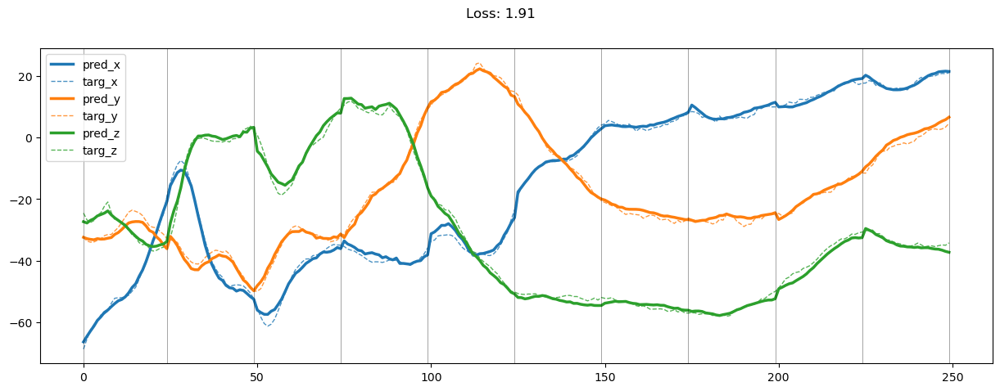

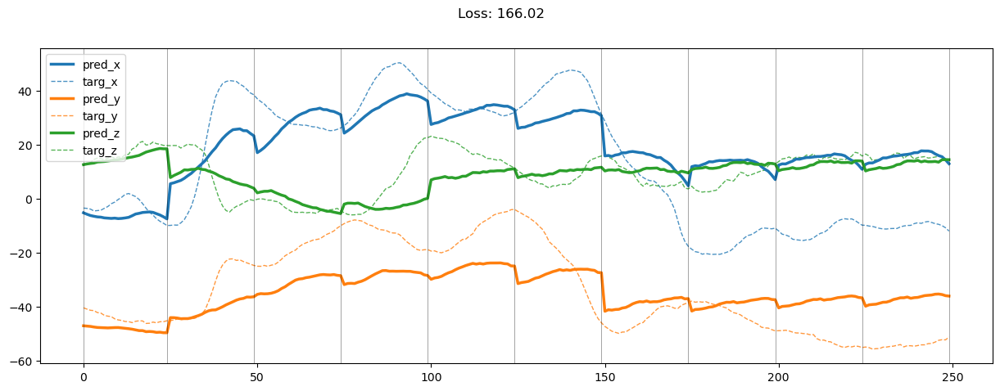

01449: train total loss:  1.238, pred loss:  1.238, valid total loss:  85.062, pred loss:  85.062


100%|██████████| 6/6 [00:00<00:00, 19.88it/s]


01450: train total loss:  1.237, pred loss:  1.237, valid total loss:  83.201, pred loss:  83.201


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01451: train total loss:  1.260, pred loss:  1.260, valid total loss:  85.305, pred loss:  85.305


100%|██████████| 6/6 [00:00<00:00, 19.46it/s]


01452: train total loss:  1.277, pred loss:  1.277, valid total loss:  89.032, pred loss:  89.032


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01453: train total loss:  1.304, pred loss:  1.304, valid total loss:  97.592, pred loss:  97.592


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01454: train total loss:  1.233, pred loss:  1.233, valid total loss:  95.525, pred loss:  95.525


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01455: train total loss:  1.238, pred loss:  1.238, valid total loss:  96.454, pred loss:  96.454


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01456: train total loss:  1.266, pred loss:  1.266, valid total loss:  96.056, pred loss:  96.056


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


01457: train total loss:  1.264, pred loss:  1.264, valid total loss:  89.881, pred loss:  89.881


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01458: train total loss:  1.238, pred loss:  1.238, valid total loss:  91.343, pred loss:  91.343


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01459: train total loss:  1.221, pred loss:  1.221, valid total loss:  93.669, pred loss:  93.669


100%|██████████| 6/6 [00:00<00:00, 19.28it/s]


01460: train total loss:  1.251, pred loss:  1.251, valid total loss:  92.139, pred loss:  92.139


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01461: train total loss:  1.302, pred loss:  1.302, valid total loss:  89.739, pred loss:  89.739


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01462: train total loss:  1.283, pred loss:  1.283, valid total loss:  90.691, pred loss:  90.691


100%|██████████| 6/6 [00:00<00:00, 18.06it/s]


01463: train total loss:  1.218, pred loss:  1.218, valid total loss:  90.282, pred loss:  90.282


100%|██████████| 6/6 [00:00<00:00, 17.86it/s]


01464: train total loss:  1.216, pred loss:  1.216, valid total loss:  92.418, pred loss:  92.418


100%|██████████| 6/6 [00:00<00:00, 19.53it/s]


01465: train total loss:  1.223, pred loss:  1.223, valid total loss:  96.051, pred loss:  96.051


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01466: train total loss:  1.245, pred loss:  1.245, valid total loss:  98.766, pred loss:  98.766


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01467: train total loss:  1.256, pred loss:  1.256, valid total loss:  96.220, pred loss:  96.220


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01468: train total loss:  1.231, pred loss:  1.231, valid total loss:  91.412, pred loss:  91.412


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


01469: train total loss:  1.257, pred loss:  1.257, valid total loss:  87.689, pred loss:  87.689


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01470: train total loss:  1.261, pred loss:  1.261, valid total loss:  91.117, pred loss:  91.117


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


01471: train total loss:  1.292, pred loss:  1.292, valid total loss:  80.050, pred loss:  80.050


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01472: train total loss:  1.360, pred loss:  1.360, valid total loss:  78.962, pred loss:  78.962


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


01473: train total loss:  1.364, pred loss:  1.364, valid total loss:  79.798, pred loss:  79.798


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01474: train total loss:  1.371, pred loss:  1.371, valid total loss:  77.567, pred loss:  77.567


100%|██████████| 6/6 [00:00<00:00, 18.35it/s]


01475: train total loss:  1.430, pred loss:  1.430, valid total loss:  81.440, pred loss:  81.440


100%|██████████| 6/6 [00:00<00:00, 18.70it/s]


01476: train total loss:  1.461, pred loss:  1.461, valid total loss:  87.055, pred loss:  87.055


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01477: train total loss:  1.377, pred loss:  1.377, valid total loss:  85.708, pred loss:  85.708


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01478: train total loss:  1.367, pred loss:  1.367, valid total loss:  86.395, pred loss:  86.395


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01479: train total loss:  1.354, pred loss:  1.354, valid total loss:  87.446, pred loss:  87.446


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01480: train total loss:  1.306, pred loss:  1.306, valid total loss:  82.428, pred loss:  82.428


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01481: train total loss:  1.316, pred loss:  1.316, valid total loss:  83.146, pred loss:  83.146


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01482: train total loss:  1.308, pred loss:  1.308, valid total loss:  84.387, pred loss:  84.387


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01483: train total loss:  1.285, pred loss:  1.285, valid total loss:  82.460, pred loss:  82.460


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01484: train total loss:  1.294, pred loss:  1.294, valid total loss:  83.763, pred loss:  83.763


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01485: train total loss:  1.315, pred loss:  1.315, valid total loss:  83.890, pred loss:  83.890


100%|██████████| 6/6 [00:00<00:00, 18.95it/s]


01486: train total loss:  1.298, pred loss:  1.298, valid total loss:  85.514, pred loss:  85.514


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01487: train total loss:  1.330, pred loss:  1.330, valid total loss:  84.421, pred loss:  84.421


100%|██████████| 6/6 [00:00<00:00, 17.96it/s]


01488: train total loss:  1.304, pred loss:  1.304, valid total loss:  85.543, pred loss:  85.543


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01489: train total loss:  1.290, pred loss:  1.290, valid total loss:  85.902, pred loss:  85.902


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01490: train total loss:  1.234, pred loss:  1.234, valid total loss:  82.684, pred loss:  82.684


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01491: train total loss:  1.258, pred loss:  1.258, valid total loss:  83.383, pred loss:  83.383


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01492: train total loss:  1.307, pred loss:  1.307, valid total loss:  85.013, pred loss:  85.013


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01493: train total loss:  1.293, pred loss:  1.293, valid total loss:  84.992, pred loss:  84.992


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01494: train total loss:  1.378, pred loss:  1.378, valid total loss:  85.322, pred loss:  85.322


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01495: train total loss:  1.252, pred loss:  1.252, valid total loss:  85.197, pred loss:  85.197


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01496: train total loss:  1.228, pred loss:  1.228, valid total loss:  86.514, pred loss:  86.514


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01497: train total loss:  1.234, pred loss:  1.234, valid total loss:  88.078, pred loss:  88.078


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01498: train total loss:  1.228, pred loss:  1.228, valid total loss:  85.116, pred loss:  85.116


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


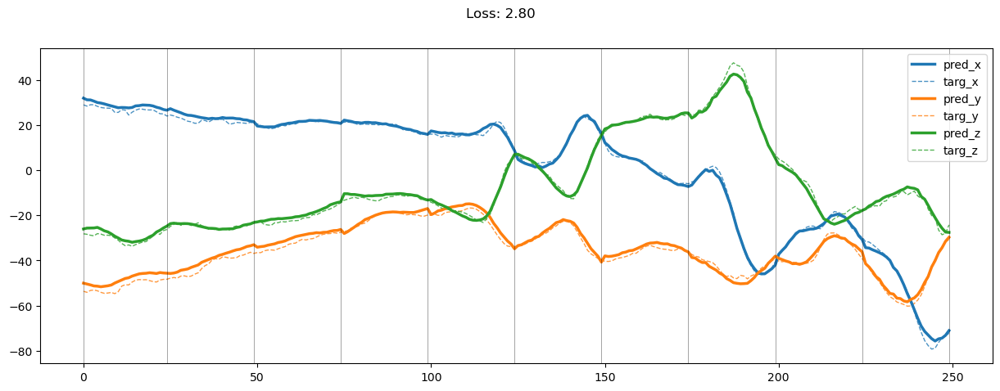

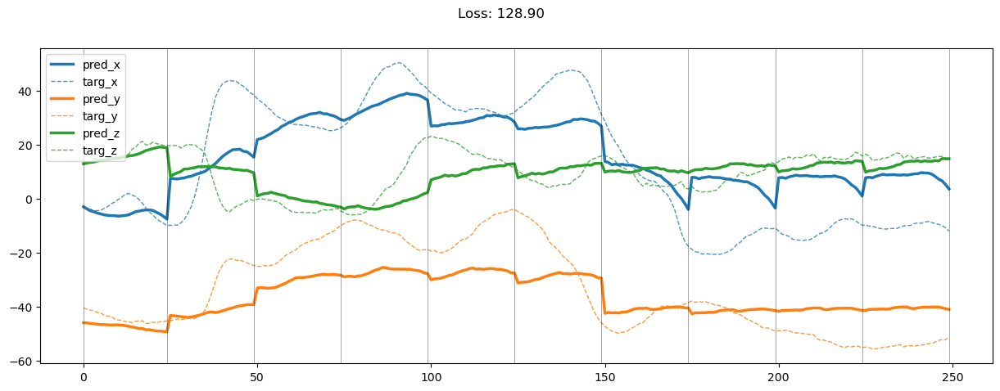

01499: train total loss:  1.256, pred loss:  1.256, valid total loss:  84.258, pred loss:  84.258


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01500: train total loss:  1.273, pred loss:  1.273, valid total loss:  93.415, pred loss:  93.415


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


01501: train total loss:  1.274, pred loss:  1.274, valid total loss:  90.242, pred loss:  90.242


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01502: train total loss:  1.272, pred loss:  1.272, valid total loss:  85.890, pred loss:  85.890


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01503: train total loss:  1.299, pred loss:  1.299, valid total loss:  83.581, pred loss:  83.581


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01504: train total loss:  1.262, pred loss:  1.262, valid total loss:  84.108, pred loss:  84.108


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01505: train total loss:  1.281, pred loss:  1.281, valid total loss:  85.226, pred loss:  85.226


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01506: train total loss:  1.176, pred loss:  1.176, valid total loss:  83.341, pred loss:  83.341


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01507: train total loss:  1.205, pred loss:  1.205, valid total loss:  82.367, pred loss:  82.367


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01508: train total loss:  1.267, pred loss:  1.267, valid total loss:  84.285, pred loss:  84.285


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01509: train total loss:  1.260, pred loss:  1.260, valid total loss:  87.659, pred loss:  87.659


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01510: train total loss:  1.237, pred loss:  1.237, valid total loss:  84.566, pred loss:  84.566


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01511: train total loss:  1.239, pred loss:  1.239, valid total loss:  83.160, pred loss:  83.160


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01512: train total loss:  1.262, pred loss:  1.262, valid total loss:  85.053, pred loss:  85.053


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01513: train total loss:  1.227, pred loss:  1.227, valid total loss:  82.728, pred loss:  82.728


100%|██████████| 6/6 [00:00<00:00, 20.29it/s]


01514: train total loss:  1.206, pred loss:  1.206, valid total loss:  82.464, pred loss:  82.464


100%|██████████| 6/6 [00:00<00:00, 17.73it/s]


01515: train total loss:  1.200, pred loss:  1.200, valid total loss:  83.876, pred loss:  83.876


100%|██████████| 6/6 [00:00<00:00, 19.14it/s]


01516: train total loss:  1.179, pred loss:  1.179, valid total loss:  83.883, pred loss:  83.883


100%|██████████| 6/6 [00:00<00:00, 17.56it/s]


01517: train total loss:  1.194, pred loss:  1.194, valid total loss:  84.835, pred loss:  84.835


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01518: train total loss:  1.194, pred loss:  1.194, valid total loss:  84.745, pred loss:  84.745


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01519: train total loss:  1.173, pred loss:  1.173, valid total loss:  84.697, pred loss:  84.697


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01520: train total loss:  1.183, pred loss:  1.183, valid total loss:  84.175, pred loss:  84.175


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01521: train total loss:  1.192, pred loss:  1.192, valid total loss:  86.926, pred loss:  86.926


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01522: train total loss:  1.212, pred loss:  1.212, valid total loss:  84.450, pred loss:  84.450


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


01523: train total loss:  1.562, pred loss:  1.562, valid total loss:  91.724, pred loss:  91.724


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01524: train total loss:  1.508, pred loss:  1.508, valid total loss:  95.952, pred loss:  95.952


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


01525: train total loss:  1.528, pred loss:  1.528, valid total loss:  94.820, pred loss:  94.820


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


01526: train total loss:  1.545, pred loss:  1.545, valid total loss:  90.667, pred loss:  90.667


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01527: train total loss:  1.426, pred loss:  1.426, valid total loss:  89.625, pred loss:  89.625


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01528: train total loss:  1.369, pred loss:  1.369, valid total loss:  84.494, pred loss:  84.494


100%|██████████| 6/6 [00:00<00:00, 20.91it/s]


01529: train total loss:  1.415, pred loss:  1.415, valid total loss:  90.287, pred loss:  90.287


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01530: train total loss:  1.293, pred loss:  1.293, valid total loss:  89.167, pred loss:  89.167


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


01531: train total loss:  1.301, pred loss:  1.301, valid total loss:  92.324, pred loss:  92.324


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01532: train total loss:  1.264, pred loss:  1.264, valid total loss:  92.774, pred loss:  92.774


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01533: train total loss:  1.290, pred loss:  1.290, valid total loss:  94.869, pred loss:  94.869


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01534: train total loss:  1.260, pred loss:  1.260, valid total loss:  90.941, pred loss:  90.941


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01535: train total loss:  1.275, pred loss:  1.275, valid total loss:  89.302, pred loss:  89.302


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01536: train total loss:  1.292, pred loss:  1.292, valid total loss:  92.869, pred loss:  92.869


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01537: train total loss:  1.305, pred loss:  1.305, valid total loss:  88.283, pred loss:  88.283


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01538: train total loss:  1.260, pred loss:  1.260, valid total loss:  92.369, pred loss:  92.369


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01539: train total loss:  1.220, pred loss:  1.220, valid total loss:  89.968, pred loss:  89.968


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01540: train total loss:  1.221, pred loss:  1.221, valid total loss:  86.403, pred loss:  86.403


100%|██████████| 6/6 [00:00<00:00, 18.30it/s]


01541: train total loss:  1.158, pred loss:  1.158, valid total loss:  87.334, pred loss:  87.334


100%|██████████| 6/6 [00:00<00:00, 17.60it/s]


01542: train total loss:  1.167, pred loss:  1.167, valid total loss:  90.322, pred loss:  90.322


100%|██████████| 6/6 [00:00<00:00, 18.10it/s]


01543: train total loss:  1.184, pred loss:  1.184, valid total loss:  90.581, pred loss:  90.581


100%|██████████| 6/6 [00:00<00:00, 19.78it/s]


01544: train total loss:  1.243, pred loss:  1.243, valid total loss:  90.451, pred loss:  90.451


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01545: train total loss:  1.227, pred loss:  1.227, valid total loss:  89.045, pred loss:  89.045


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01546: train total loss:  1.207, pred loss:  1.207, valid total loss:  86.657, pred loss:  86.657


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01547: train total loss:  1.199, pred loss:  1.199, valid total loss:  86.848, pred loss:  86.848


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01548: train total loss:  1.194, pred loss:  1.194, valid total loss:  90.878, pred loss:  90.878


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


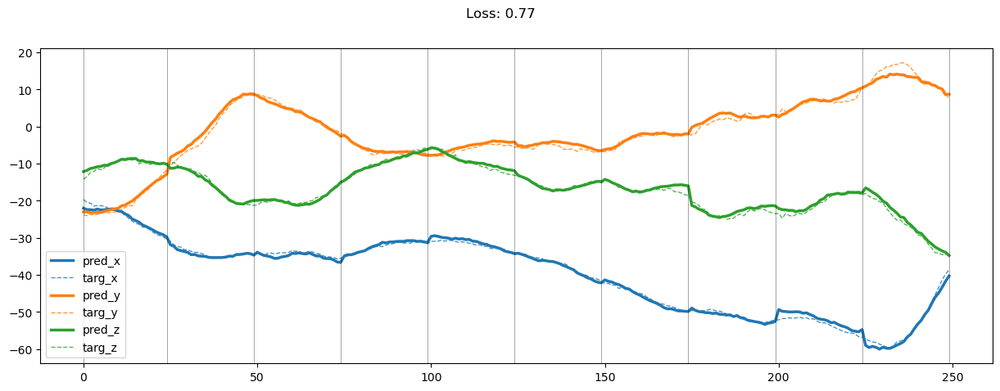

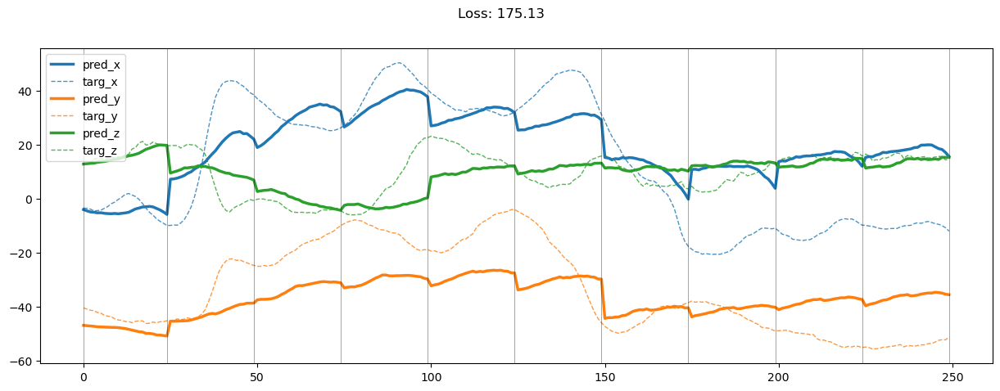

01549: train total loss:  1.182, pred loss:  1.182, valid total loss:  91.695, pred loss:  91.695


100%|██████████| 6/6 [00:00<00:00, 18.45it/s]


01550: train total loss:  1.248, pred loss:  1.248, valid total loss:  89.207, pred loss:  89.207


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01551: train total loss:  1.201, pred loss:  1.201, valid total loss:  92.032, pred loss:  92.032


100%|██████████| 6/6 [00:00<00:00, 19.68it/s]


01552: train total loss:  1.163, pred loss:  1.163, valid total loss:  90.224, pred loss:  90.224


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01553: train total loss:  1.153, pred loss:  1.153, valid total loss:  87.423, pred loss:  87.423


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


01554: train total loss:  1.161, pred loss:  1.161, valid total loss:  89.207, pred loss:  89.207


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01555: train total loss:  1.209, pred loss:  1.209, valid total loss:  86.475, pred loss:  86.475


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01556: train total loss:  1.160, pred loss:  1.160, valid total loss:  86.538, pred loss:  86.538


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01557: train total loss:  1.115, pred loss:  1.115, valid total loss:  88.239, pred loss:  88.239


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


01558: train total loss:  1.127, pred loss:  1.127, valid total loss:  89.840, pred loss:  89.840


100%|██████████| 6/6 [00:00<00:00, 18.54it/s]


01559: train total loss:  1.106, pred loss:  1.106, valid total loss:  87.729, pred loss:  87.729


100%|██████████| 6/6 [00:00<00:00, 18.98it/s]


01560: train total loss:  1.185, pred loss:  1.185, valid total loss:  88.231, pred loss:  88.231


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01561: train total loss:  1.253, pred loss:  1.253, valid total loss:  87.034, pred loss:  87.034


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01562: train total loss:  1.221, pred loss:  1.221, valid total loss:  88.703, pred loss:  88.703


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01563: train total loss:  1.249, pred loss:  1.249, valid total loss:  91.292, pred loss:  91.292


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01564: train total loss:  1.175, pred loss:  1.175, valid total loss:  87.038, pred loss:  87.038


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01565: train total loss:  1.249, pred loss:  1.249, valid total loss:  87.612, pred loss:  87.612


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01566: train total loss:  1.232, pred loss:  1.232, valid total loss:  91.216, pred loss:  91.216


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01567: train total loss:  1.195, pred loss:  1.195, valid total loss:  88.485, pred loss:  88.485


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01568: train total loss:  1.209, pred loss:  1.209, valid total loss:  88.345, pred loss:  88.345


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01569: train total loss:  1.187, pred loss:  1.187, valid total loss:  88.487, pred loss:  88.487


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01570: train total loss:  1.180, pred loss:  1.180, valid total loss:  87.372, pred loss:  87.372


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01571: train total loss:  1.152, pred loss:  1.152, valid total loss:  86.221, pred loss:  86.221


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01572: train total loss:  1.207, pred loss:  1.207, valid total loss:  85.252, pred loss:  85.252


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01573: train total loss:  1.167, pred loss:  1.167, valid total loss:  87.439, pred loss:  87.439


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01574: train total loss:  1.117, pred loss:  1.117, valid total loss:  86.200, pred loss:  86.200


100%|██████████| 6/6 [00:00<00:00, 18.69it/s]


01575: train total loss:  1.143, pred loss:  1.143, valid total loss:  84.339, pred loss:  84.339


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01576: train total loss:  1.141, pred loss:  1.141, valid total loss:  84.325, pred loss:  84.325


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01577: train total loss:  1.153, pred loss:  1.153, valid total loss:  85.209, pred loss:  85.209


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01578: train total loss:  1.115, pred loss:  1.115, valid total loss:  89.689, pred loss:  89.689


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01579: train total loss:  1.116, pred loss:  1.116, valid total loss:  86.637, pred loss:  86.637


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01580: train total loss:  1.174, pred loss:  1.174, valid total loss:  88.955, pred loss:  88.955


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01581: train total loss:  1.142, pred loss:  1.142, valid total loss:  87.647, pred loss:  87.647


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01582: train total loss:  1.134, pred loss:  1.134, valid total loss:  86.077, pred loss:  86.077


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01583: train total loss:  1.195, pred loss:  1.195, valid total loss:  83.951, pred loss:  83.951


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01584: train total loss:  1.181, pred loss:  1.181, valid total loss:  83.462, pred loss:  83.462


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01585: train total loss:  1.184, pred loss:  1.184, valid total loss:  86.950, pred loss:  86.950


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01586: train total loss:  1.151, pred loss:  1.151, valid total loss:  87.048, pred loss:  87.048


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01587: train total loss:  1.175, pred loss:  1.175, valid total loss:  89.359, pred loss:  89.359


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01588: train total loss:  1.214, pred loss:  1.214, valid total loss:  86.881, pred loss:  86.881


100%|██████████| 6/6 [00:00<00:00, 18.18it/s]


01589: train total loss:  1.177, pred loss:  1.177, valid total loss:  85.235, pred loss:  85.235


100%|██████████| 6/6 [00:00<00:00, 17.79it/s]


01590: train total loss:  1.232, pred loss:  1.232, valid total loss:  88.942, pred loss:  88.942


100%|██████████| 6/6 [00:00<00:00, 18.54it/s]


01591: train total loss:  1.309, pred loss:  1.309, valid total loss:  90.223, pred loss:  90.223


100%|██████████| 6/6 [00:00<00:00, 18.09it/s]


01592: train total loss:  1.271, pred loss:  1.271, valid total loss:  88.542, pred loss:  88.542


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01593: train total loss:  1.208, pred loss:  1.208, valid total loss:  90.639, pred loss:  90.639


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01594: train total loss:  1.242, pred loss:  1.242, valid total loss:  90.568, pred loss:  90.568


100%|██████████| 6/6 [00:00<00:00, 19.81it/s]


01595: train total loss:  1.205, pred loss:  1.205, valid total loss:  89.546, pred loss:  89.546


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01596: train total loss:  1.226, pred loss:  1.226, valid total loss:  89.818, pred loss:  89.818


100%|██████████| 6/6 [00:00<00:00, 19.27it/s]


01597: train total loss:  1.255, pred loss:  1.255, valid total loss:  90.642, pred loss:  90.642


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01598: train total loss:  1.197, pred loss:  1.197, valid total loss:  89.271, pred loss:  89.271


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


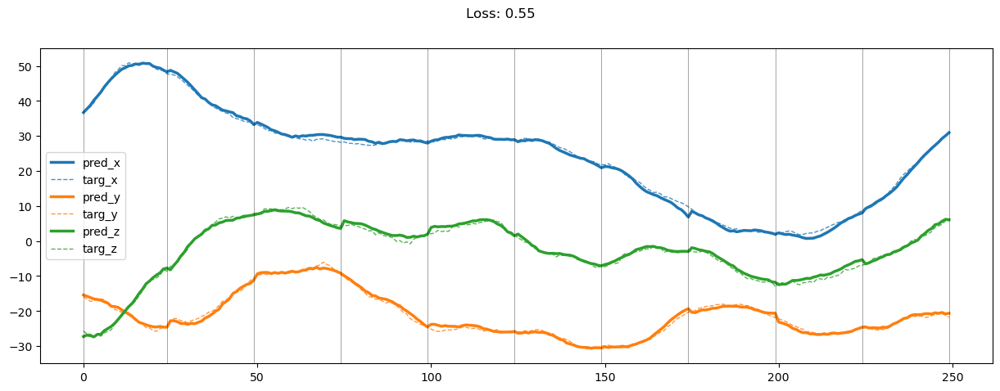

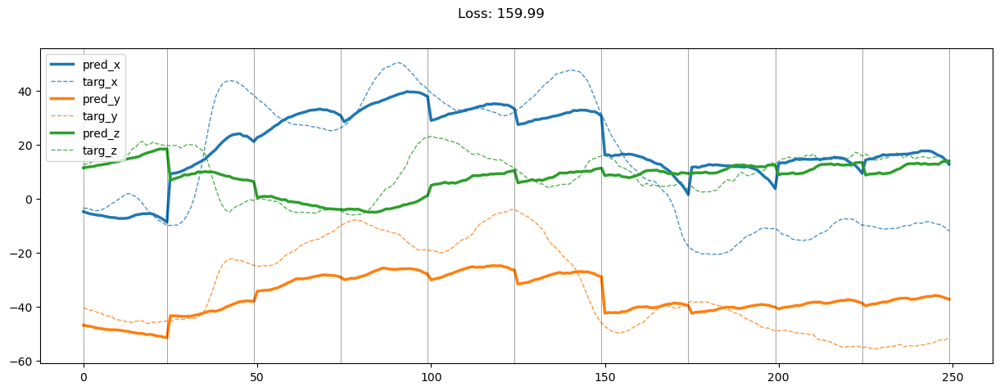

01599: train total loss:  1.154, pred loss:  1.154, valid total loss:  88.156, pred loss:  88.156


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01600: train total loss:  1.173, pred loss:  1.173, valid total loss:  88.921, pred loss:  88.921


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01601: train total loss:  1.198, pred loss:  1.198, valid total loss:  91.329, pred loss:  91.329


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01602: train total loss:  1.123, pred loss:  1.123, valid total loss:  91.608, pred loss:  91.608


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01603: train total loss:  1.117, pred loss:  1.117, valid total loss:  90.509, pred loss:  90.509


100%|██████████| 6/6 [00:00<00:00, 20.90it/s]


01604: train total loss:  1.142, pred loss:  1.142, valid total loss:  89.229, pred loss:  89.229


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01605: train total loss:  1.141, pred loss:  1.141, valid total loss:  90.151, pred loss:  90.151


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01606: train total loss:  1.129, pred loss:  1.129, valid total loss:  90.235, pred loss:  90.235


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01607: train total loss:  1.068, pred loss:  1.068, valid total loss:  89.939, pred loss:  89.939


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01608: train total loss:  1.071, pred loss:  1.071, valid total loss:  91.771, pred loss:  91.771


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


01609: train total loss:  1.103, pred loss:  1.103, valid total loss:  92.258, pred loss:  92.258


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01610: train total loss:  1.092, pred loss:  1.092, valid total loss:  91.097, pred loss:  91.097


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01611: train total loss:  1.105, pred loss:  1.105, valid total loss:  90.385, pred loss:  90.385


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01612: train total loss:  1.082, pred loss:  1.082, valid total loss:  89.711, pred loss:  89.711


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01613: train total loss:  1.049, pred loss:  1.049, valid total loss:  91.340, pred loss:  91.340


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01614: train total loss:  1.090, pred loss:  1.090, valid total loss:  89.731, pred loss:  89.731


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01615: train total loss:  1.083, pred loss:  1.083, valid total loss:  91.763, pred loss:  91.763


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01616: train total loss:  1.091, pred loss:  1.091, valid total loss:  89.649, pred loss:  89.649


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01617: train total loss:  1.074, pred loss:  1.074, valid total loss:  90.089, pred loss:  90.089


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01618: train total loss:  1.099, pred loss:  1.099, valid total loss:  92.210, pred loss:  92.210


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01619: train total loss:  1.106, pred loss:  1.106, valid total loss:  89.155, pred loss:  89.155


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01620: train total loss:  1.114, pred loss:  1.114, valid total loss:  88.844, pred loss:  88.844


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01621: train total loss:  1.075, pred loss:  1.075, valid total loss:  86.014, pred loss:  86.014


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01622: train total loss:  1.041, pred loss:  1.041, valid total loss:  85.792, pred loss:  85.792


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01623: train total loss:  1.032, pred loss:  1.032, valid total loss:  87.649, pred loss:  87.649


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01624: train total loss:  1.032, pred loss:  1.032, valid total loss:  88.049, pred loss:  88.049


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01625: train total loss:  1.061, pred loss:  1.061, valid total loss:  87.310, pred loss:  87.310


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01626: train total loss:  1.033, pred loss:  1.033, valid total loss:  86.971, pred loss:  86.971


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01627: train total loss:  1.016, pred loss:  1.016, valid total loss:  85.416, pred loss:  85.416


100%|██████████| 6/6 [00:00<00:00, 20.89it/s]


01628: train total loss:  1.030, pred loss:  1.030, valid total loss:  85.295, pred loss:  85.295


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01629: train total loss:  1.070, pred loss:  1.070, valid total loss:  86.402, pred loss:  86.402


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01630: train total loss:  1.046, pred loss:  1.046, valid total loss:  85.474, pred loss:  85.474


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01631: train total loss:  1.087, pred loss:  1.087, valid total loss:  87.235, pred loss:  87.235


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01632: train total loss:  1.114, pred loss:  1.114, valid total loss:  85.683, pred loss:  85.683


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01633: train total loss:  1.234, pred loss:  1.234, valid total loss:  86.306, pred loss:  86.306


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01634: train total loss:  1.182, pred loss:  1.182, valid total loss:  88.199, pred loss:  88.199


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01635: train total loss:  1.164, pred loss:  1.164, valid total loss:  88.539, pred loss:  88.539


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01636: train total loss:  1.201, pred loss:  1.201, valid total loss:  85.619, pred loss:  85.619


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01637: train total loss:  1.201, pred loss:  1.201, valid total loss:  86.062, pred loss:  86.062


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01638: train total loss:  1.195, pred loss:  1.195, valid total loss:  89.009, pred loss:  89.009


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01639: train total loss:  1.163, pred loss:  1.163, valid total loss:  89.998, pred loss:  89.998


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01640: train total loss:  1.175, pred loss:  1.175, valid total loss:  89.127, pred loss:  89.127


100%|██████████| 6/6 [00:00<00:00, 19.52it/s]


01641: train total loss:  1.117, pred loss:  1.117, valid total loss:  91.945, pred loss:  91.945


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01642: train total loss:  1.135, pred loss:  1.135, valid total loss:  89.240, pred loss:  89.240


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01643: train total loss:  1.103, pred loss:  1.103, valid total loss:  90.078, pred loss:  90.078


100%|██████████| 6/6 [00:00<00:00, 20.14it/s]


01644: train total loss:  1.122, pred loss:  1.122, valid total loss:  88.927, pred loss:  88.927


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01645: train total loss:  1.092, pred loss:  1.092, valid total loss:  88.993, pred loss:  88.993


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01646: train total loss:  1.059, pred loss:  1.059, valid total loss:  85.966, pred loss:  85.966


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01647: train total loss:  1.057, pred loss:  1.057, valid total loss:  87.689, pred loss:  87.689


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01648: train total loss:  1.039, pred loss:  1.039, valid total loss:  88.660, pred loss:  88.660


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


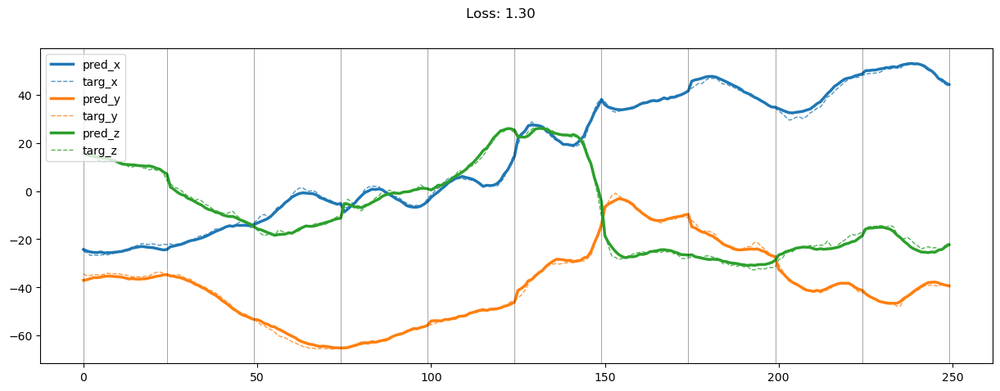

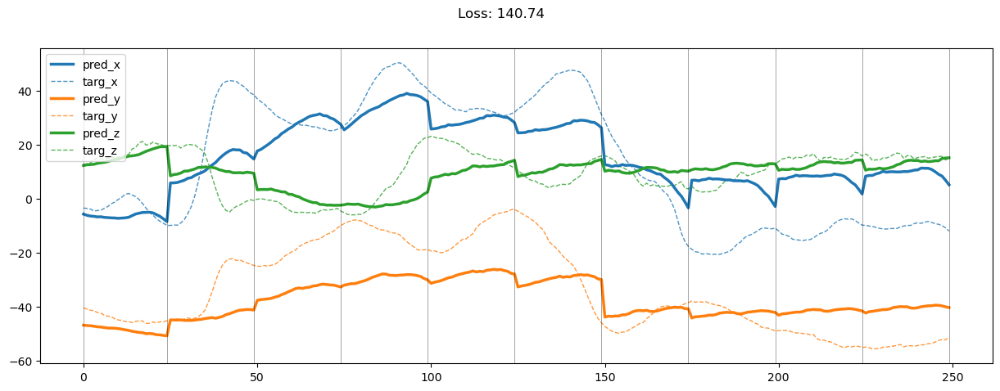

01649: train total loss:  1.074, pred loss:  1.074, valid total loss:  86.390, pred loss:  86.390


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


01650: train total loss:  1.067, pred loss:  1.067, valid total loss:  88.548, pred loss:  88.548


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01651: train total loss:  1.036, pred loss:  1.036, valid total loss:  87.397, pred loss:  87.397


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01652: train total loss:  1.077, pred loss:  1.077, valid total loss:  85.981, pred loss:  85.981


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01653: train total loss:  1.135, pred loss:  1.135, valid total loss:  89.306, pred loss:  89.306


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01654: train total loss:  1.141, pred loss:  1.141, valid total loss:  86.100, pred loss:  86.100


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01655: train total loss:  1.134, pred loss:  1.134, valid total loss:  85.970, pred loss:  85.970


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01656: train total loss:  1.122, pred loss:  1.122, valid total loss:  90.478, pred loss:  90.478


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01657: train total loss:  1.146, pred loss:  1.146, valid total loss:  88.424, pred loss:  88.424


100%|██████████| 6/6 [00:00<00:00, 18.64it/s]


01658: train total loss:  1.147, pred loss:  1.147, valid total loss:  87.046, pred loss:  87.046


100%|██████████| 6/6 [00:00<00:00, 17.51it/s]


01659: train total loss:  1.139, pred loss:  1.139, valid total loss:  87.932, pred loss:  87.932


100%|██████████| 6/6 [00:00<00:00, 18.21it/s]


01660: train total loss:  1.250, pred loss:  1.250, valid total loss:  87.453, pred loss:  87.453


100%|██████████| 6/6 [00:00<00:00, 19.92it/s]


01661: train total loss:  1.217, pred loss:  1.217, valid total loss:  86.902, pred loss:  86.902


100%|██████████| 6/6 [00:00<00:00, 19.80it/s]


01662: train total loss:  1.209, pred loss:  1.209, valid total loss:  84.937, pred loss:  84.937


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01663: train total loss:  1.114, pred loss:  1.114, valid total loss:  85.837, pred loss:  85.837


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01664: train total loss:  1.088, pred loss:  1.088, valid total loss:  88.198, pred loss:  88.198


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01665: train total loss:  1.058, pred loss:  1.058, valid total loss:  90.555, pred loss:  90.555


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


01666: train total loss:  1.046, pred loss:  1.046, valid total loss:  91.321, pred loss:  91.321


100%|██████████| 6/6 [00:00<00:00, 19.62it/s]


01667: train total loss:  1.042, pred loss:  1.042, valid total loss:  90.051, pred loss:  90.051


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01668: train total loss:  1.065, pred loss:  1.065, valid total loss:  93.004, pred loss:  93.004


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01669: train total loss:  1.064, pred loss:  1.064, valid total loss:  91.288, pred loss:  91.288


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01670: train total loss:  1.070, pred loss:  1.070, valid total loss:  89.484, pred loss:  89.484


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01671: train total loss:  1.067, pred loss:  1.067, valid total loss:  87.255, pred loss:  87.255


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


01672: train total loss:  1.133, pred loss:  1.133, valid total loss:  89.015, pred loss:  89.015


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01673: train total loss:  1.124, pred loss:  1.124, valid total loss:  90.231, pred loss:  90.231


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


01674: train total loss:  1.061, pred loss:  1.061, valid total loss:  88.237, pred loss:  88.237


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01675: train total loss:  1.040, pred loss:  1.040, valid total loss:  86.610, pred loss:  86.610


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01676: train total loss:  1.059, pred loss:  1.059, valid total loss:  86.107, pred loss:  86.107


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01677: train total loss:  1.057, pred loss:  1.057, valid total loss:  88.025, pred loss:  88.025


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01678: train total loss:  1.040, pred loss:  1.040, valid total loss:  87.308, pred loss:  87.308


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01679: train total loss:  1.059, pred loss:  1.059, valid total loss:  90.886, pred loss:  90.886


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01680: train total loss:  1.078, pred loss:  1.078, valid total loss:  89.761, pred loss:  89.761


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01681: train total loss:  1.073, pred loss:  1.073, valid total loss:  88.007, pred loss:  88.007


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


01682: train total loss:  1.070, pred loss:  1.070, valid total loss:  90.325, pred loss:  90.325


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01683: train total loss:  1.061, pred loss:  1.061, valid total loss:  93.422, pred loss:  93.422


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01684: train total loss:  1.083, pred loss:  1.083, valid total loss:  94.065, pred loss:  94.065


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01685: train total loss:  1.034, pred loss:  1.034, valid total loss:  91.900, pred loss:  91.900


100%|██████████| 6/6 [00:00<00:00, 19.43it/s]


01686: train total loss:  1.074, pred loss:  1.074, valid total loss:  88.464, pred loss:  88.464


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01687: train total loss:  1.090, pred loss:  1.090, valid total loss:  90.964, pred loss:  90.964


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01688: train total loss:  1.075, pred loss:  1.075, valid total loss:  95.446, pred loss:  95.446


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01689: train total loss:  1.086, pred loss:  1.086, valid total loss:  92.804, pred loss:  92.804


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01690: train total loss:  1.125, pred loss:  1.125, valid total loss:  91.943, pred loss:  91.943


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01691: train total loss:  1.141, pred loss:  1.141, valid total loss:  92.431, pred loss:  92.431


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01692: train total loss:  1.124, pred loss:  1.124, valid total loss:  94.824, pred loss:  94.824


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01693: train total loss:  1.107, pred loss:  1.107, valid total loss:  94.503, pred loss:  94.503


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01694: train total loss:  1.199, pred loss:  1.199, valid total loss:  89.630, pred loss:  89.630


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01695: train total loss:  1.160, pred loss:  1.160, valid total loss:  92.588, pred loss:  92.588


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01696: train total loss:  1.180, pred loss:  1.180, valid total loss:  90.863, pred loss:  90.863


100%|██████████| 6/6 [00:00<00:00, 19.69it/s]


01697: train total loss:  1.170, pred loss:  1.170, valid total loss:  90.866, pred loss:  90.866


100%|██████████| 6/6 [00:00<00:00, 18.40it/s]


01698: train total loss:  1.166, pred loss:  1.166, valid total loss:  94.497, pred loss:  94.497


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


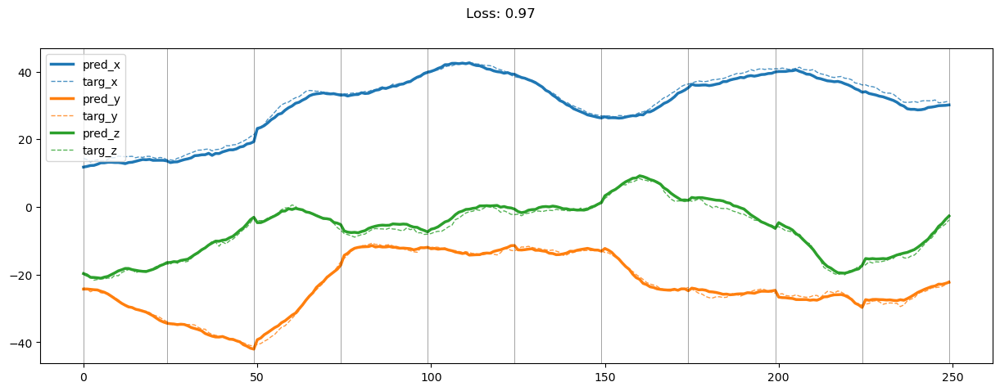

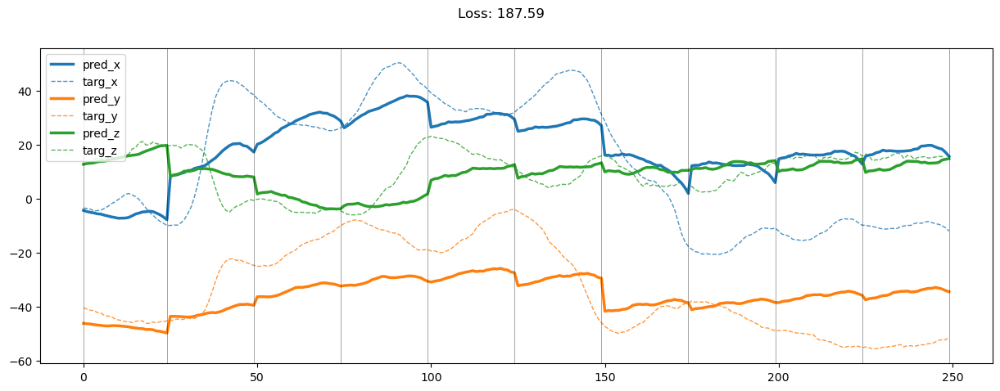

01699: train total loss:  1.161, pred loss:  1.161, valid total loss:  90.341, pred loss:  90.341


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


01700: train total loss:  1.112, pred loss:  1.112, valid total loss:  93.928, pred loss:  93.928


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01701: train total loss:  1.143, pred loss:  1.143, valid total loss:  89.432, pred loss:  89.432


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01702: train total loss:  1.114, pred loss:  1.114, valid total loss:  89.202, pred loss:  89.202


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01703: train total loss:  1.096, pred loss:  1.096, valid total loss:  87.786, pred loss:  87.786


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01704: train total loss:  1.076, pred loss:  1.076, valid total loss:  88.942, pred loss:  88.942


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01705: train total loss:  1.061, pred loss:  1.061, valid total loss:  88.638, pred loss:  88.638


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01706: train total loss:  1.001, pred loss:  1.001, valid total loss:  89.081, pred loss:  89.081


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01707: train total loss:  1.012, pred loss:  1.012, valid total loss:  88.129, pred loss:  88.129


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01708: train total loss:  0.988, pred loss:  0.988, valid total loss:  87.702, pred loss:  87.702


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01709: train total loss:  0.978, pred loss:  0.978, valid total loss:  89.411, pred loss:  89.411


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01710: train total loss:  1.023, pred loss:  1.023, valid total loss:  88.134, pred loss:  88.134


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01711: train total loss:  1.000, pred loss:  1.000, valid total loss:  87.284, pred loss:  87.284


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01712: train total loss:  1.021, pred loss:  1.021, valid total loss:  85.614, pred loss:  85.614


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01713: train total loss:  1.053, pred loss:  1.053, valid total loss:  85.673, pred loss:  85.673


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01714: train total loss:  1.023, pred loss:  1.023, valid total loss:  88.109, pred loss:  88.109


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01715: train total loss:  1.050, pred loss:  1.050, valid total loss:  88.667, pred loss:  88.667


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01716: train total loss:  1.031, pred loss:  1.031, valid total loss:  89.979, pred loss:  89.979


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01717: train total loss:  0.990, pred loss:  0.990, valid total loss:  88.585, pred loss:  88.585


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01718: train total loss:  1.000, pred loss:  1.000, valid total loss:  87.948, pred loss:  87.948


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01719: train total loss:  0.992, pred loss:  0.992, valid total loss:  87.187, pred loss:  87.187


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01720: train total loss:  1.050, pred loss:  1.050, valid total loss:  87.355, pred loss:  87.355


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01721: train total loss:  1.060, pred loss:  1.060, valid total loss:  89.018, pred loss:  89.018


100%|██████████| 6/6 [00:00<00:00, 19.31it/s]


01722: train total loss:  1.036, pred loss:  1.036, valid total loss:  85.491, pred loss:  85.491


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01723: train total loss:  1.045, pred loss:  1.045, valid total loss:  86.720, pred loss:  86.720


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01724: train total loss:  1.089, pred loss:  1.089, valid total loss:  85.197, pred loss:  85.197


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01725: train total loss:  1.070, pred loss:  1.070, valid total loss:  85.202, pred loss:  85.202


100%|██████████| 6/6 [00:00<00:00, 19.49it/s]


01726: train total loss:  1.043, pred loss:  1.043, valid total loss:  85.780, pred loss:  85.780


100%|██████████| 6/6 [00:00<00:00, 19.59it/s]


01727: train total loss:  1.020, pred loss:  1.020, valid total loss:  86.747, pred loss:  86.747


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


01728: train total loss:  1.014, pred loss:  1.014, valid total loss:  85.718, pred loss:  85.718


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01729: train total loss:  1.013, pred loss:  1.013, valid total loss:  85.060, pred loss:  85.060


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01730: train total loss:  1.001, pred loss:  1.001, valid total loss:  85.962, pred loss:  85.962


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01731: train total loss:  0.992, pred loss:  0.992, valid total loss:  90.289, pred loss:  90.289


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01732: train total loss:  0.965, pred loss:  0.965, valid total loss:  87.464, pred loss:  87.464


100%|██████████| 6/6 [00:00<00:00, 19.95it/s]


01733: train total loss:  0.957, pred loss:  0.957, valid total loss:  88.101, pred loss:  88.101


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01734: train total loss:  0.985, pred loss:  0.985, valid total loss:  86.819, pred loss:  86.819


100%|██████████| 6/6 [00:00<00:00, 19.46it/s]


01735: train total loss:  0.997, pred loss:  0.997, valid total loss:  87.454, pred loss:  87.454


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


01736: train total loss:  0.983, pred loss:  0.983, valid total loss:  88.513, pred loss:  88.513


100%|██████████| 6/6 [00:00<00:00, 19.01it/s]


01737: train total loss:  1.004, pred loss:  1.004, valid total loss:  85.683, pred loss:  85.683


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01738: train total loss:  1.000, pred loss:  1.000, valid total loss:  86.311, pred loss:  86.311


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01739: train total loss:  1.006, pred loss:  1.006, valid total loss:  87.550, pred loss:  87.550


100%|██████████| 6/6 [00:00<00:00, 17.56it/s]


01740: train total loss:  1.011, pred loss:  1.011, valid total loss:  88.242, pred loss:  88.242


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01741: train total loss:  0.977, pred loss:  0.977, valid total loss:  87.614, pred loss:  87.614


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01742: train total loss:  1.004, pred loss:  1.004, valid total loss:  88.372, pred loss:  88.372


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01743: train total loss:  1.002, pred loss:  1.002, valid total loss:  91.458, pred loss:  91.458


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01744: train total loss:  0.999, pred loss:  0.999, valid total loss:  89.908, pred loss:  89.908


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


01745: train total loss:  0.993, pred loss:  0.993, valid total loss:  85.840, pred loss:  85.840


100%|██████████| 6/6 [00:00<00:00, 18.96it/s]


01746: train total loss:  1.024, pred loss:  1.024, valid total loss:  87.365, pred loss:  87.365


100%|██████████| 6/6 [00:00<00:00, 18.79it/s]


01747: train total loss:  1.008, pred loss:  1.008, valid total loss:  91.678, pred loss:  91.678


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01748: train total loss:  0.983, pred loss:  0.983, valid total loss:  90.693, pred loss:  90.693


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


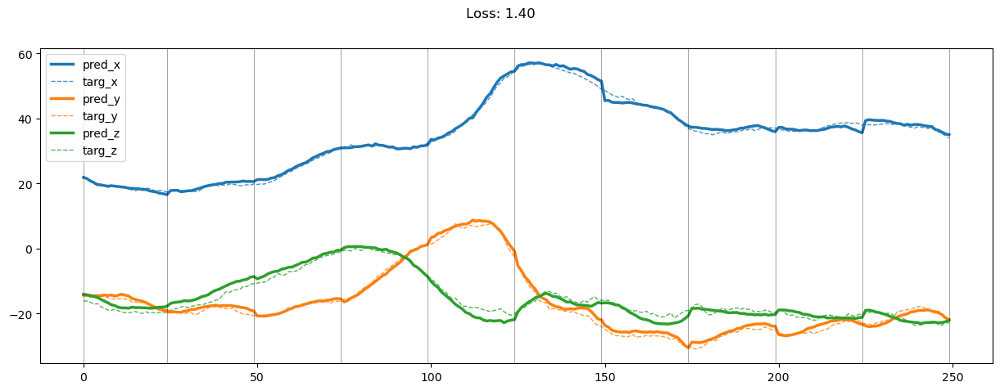

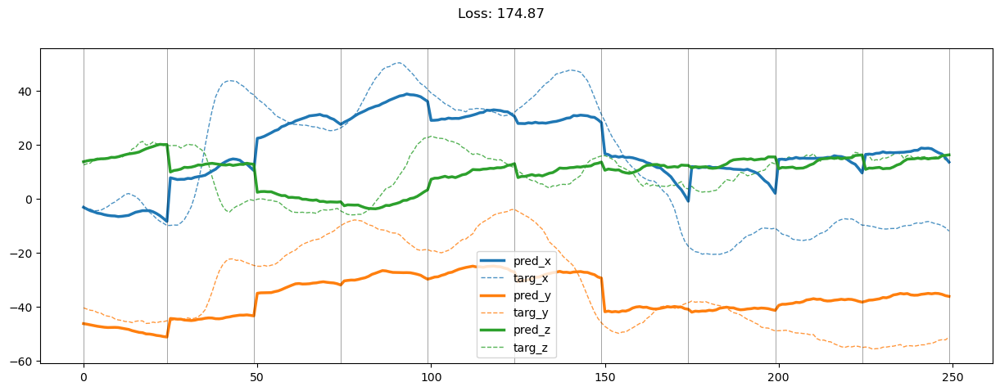

01749: train total loss:  0.954, pred loss:  0.954, valid total loss:  92.868, pred loss:  92.868


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01750: train total loss:  0.966, pred loss:  0.966, valid total loss:  93.514, pred loss:  93.514


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01751: train total loss:  0.989, pred loss:  0.989, valid total loss:  95.308, pred loss:  95.308


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01752: train total loss:  0.970, pred loss:  0.970, valid total loss:  92.867, pred loss:  92.867


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01753: train total loss:  0.978, pred loss:  0.978, valid total loss:  91.002, pred loss:  91.002


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01754: train total loss:  0.953, pred loss:  0.953, valid total loss:  86.733, pred loss:  86.733


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01755: train total loss:  0.956, pred loss:  0.956, valid total loss:  89.595, pred loss:  89.595


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01756: train total loss:  1.017, pred loss:  1.017, valid total loss:  86.587, pred loss:  86.587


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01757: train total loss:  1.038, pred loss:  1.038, valid total loss:  88.097, pred loss:  88.097


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01758: train total loss:  1.037, pred loss:  1.037, valid total loss:  88.865, pred loss:  88.865


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01759: train total loss:  1.049, pred loss:  1.049, valid total loss:  93.925, pred loss:  93.925


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01760: train total loss:  1.054, pred loss:  1.054, valid total loss:  91.800, pred loss:  91.800


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01761: train total loss:  1.022, pred loss:  1.022, valid total loss:  90.566, pred loss:  90.566


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01762: train total loss:  1.018, pred loss:  1.018, valid total loss:  88.654, pred loss:  88.654


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01763: train total loss:  1.037, pred loss:  1.037, valid total loss:  92.478, pred loss:  92.478


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01764: train total loss:  1.059, pred loss:  1.059, valid total loss:  88.589, pred loss:  88.589


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01765: train total loss:  1.109, pred loss:  1.109, valid total loss:  89.577, pred loss:  89.577


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01766: train total loss:  1.063, pred loss:  1.063, valid total loss:  86.960, pred loss:  86.960


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01767: train total loss:  1.064, pred loss:  1.064, valid total loss:  87.332, pred loss:  87.332


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01768: train total loss:  1.025, pred loss:  1.025, valid total loss:  87.821, pred loss:  87.821


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01769: train total loss:  1.052, pred loss:  1.052, valid total loss:  89.246, pred loss:  89.246


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01770: train total loss:  1.072, pred loss:  1.072, valid total loss:  90.793, pred loss:  90.793


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01771: train total loss:  1.048, pred loss:  1.048, valid total loss:  90.706, pred loss:  90.706


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01772: train total loss:  1.065, pred loss:  1.065, valid total loss:  87.599, pred loss:  87.599


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01773: train total loss:  1.023, pred loss:  1.023, valid total loss:  86.940, pred loss:  86.940


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01774: train total loss:  1.018, pred loss:  1.018, valid total loss:  86.235, pred loss:  86.235


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01775: train total loss:  1.008, pred loss:  1.008, valid total loss:  82.541, pred loss:  82.541


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01776: train total loss:  1.015, pred loss:  1.015, valid total loss:  81.666, pred loss:  81.666


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01777: train total loss:  1.057, pred loss:  1.057, valid total loss:  86.208, pred loss:  86.208


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


01778: train total loss:  1.032, pred loss:  1.032, valid total loss:  87.137, pred loss:  87.137


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01779: train total loss:  1.028, pred loss:  1.028, valid total loss:  85.025, pred loss:  85.025


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01780: train total loss:  0.995, pred loss:  0.995, valid total loss:  86.893, pred loss:  86.893


100%|██████████| 6/6 [00:00<00:00, 19.55it/s]


01781: train total loss:  1.020, pred loss:  1.020, valid total loss:  87.755, pred loss:  87.755


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01782: train total loss:  1.036, pred loss:  1.036, valid total loss:  84.048, pred loss:  84.048


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01783: train total loss:  0.991, pred loss:  0.991, valid total loss:  86.925, pred loss:  86.925


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01784: train total loss:  1.031, pred loss:  1.031, valid total loss:  84.759, pred loss:  84.759


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01785: train total loss:  1.005, pred loss:  1.005, valid total loss:  83.000, pred loss:  83.000


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01786: train total loss:  1.026, pred loss:  1.026, valid total loss:  88.661, pred loss:  88.661


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01787: train total loss:  1.131, pred loss:  1.131, valid total loss:  86.873, pred loss:  86.873


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01788: train total loss:  1.120, pred loss:  1.120, valid total loss:  83.587, pred loss:  83.587


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01789: train total loss:  1.122, pred loss:  1.122, valid total loss:  86.603, pred loss:  86.603


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01790: train total loss:  1.057, pred loss:  1.057, valid total loss:  86.048, pred loss:  86.048


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01791: train total loss:  1.114, pred loss:  1.114, valid total loss:  84.025, pred loss:  84.025


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01792: train total loss:  1.095, pred loss:  1.095, valid total loss:  85.199, pred loss:  85.199


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01793: train total loss:  1.114, pred loss:  1.114, valid total loss:  83.144, pred loss:  83.144


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01794: train total loss:  1.123, pred loss:  1.123, valid total loss:  83.566, pred loss:  83.566


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01795: train total loss:  1.081, pred loss:  1.081, valid total loss:  84.123, pred loss:  84.123


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01796: train total loss:  1.030, pred loss:  1.030, valid total loss:  86.248, pred loss:  86.248


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01797: train total loss:  1.138, pred loss:  1.138, valid total loss:  85.774, pred loss:  85.774


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01798: train total loss:  1.099, pred loss:  1.099, valid total loss:  85.080, pred loss:  85.080


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


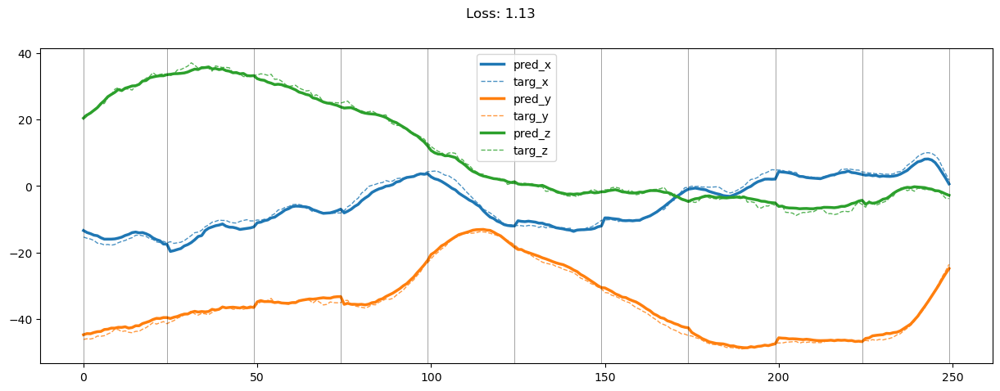

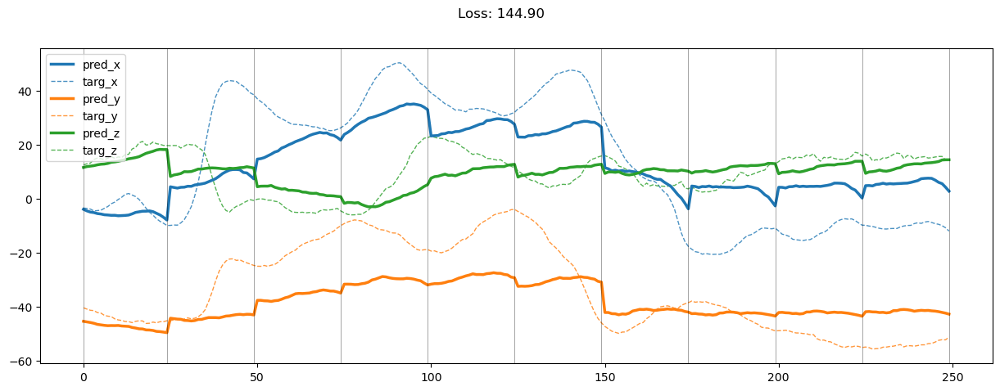

01799: train total loss:  1.103, pred loss:  1.103, valid total loss:  88.635, pred loss:  88.635


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01800: train total loss:  1.103, pred loss:  1.103, valid total loss:  86.822, pred loss:  86.822


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01801: train total loss:  1.139, pred loss:  1.139, valid total loss:  87.198, pred loss:  87.198


100%|██████████| 6/6 [00:00<00:00, 19.86it/s]


01802: train total loss:  1.188, pred loss:  1.188, valid total loss:  85.884, pred loss:  85.884


100%|██████████| 6/6 [00:00<00:00, 19.54it/s]


01803: train total loss:  1.132, pred loss:  1.132, valid total loss:  87.626, pred loss:  87.626


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01804: train total loss:  1.085, pred loss:  1.085, valid total loss:  86.313, pred loss:  86.313


100%|██████████| 6/6 [00:00<00:00, 20.12it/s]


01805: train total loss:  1.098, pred loss:  1.098, valid total loss:  87.313, pred loss:  87.313


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01806: train total loss:  1.123, pred loss:  1.123, valid total loss:  85.669, pred loss:  85.669


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01807: train total loss:  1.126, pred loss:  1.126, valid total loss:  86.951, pred loss:  86.951


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01808: train total loss:  1.221, pred loss:  1.221, valid total loss:  88.305, pred loss:  88.305


100%|██████████| 6/6 [00:00<00:00, 19.48it/s]


01809: train total loss:  1.126, pred loss:  1.126, valid total loss:  88.338, pred loss:  88.338


100%|██████████| 6/6 [00:00<00:00, 17.69it/s]


01810: train total loss:  1.108, pred loss:  1.108, valid total loss:  86.805, pred loss:  86.805


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01811: train total loss:  1.087, pred loss:  1.087, valid total loss:  82.260, pred loss:  82.260


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01812: train total loss:  1.008, pred loss:  1.008, valid total loss:  83.008, pred loss:  83.008


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01813: train total loss:  0.998, pred loss:  0.998, valid total loss:  87.335, pred loss:  87.335


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01814: train total loss:  0.986, pred loss:  0.986, valid total loss:  87.196, pred loss:  87.196


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


01815: train total loss:  0.999, pred loss:  0.999, valid total loss:  84.066, pred loss:  84.066


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01816: train total loss:  0.975, pred loss:  0.975, valid total loss:  85.117, pred loss:  85.117


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01817: train total loss:  0.960, pred loss:  0.960, valid total loss:  85.181, pred loss:  85.181


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


01818: train total loss:  0.985, pred loss:  0.985, valid total loss:  84.320, pred loss:  84.320


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01819: train total loss:  0.949, pred loss:  0.949, valid total loss:  85.877, pred loss:  85.877


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01820: train total loss:  0.930, pred loss:  0.930, valid total loss:  88.855, pred loss:  88.855


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01821: train total loss:  0.922, pred loss:  0.922, valid total loss:  90.299, pred loss:  90.299


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01822: train total loss:  0.943, pred loss:  0.943, valid total loss:  87.117, pred loss:  87.117


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01823: train total loss:  0.960, pred loss:  0.960, valid total loss:  89.478, pred loss:  89.478


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01824: train total loss:  0.945, pred loss:  0.945, valid total loss:  89.000, pred loss:  89.000


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01825: train total loss:  0.924, pred loss:  0.924, valid total loss:  90.597, pred loss:  90.597


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01826: train total loss:  0.893, pred loss:  0.893, valid total loss:  88.407, pred loss:  88.407


100%|██████████| 6/6 [00:00<00:00, 20.88it/s]


01827: train total loss:  0.910, pred loss:  0.910, valid total loss:  86.385, pred loss:  86.385


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01828: train total loss:  0.904, pred loss:  0.904, valid total loss:  89.148, pred loss:  89.148


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01829: train total loss:  1.026, pred loss:  1.026, valid total loss:  88.632, pred loss:  88.632


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01830: train total loss:  1.014, pred loss:  1.014, valid total loss:  87.670, pred loss:  87.670


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01831: train total loss:  1.018, pred loss:  1.018, valid total loss:  91.458, pred loss:  91.458


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


01832: train total loss:  0.969, pred loss:  0.969, valid total loss:  85.585, pred loss:  85.585


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01833: train total loss:  0.989, pred loss:  0.989, valid total loss:  87.466, pred loss:  87.466


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01834: train total loss:  0.976, pred loss:  0.976, valid total loss:  88.295, pred loss:  88.295


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01835: train total loss:  0.946, pred loss:  0.946, valid total loss:  87.566, pred loss:  87.566


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01836: train total loss:  0.996, pred loss:  0.996, valid total loss:  85.651, pred loss:  85.651


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01837: train total loss:  0.997, pred loss:  0.997, valid total loss:  85.708, pred loss:  85.708


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01838: train total loss:  0.987, pred loss:  0.987, valid total loss:  88.379, pred loss:  88.379


100%|██████████| 6/6 [00:00<00:00, 19.70it/s]


01839: train total loss:  1.010, pred loss:  1.010, valid total loss:  91.151, pred loss:  91.151


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


01840: train total loss:  1.017, pred loss:  1.017, valid total loss:  93.506, pred loss:  93.506


100%|██████████| 6/6 [00:00<00:00, 19.67it/s]


01841: train total loss:  0.978, pred loss:  0.978, valid total loss:  91.811, pred loss:  91.811


100%|██████████| 6/6 [00:00<00:00, 18.17it/s]


01842: train total loss:  0.986, pred loss:  0.986, valid total loss:  90.543, pred loss:  90.543


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01843: train total loss:  0.983, pred loss:  0.983, valid total loss:  91.512, pred loss:  91.512


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01844: train total loss:  0.972, pred loss:  0.972, valid total loss:  94.709, pred loss:  94.709


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01845: train total loss:  0.948, pred loss:  0.948, valid total loss:  88.823, pred loss:  88.823


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01846: train total loss:  0.980, pred loss:  0.980, valid total loss:  88.406, pred loss:  88.406


100%|██████████| 6/6 [00:00<00:00, 18.18it/s]


01847: train total loss:  0.992, pred loss:  0.992, valid total loss:  89.373, pred loss:  89.373


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01848: train total loss:  0.962, pred loss:  0.962, valid total loss:  90.271, pred loss:  90.271


100%|██████████| 6/6 [00:00<00:00, 17.51it/s]


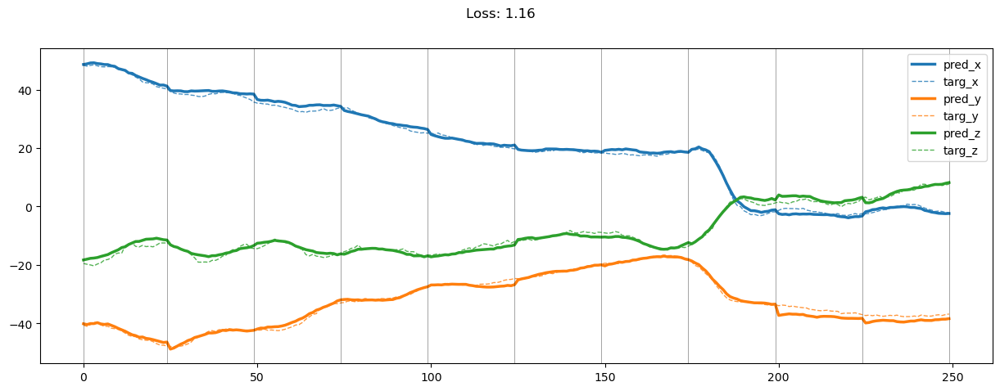

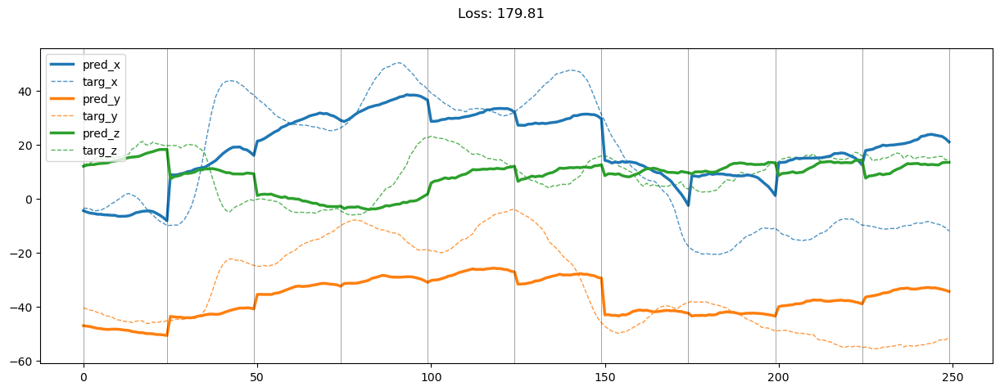

01849: train total loss:  0.954, pred loss:  0.954, valid total loss:  92.044, pred loss:  92.044


100%|██████████| 6/6 [00:00<00:00, 18.21it/s]


01850: train total loss:  0.951, pred loss:  0.951, valid total loss:  90.949, pred loss:  90.949


100%|██████████| 6/6 [00:00<00:00, 17.69it/s]


01851: train total loss:  0.933, pred loss:  0.933, valid total loss:  92.343, pred loss:  92.343


100%|██████████| 6/6 [00:00<00:00, 19.81it/s]


01852: train total loss:  0.927, pred loss:  0.927, valid total loss:  91.870, pred loss:  91.870


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01853: train total loss:  0.993, pred loss:  0.993, valid total loss:  91.965, pred loss:  91.965


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01854: train total loss:  1.004, pred loss:  1.004, valid total loss:  91.864, pred loss:  91.864


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01855: train total loss:  1.024, pred loss:  1.024, valid total loss:  89.056, pred loss:  89.056


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01856: train total loss:  1.038, pred loss:  1.038, valid total loss:  88.287, pred loss:  88.287


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01857: train total loss:  1.015, pred loss:  1.015, valid total loss:  89.065, pred loss:  89.065


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01858: train total loss:  1.029, pred loss:  1.029, valid total loss:  86.446, pred loss:  86.446


100%|██████████| 6/6 [00:00<00:00, 19.73it/s]


01859: train total loss:  1.012, pred loss:  1.012, valid total loss:  90.652, pred loss:  90.652


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01860: train total loss:  1.009, pred loss:  1.009, valid total loss:  89.689, pred loss:  89.689


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01861: train total loss:  1.099, pred loss:  1.099, valid total loss:  89.890, pred loss:  89.890


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01862: train total loss:  1.045, pred loss:  1.045, valid total loss:  90.628, pred loss:  90.628


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01863: train total loss:  0.998, pred loss:  0.998, valid total loss:  90.901, pred loss:  90.901


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01864: train total loss:  0.995, pred loss:  0.995, valid total loss:  84.833, pred loss:  84.833


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01865: train total loss:  1.037, pred loss:  1.037, valid total loss:  91.178, pred loss:  91.178


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01866: train total loss:  1.001, pred loss:  1.001, valid total loss:  92.517, pred loss:  92.517


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01867: train total loss:  0.992, pred loss:  0.992, valid total loss:  95.269, pred loss:  95.269


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01868: train total loss:  0.980, pred loss:  0.980, valid total loss:  102.483, pred loss:  102.483


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01869: train total loss:  1.028, pred loss:  1.028, valid total loss:  96.749, pred loss:  96.749


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


01870: train total loss:  1.031, pred loss:  1.031, valid total loss:  91.984, pred loss:  91.984


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01871: train total loss:  0.991, pred loss:  0.991, valid total loss:  93.519, pred loss:  93.519


100%|██████████| 6/6 [00:00<00:00, 18.18it/s]


01872: train total loss:  1.033, pred loss:  1.033, valid total loss:  90.807, pred loss:  90.807


100%|██████████| 6/6 [00:00<00:00, 18.14it/s]


01873: train total loss:  1.052, pred loss:  1.052, valid total loss:  97.256, pred loss:  97.256


100%|██████████| 6/6 [00:00<00:00, 19.45it/s]


01874: train total loss:  1.006, pred loss:  1.006, valid total loss:  95.283, pred loss:  95.283


100%|██████████| 6/6 [00:00<00:00, 19.74it/s]


01875: train total loss:  0.980, pred loss:  0.980, valid total loss:  90.344, pred loss:  90.344


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01876: train total loss:  0.956, pred loss:  0.956, valid total loss:  89.514, pred loss:  89.514


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01877: train total loss:  0.930, pred loss:  0.930, valid total loss:  88.971, pred loss:  88.971


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01878: train total loss:  0.923, pred loss:  0.923, valid total loss:  88.744, pred loss:  88.744


100%|██████████| 6/6 [00:00<00:00, 19.22it/s]


01879: train total loss:  0.923, pred loss:  0.923, valid total loss:  88.561, pred loss:  88.561


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01880: train total loss:  0.950, pred loss:  0.950, valid total loss:  91.029, pred loss:  91.029


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01881: train total loss:  0.944, pred loss:  0.944, valid total loss:  92.694, pred loss:  92.694


100%|██████████| 6/6 [00:00<00:00, 18.52it/s]


01882: train total loss:  0.931, pred loss:  0.931, valid total loss:  93.680, pred loss:  93.680


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01883: train total loss:  0.904, pred loss:  0.904, valid total loss:  88.202, pred loss:  88.202


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01884: train total loss:  0.906, pred loss:  0.906, valid total loss:  87.068, pred loss:  87.068


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01885: train total loss:  0.896, pred loss:  0.896, valid total loss:  86.952, pred loss:  86.952


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01886: train total loss:  0.930, pred loss:  0.930, valid total loss:  87.926, pred loss:  87.926


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01887: train total loss:  0.912, pred loss:  0.912, valid total loss:  87.409, pred loss:  87.409


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01888: train total loss:  0.995, pred loss:  0.995, valid total loss:  90.693, pred loss:  90.693


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01889: train total loss:  0.940, pred loss:  0.940, valid total loss:  93.947, pred loss:  93.947


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01890: train total loss:  0.896, pred loss:  0.896, valid total loss:  94.822, pred loss:  94.822


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01891: train total loss:  0.897, pred loss:  0.897, valid total loss:  89.843, pred loss:  89.843


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01892: train total loss:  0.870, pred loss:  0.870, valid total loss:  92.628, pred loss:  92.628


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01893: train total loss:  0.884, pred loss:  0.884, valid total loss:  93.322, pred loss:  93.322


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01894: train total loss:  0.869, pred loss:  0.869, valid total loss:  92.284, pred loss:  92.284


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01895: train total loss:  0.915, pred loss:  0.915, valid total loss:  93.294, pred loss:  93.294


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01896: train total loss:  0.904, pred loss:  0.904, valid total loss:  88.194, pred loss:  88.194


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


01897: train total loss:  0.900, pred loss:  0.900, valid total loss:  87.709, pred loss:  87.709


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01898: train total loss:  0.930, pred loss:  0.930, valid total loss:  93.201, pred loss:  93.201


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


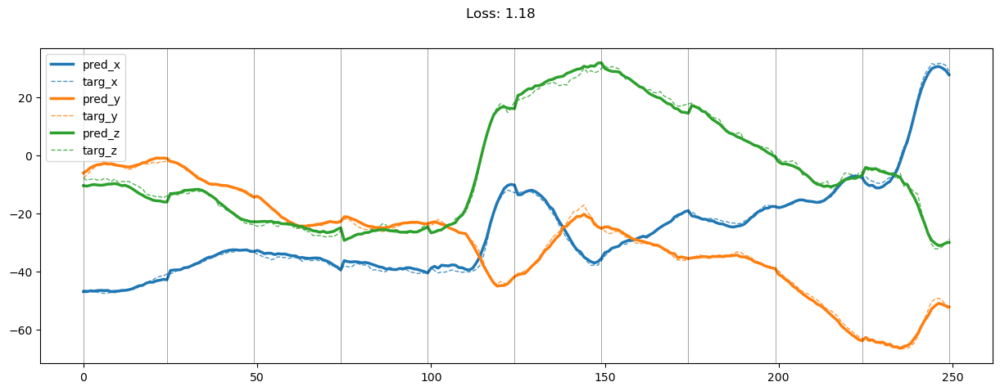

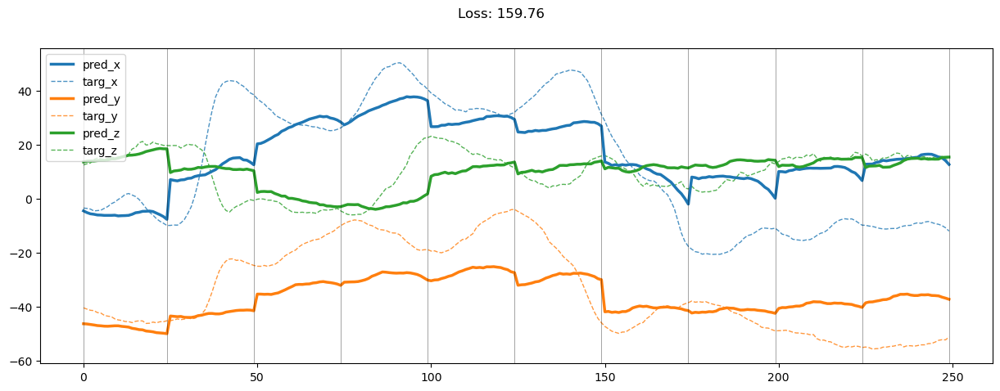

01899: train total loss:  0.915, pred loss:  0.915, valid total loss:  92.240, pred loss:  92.240


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01900: train total loss:  0.865, pred loss:  0.865, valid total loss:  91.358, pred loss:  91.358


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01901: train total loss:  0.893, pred loss:  0.893, valid total loss:  87.502, pred loss:  87.502


100%|██████████| 6/6 [00:00<00:00, 18.55it/s]


01902: train total loss:  0.906, pred loss:  0.906, valid total loss:  89.315, pred loss:  89.315


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01903: train total loss:  0.948, pred loss:  0.948, valid total loss:  93.922, pred loss:  93.922


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01904: train total loss:  0.961, pred loss:  0.961, valid total loss:  95.141, pred loss:  95.141


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01905: train total loss:  0.968, pred loss:  0.968, valid total loss:  93.622, pred loss:  93.622


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01906: train total loss:  0.976, pred loss:  0.976, valid total loss:  94.235, pred loss:  94.235


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01907: train total loss:  1.002, pred loss:  1.002, valid total loss:  90.553, pred loss:  90.553


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01908: train total loss:  1.003, pred loss:  1.003, valid total loss:  89.954, pred loss:  89.954


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01909: train total loss:  0.952, pred loss:  0.952, valid total loss:  91.189, pred loss:  91.189


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01910: train total loss:  0.947, pred loss:  0.947, valid total loss:  92.887, pred loss:  92.887


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01911: train total loss:  0.950, pred loss:  0.950, valid total loss:  89.532, pred loss:  89.532


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01912: train total loss:  0.914, pred loss:  0.914, valid total loss:  92.331, pred loss:  92.331


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01913: train total loss:  0.948, pred loss:  0.948, valid total loss:  94.328, pred loss:  94.328


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01914: train total loss:  0.910, pred loss:  0.910, valid total loss:  90.038, pred loss:  90.038


100%|██████████| 6/6 [00:00<00:00, 19.60it/s]


01915: train total loss:  0.889, pred loss:  0.889, valid total loss:  89.964, pred loss:  89.964


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01916: train total loss:  0.887, pred loss:  0.887, valid total loss:  93.175, pred loss:  93.175


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01917: train total loss:  0.870, pred loss:  0.870, valid total loss:  91.760, pred loss:  91.760


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01918: train total loss:  0.865, pred loss:  0.865, valid total loss:  96.429, pred loss:  96.429


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01919: train total loss:  0.851, pred loss:  0.851, valid total loss:  100.218, pred loss:  100.218


100%|██████████| 6/6 [00:00<00:00, 19.87it/s]


01920: train total loss:  0.870, pred loss:  0.870, valid total loss:  96.993, pred loss:  96.993


100%|██████████| 6/6 [00:00<00:00, 19.96it/s]


01921: train total loss:  0.840, pred loss:  0.840, valid total loss:  95.831, pred loss:  95.831


100%|██████████| 6/6 [00:00<00:00, 18.34it/s]


01922: train total loss:  0.862, pred loss:  0.862, valid total loss:  92.182, pred loss:  92.182


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01923: train total loss:  0.822, pred loss:  0.822, valid total loss:  93.056, pred loss:  93.056


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


01924: train total loss:  0.859, pred loss:  0.859, valid total loss:  95.867, pred loss:  95.867


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01925: train total loss:  0.850, pred loss:  0.850, valid total loss:  91.074, pred loss:  91.074


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01926: train total loss:  0.835, pred loss:  0.835, valid total loss:  91.083, pred loss:  91.083


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01927: train total loss:  0.850, pred loss:  0.850, valid total loss:  88.156, pred loss:  88.156


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01928: train total loss:  0.834, pred loss:  0.834, valid total loss:  90.610, pred loss:  90.610


100%|██████████| 6/6 [00:00<00:00, 19.25it/s]


01929: train total loss:  0.858, pred loss:  0.858, valid total loss:  93.608, pred loss:  93.608


100%|██████████| 6/6 [00:00<00:00, 19.14it/s]


01930: train total loss:  0.885, pred loss:  0.885, valid total loss:  89.713, pred loss:  89.713


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01931: train total loss:  1.679, pred loss:  1.679, valid total loss:  105.479, pred loss:  105.479


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01932: train total loss:  2.576, pred loss:  2.576, valid total loss:  89.929, pred loss:  89.929


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01933: train total loss:  2.638, pred loss:  2.638, valid total loss:  90.378, pred loss:  90.378


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01934: train total loss:  2.623, pred loss:  2.623, valid total loss:  92.379, pred loss:  92.379


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01935: train total loss:  2.954, pred loss:  2.954, valid total loss:  97.846, pred loss:  97.846


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01936: train total loss:  2.635, pred loss:  2.635, valid total loss:  103.433, pred loss:  103.433


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01937: train total loss:  2.661, pred loss:  2.661, valid total loss:  97.755, pred loss:  97.755


100%|██████████| 6/6 [00:00<00:00, 19.56it/s]


01938: train total loss:  2.766, pred loss:  2.766, valid total loss:  112.374, pred loss:  112.374


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01939: train total loss:  2.946, pred loss:  2.946, valid total loss:  106.094, pred loss:  106.094


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01940: train total loss:  3.557, pred loss:  3.557, valid total loss:  112.056, pred loss:  112.056


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01941: train total loss:  3.781, pred loss:  3.781, valid total loss:  114.665, pred loss:  114.665


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01942: train total loss:  3.594, pred loss:  3.594, valid total loss:  109.001, pred loss:  109.001


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01943: train total loss:  3.376, pred loss:  3.376, valid total loss:  92.742, pred loss:  92.742


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01944: train total loss:  2.963, pred loss:  2.963, valid total loss:  100.014, pred loss:  100.014


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01945: train total loss:  2.691, pred loss:  2.691, valid total loss:  88.156, pred loss:  88.156


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01946: train total loss:  2.353, pred loss:  2.353, valid total loss:  84.057, pred loss:  84.057


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01947: train total loss:  2.290, pred loss:  2.290, valid total loss:  77.965, pred loss:  77.965


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01948: train total loss:  1.969, pred loss:  1.969, valid total loss:  81.330, pred loss:  81.330


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


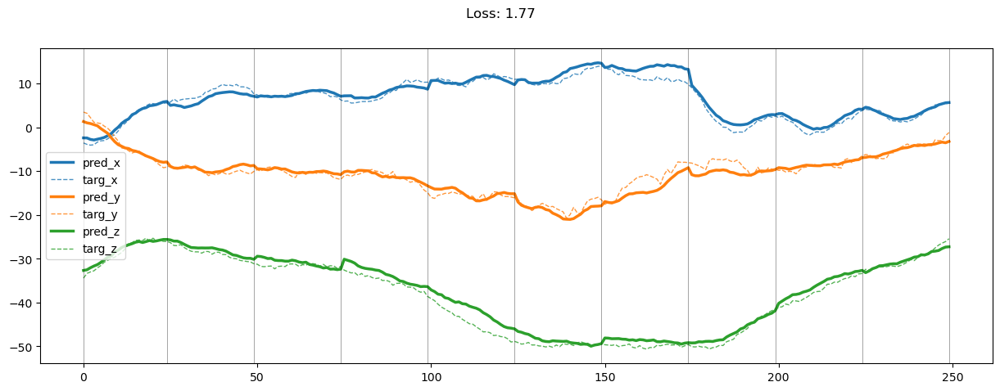

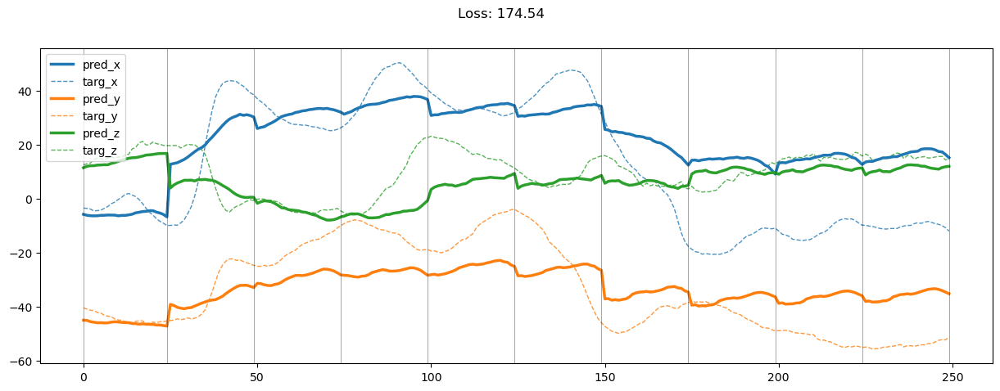

01949: train total loss:  1.802, pred loss:  1.802, valid total loss:  86.099, pred loss:  86.099


100%|██████████| 6/6 [00:00<00:00, 18.75it/s]


01950: train total loss:  1.595, pred loss:  1.595, valid total loss:  86.049, pred loss:  86.049


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01951: train total loss:  1.489, pred loss:  1.489, valid total loss:  86.919, pred loss:  86.919


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01952: train total loss:  1.328, pred loss:  1.328, valid total loss:  85.123, pred loss:  85.123


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01953: train total loss:  1.269, pred loss:  1.269, valid total loss:  88.377, pred loss:  88.377


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01954: train total loss:  1.230, pred loss:  1.230, valid total loss:  85.159, pred loss:  85.159


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01955: train total loss:  1.165, pred loss:  1.165, valid total loss:  84.370, pred loss:  84.370


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01956: train total loss:  1.147, pred loss:  1.147, valid total loss:  84.613, pred loss:  84.613


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01957: train total loss:  1.099, pred loss:  1.099, valid total loss:  81.277, pred loss:  81.277


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01958: train total loss:  1.046, pred loss:  1.046, valid total loss:  83.072, pred loss:  83.072


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01959: train total loss:  1.087, pred loss:  1.087, valid total loss:  83.257, pred loss:  83.257


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01960: train total loss:  1.052, pred loss:  1.052, valid total loss:  81.033, pred loss:  81.033


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01961: train total loss:  1.078, pred loss:  1.078, valid total loss:  78.499, pred loss:  78.499


100%|██████████| 6/6 [00:00<00:00, 20.84it/s]


01962: train total loss:  1.055, pred loss:  1.055, valid total loss:  78.346, pred loss:  78.346


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01963: train total loss:  1.081, pred loss:  1.081, valid total loss:  79.285, pred loss:  79.285


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01964: train total loss:  1.057, pred loss:  1.057, valid total loss:  83.828, pred loss:  83.828


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01965: train total loss:  0.996, pred loss:  0.996, valid total loss:  84.851, pred loss:  84.851


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01966: train total loss:  0.987, pred loss:  0.987, valid total loss:  79.800, pred loss:  79.800


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


01967: train total loss:  0.960, pred loss:  0.960, valid total loss:  79.852, pred loss:  79.852


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01968: train total loss:  0.948, pred loss:  0.948, valid total loss:  86.510, pred loss:  86.510


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01969: train total loss:  0.965, pred loss:  0.965, valid total loss:  82.684, pred loss:  82.684


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01970: train total loss:  0.975, pred loss:  0.975, valid total loss:  87.570, pred loss:  87.570


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01971: train total loss:  0.938, pred loss:  0.938, valid total loss:  87.755, pred loss:  87.755


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01972: train total loss:  0.898, pred loss:  0.898, valid total loss:  89.543, pred loss:  89.543


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01973: train total loss:  0.906, pred loss:  0.906, valid total loss:  89.311, pred loss:  89.311


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01974: train total loss:  0.909, pred loss:  0.909, valid total loss:  87.612, pred loss:  87.612


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01975: train total loss:  0.920, pred loss:  0.920, valid total loss:  87.723, pred loss:  87.723


100%|██████████| 6/6 [00:00<00:00, 20.17it/s]


01976: train total loss:  0.887, pred loss:  0.887, valid total loss:  85.789, pred loss:  85.789


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01977: train total loss:  0.903, pred loss:  0.903, valid total loss:  91.277, pred loss:  91.277


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01978: train total loss:  0.891, pred loss:  0.891, valid total loss:  91.067, pred loss:  91.067


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01979: train total loss:  0.884, pred loss:  0.884, valid total loss:  86.966, pred loss:  86.966


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01980: train total loss:  0.908, pred loss:  0.908, valid total loss:  83.403, pred loss:  83.403


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01981: train total loss:  0.870, pred loss:  0.870, valid total loss:  86.019, pred loss:  86.019


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01982: train total loss:  0.867, pred loss:  0.867, valid total loss:  85.404, pred loss:  85.404


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01983: train total loss:  0.914, pred loss:  0.914, valid total loss:  88.979, pred loss:  88.979


100%|██████████| 6/6 [00:00<00:00, 20.86it/s]


01984: train total loss:  0.861, pred loss:  0.861, valid total loss:  87.864, pred loss:  87.864


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01985: train total loss:  0.858, pred loss:  0.858, valid total loss:  89.104, pred loss:  89.104


100%|██████████| 6/6 [00:00<00:00, 20.87it/s]


01986: train total loss:  0.866, pred loss:  0.866, valid total loss:  85.116, pred loss:  85.116


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01987: train total loss:  0.882, pred loss:  0.882, valid total loss:  84.283, pred loss:  84.283


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01988: train total loss:  0.857, pred loss:  0.857, valid total loss:  88.046, pred loss:  88.046


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


01989: train total loss:  0.851, pred loss:  0.851, valid total loss:  89.718, pred loss:  89.718


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01990: train total loss:  0.868, pred loss:  0.868, valid total loss:  92.557, pred loss:  92.557


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01991: train total loss:  0.866, pred loss:  0.866, valid total loss:  92.346, pred loss:  92.346


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01992: train total loss:  0.855, pred loss:  0.855, valid total loss:  93.514, pred loss:  93.514


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01993: train total loss:  0.871, pred loss:  0.871, valid total loss:  91.113, pred loss:  91.113


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


01994: train total loss:  0.844, pred loss:  0.844, valid total loss:  90.369, pred loss:  90.369


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01995: train total loss:  0.851, pred loss:  0.851, valid total loss:  94.207, pred loss:  94.207


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01996: train total loss:  0.869, pred loss:  0.869, valid total loss:  96.481, pred loss:  96.481


100%|██████████| 6/6 [00:00<00:00, 20.83it/s]


01997: train total loss:  0.840, pred loss:  0.840, valid total loss:  97.917, pred loss:  97.917


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01998: train total loss:  0.861, pred loss:  0.861, valid total loss:  96.818, pred loss:  96.818


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


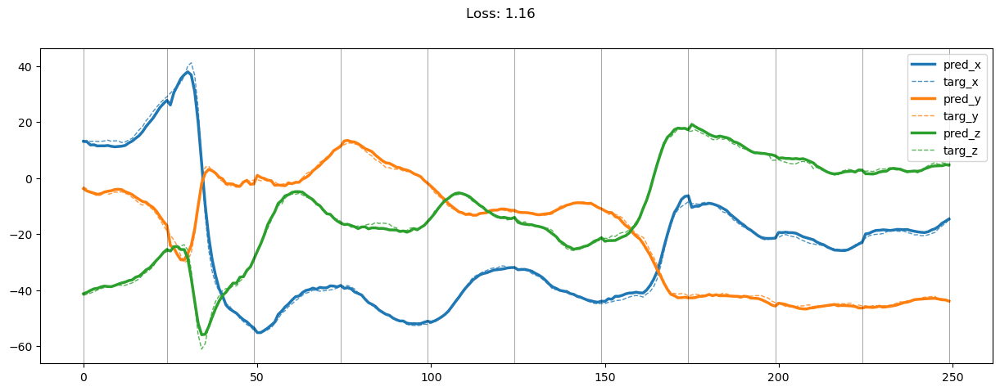

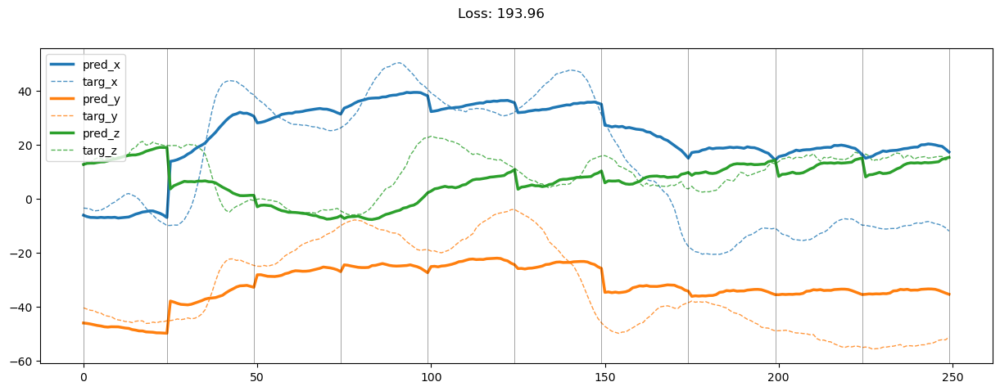

01999: train total loss:  0.868, pred loss:  0.868, valid total loss:  92.243, pred loss:  92.243


In [29]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 50 == 0:
        draw = True
    
    train_loss, train_pred_loss = train(model, train_loader, optimizer, draw)
    valid_loss, valid_pred_loss = evalute(model, valid_loader, draw)
    
    draw = False
    
    ep = str(epoch).zfill(5)
    print(f'{ep}: train total loss: {train_loss: 2.3f}, pred loss: {train_pred_loss: 2.3f}, valid total loss: {valid_loss: 2.3f}, pred loss: {valid_pred_loss: 2.3f}')

In [30]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, 9:12])

            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            
            results.extend(zip(predict_mag.detach().cpu().numpy(), target_data[:, :, :, 9:12].cpu().numpy()))
            
            break
    
    return np.array(results)

In [31]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [32]:
results = output_eval(model, train_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)

TypeError: forward() missing 1 required positional argument: 'source_mag'

In [ ]:
results = output_eval(model, valid_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)